# Which locations (lat-lon pairs) occur with the most frequency? Can you identify clusters of such lat-lon pairs i.e. areas where a lot of lat-lon pairs are located near each other. 

In [1]:
# import dependencies
import pandas as pd
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Read the Excel file into a pandas DataFrame
df = pd.read_excel("Data.xlsx")

In [3]:
# check number of rows and columns
df.shape

(288156, 5)

In [4]:
# Replace "-" with 0 in the longitude and latitude columns to make them numeric values and strip for removing whitespaces
df["LONGITUDE"] = [str(elem).strip().replace("-","0") for elem in df["LONGITUDE"]]
df["LATITUDE"] = [str(elem).strip().replace("-","0") for elem in df["LATITUDE"]]

# convert column type to float
df["LATITUDE"] = df["LATITUDE"].astype(float)
df["LONGITUDE"] = df["LONGITUDE"].astype(float)

In [5]:
# Group the data by latitude and longitude and count the occurrences
location_counts = df.groupby(["LATITUDE", "LONGITUDE"]).size().reset_index(name="Frequency")

# Sort the locations by frequency in descending order
sorted_locations = location_counts.sort_values(by="Frequency", ascending=False)

# Print the top 5 locations with the highest frequency
most_frequent_locations = sorted_locations.head()
print("Top 5 locations with the highest frequency:")
print(most_frequent_locations)

Top 5 locations with the highest frequency:
        LATITUDE  LONGITUDE  Frequency
4116   74.817220  22.898010        533
30235  81.807833  25.179889        378
32336  82.696740  21.983538        255
36945  85.265790  23.728730        236
11188  77.161120   9.743660        212


In [6]:
# Perform clustering on latitude and longitude using K-means algorithm
coordinates = df[["LATITUDE", "LONGITUDE"]]
kmeans = KMeans(n_clusters=10) 
kmeans.fit(coordinates)

# Add the cluster labels to the DataFrame
df["Cluster"] = kmeans.labels_

In [7]:
# Print the clusters and their corresponding lat-lon pairs
clusters = df.groupby("Cluster")[["LATITUDE", "LONGITUDE"]].apply(lambda x: list(x.values))
print("\nClusters of lat-lon pairs:")
for cluster, locations in clusters.items():
    print(f"Cluster {cluster+1}:","-"*100)
    for location in locations:
        print(location)
    print()


Clusters of lat-lon pairs:
Cluster 1: ----------------------------------------------------------------------------------------------------
[77.12171 14.75066]
[77.12171 14.75066]
[77.12171 14.75066]
[77.12171 14.75066]
[77.12171 14.75066]
[77.12171 14.75066]
[77.12171 14.75066]
[77.12171 14.75066]
[77.12171 14.75066]
[77.31708 14.8349 ]
[77.31708 14.8349 ]
[77.31708 14.8349 ]
[77.31708 14.8349 ]
[77.39896 14.52448]
[77.39896 14.52448]
[77.39896 14.52448]
[77.44993 14.45669]
[77.8238  14.03483]
[77.80134 14.12548]
[77.80134 14.12548]
[77.81228 14.77501]
[77.15331 14.61392]
[77.66185 14.41251]
[77.83521 14.06748]
[77.83521 14.06748]
[77.77697 14.9779 ]
[77.77697 14.9779 ]
[77.08939 14.9777 ]
[77.78291667 14.096     ]
[77.76913 14.08517]
[77.29761 14.64001]
[77.29761 14.64001]
[77.309   14.37852]
[77.309   14.37852]
[77.13888 14.70651]
[77.74937 14.75946]
[77.08939 14.9777 ]
[77.67355 14.33781]
[77.74838 14.84876]
[77.74838 14.84876]
[77.8055     14.14233333]
[77.8055     14.14233333]
[7

[77.76587 14.01872]
[77.76587 14.01872]
[77.15298 14.49809]
[77.7584 14.0641]
[77.81377 14.14555]
[77.78623 14.08765]
[77.97416 14.76674]
[77.32567 14.27607]
[77.01564 14.6287 ]
[77.33450333 14.31914   ]
[77.33450333 14.31914   ]
[77.33450333 14.31914   ]
[77.43433 14.11436]
[77.56712 14.29051]
[77.59045 14.16061]
[77.80588 14.2577 ]
[77.1255  14.66819]
[77.29433 14.78495]
[77.18073 14.13384]
[77.34786 14.16512]
[77.41052 14.26733]
[77.12682 14.65786]
[77.41859 14.20674]
[77.41859 14.20674]
[77.84883 14.05694]
[77.84883 14.05694]
[77.59045 14.16061]
[77.50666667 14.21883333]
[77.50666667 14.21883333]
[77.50666667 14.21883333]
[77.50666667 14.21883333]
[77.86604 14.13733]
[77.39868 14.30918]
[77.39868 14.30918]
[77.96699 14.93692]
[77.32560167 14.29179167]
[77.62153 14.4243 ]
[77.62153 14.4243 ]
[77.73697 14.76009]
[77.73697 14.76009]
[77.73697 14.76009]
[77.78557 14.14453]
[77.78557 14.14453]
[77.59045 14.16061]
[77.70982 14.88043]
[77.00328 14.68554]
[77.11424 14.69957]
[77.912342 14.

[77.92592667 14.989105  ]
[77.829765 14.079014]
[77.60995 14.43222]
[77.1574  14.42519]
[77.99804 14.5632 ]
[77.99804 14.5632 ]
[77.99804 14.5632 ]
[77.99804 14.5632 ]
[77.99804 14.5632 ]
[77.99804 14.5632 ]
[77.86395 14.68816]
[77.86395 14.68816]
[77.95861 14.90135]
[77.43581    14.17152778]
[77.94255333 14.92016667]
[77.84631 14.7282 ]
[77.78758    14.25633333]
[77.78758    14.25633333]
[77.99502 14.86013]
[77.80425 14.09063]
[77.76299 14.79069]
[77.64854 14.24091]
[77.80735 14.00302]
[77.93236 14.7819 ]
[77.93363 14.98951]
[77.59448 14.07413]
[77.55897 14.07389]
[77.8829  14.77501]
[77.79416667 14.10777778]
[77.15651 14.54857]
[77.24879 14.34704]
[77.24879 14.34704]
[77.73404 14.02466]
[77.309   14.37852]
[77.309   14.37852]
[77.309   14.37852]
[77.59279 14.16543]
[77.59279 14.16543]
[77.3721  14.37927]
[77.98199 14.01058]
[77.309   14.37852]
[77.309   14.37852]
[77.309   14.37852]
[77.309   14.37852]
[77.309   14.37852]
[77.09312 14.95107]
[77.26227 14.29053]
[77.8707  14.61087]
[7

[77.76328    14.10255556]
[77.68916 14.02522]
[77.91621 14.63428]
[77.808      14.07836111]
[77.94336 14.0087 ]
[77.69088 14.88727]
[77.044835   14.93790333]
[77.11943 14.501  ]
[77.11943 14.501  ]
[77.11943 14.501  ]
[77.11943 14.501  ]
[77.11943 14.501  ]
[77.01039 14.60683]
[77.57262 14.23008]
[77.57262 14.23008]
[77.57262 14.23008]
[77.88644 14.72272]
[77.88644 14.72272]
[77.88644 14.72272]
[77.4369  14.16611]
[77.19434 14.10526]
[77.80425 14.09063]
[77.36842 14.32022]
[77.14087 14.63844]
[77.14087 14.63844]
[77.31248 14.80507]
[77.79701 14.96566]
[77.23208 14.83862]
[77.06751 14.89717]
[77.716931 14.590969]
[77.72609 14.85974]
[77.72609 14.85974]
[77.72609 14.85974]
[77.72609 14.85974]
[77.73468 14.94225]
[77.73468 14.94225]
[77.73468 14.94225]
[77.83521 14.06748]
[77.83442667 14.082635  ]
[77.829275 14.853444]
[77.829275 14.853444]
[77.290311 14.302513]
[77.290311 14.302513]
[77.290311 14.302513]
[77.290311 14.302513]
[77.290311 14.302513]
[77.803516 14.096907]
[77.36505 14.20846

[77.311178 14.375303]
[77.311178 14.375303]
[77.81999 14.27889]
[77.81999 14.27889]
[77.0245398 14.9406756]
[77.0245398 14.9406756]
[77.0245398 14.9406756]
[77.0245398 14.9406756]
[77.80178 14.12961]
[77.82284 14.06827]
[77.81985 14.00303]
[77.81985 14.00303]
[77.73404 14.02466]
[77.73404 14.02466]
[77.58938 14.01564]
[77.58938 14.01564]
[77.96105556 14.96644444]
[77.96105556 14.96644444]
[77.96105556 14.96644444]
[77.96105556 14.96644444]
[77.96105556 14.96644444]
[77.96105556 14.96644444]
[77.96105556 14.96644444]
[77.31831 14.57264]
[77.938455 14.706   ]
[77.938455 14.706   ]
[77.938455 14.706   ]
[77.938455 14.706   ]
[77.79383 14.00253]
[77.79383 14.00253]
[77.12354 14.92118]
[77.12354 14.92118]
[77.204845   14.85147667]
[77.84332 14.36577]
[77.31831 14.57264]
[77.54973 14.07563]
[77.06297 14.09971]
[77.06297 14.09971]
[77.80704 14.90219]
[77.1718  14.51358]
[77.46176 14.34926]
[77.46176 14.34926]
[77.46176 14.34926]
[77.06681 14.75347]
[77.06681 14.75347]
[77.94133 14.81375]
[77.

[77.87287 14.7059 ]
[77.80562 14.12626]
[77.80562 14.12626]
[77.80562 14.12626]
[77.831035   14.75991333]
[77.10001 14.94482]
[77.40587 14.44928]
[77.59045 14.16061]
[77.81989 14.09095]
[77.81989 14.09095]
[77.81989 14.09095]
[77.76625 14.86403]
[77.76625 14.86403]
[77.85107 14.73537]
[77.85107 14.73537]
[77.286616 14.50375 ]
[77.9611  14.67655]
[77.29809 14.53962]
[77.29809 14.53962]
[77.29809 14.53962]
[77.29809 14.53962]
[77.96417 14.60122]
[77.96417 14.60122]
[77.78465 14.66597]
[77.30034 14.37336]
[77.30034 14.37336]
[77.247  14.7726]
[77.69674    14.98353833]
[77.44682 14.06236]
[77.44682 14.06236]
[77.44682 14.06236]
[77.44682 14.06236]
[77.73421 14.0845 ]
[77.22479 14.17918]
[77.42571 14.32986]
[77.33450333 14.31914   ]
[77.54924 14.05299]
[77.912342 14.7241  ]
[77.52197 14.38548]
[77.41052 14.26733]
[77.41052 14.26733]
[77.41052 14.26733]
[77.15825 14.73993]
[77.20752 14.55702]
[77.09623 14.96883]
[77.09623 14.96883]
[77.56712 14.29051]
[77.56712 14.29051]
[77.56712 14.29051]


[77.79807 14.01536]
[77.82155 14.94017]
[77.84696 14.75726]
[77.68752 14.92629]
[77.99405 14.68709]
[77.151895 14.150925]
[77.151895 14.150925]
[77.448235 14.613863]
[77.73244 14.64061]
[77.81824 14.7783 ]
[77.8093  14.08516]
[77.72687 14.64357]
[77.72687 14.64357]
[77.15298 14.49809]
[77.15298 14.49809]
[77.15298 14.49809]
[77.15298 14.49809]
[77.7584 14.0641]
[77.80886 14.15258]
[77.22479 14.17918]
[77.31831 14.57264]
[77.90774 14.81975]
[77.90774 14.81975]
[77.90774 14.81975]
[77.937769 14.908476]
[77.13863 14.55326]
[77.92425 14.68689]
[77.91058 14.71031]
[77.91058 14.71031]
[77.91058 14.71031]
[77.54973 14.07563]
[77.79807 14.01536]
[77.912342 14.7241  ]
[77.912342 14.7241  ]
[77.99793 14.90861]
[77.99793 14.90861]
[77.99793 14.90861]
[77.84883 14.05694]
[77.28389 14.45424]
[77.28389 14.45424]
[77.86604 14.13733]
[77.86604 14.13733]
[77.86604 14.13733]
[77.86604 14.13733]
[77.86604 14.13733]
[77.12771 14.55919]
[77.88037 14.67256]
[77.80588 14.2577 ]
[77.59045 14.16061]
[77.79866 

[78.06431 13.63393]
[78.06431 13.63393]
[78.06431 13.63393]
[78.06431 13.63393]
[78.98   13.7193]
[78.16112 13.74366]
[78.72399 13.05267]
[78.81358 13.06026]
[78.198549 13.292437]
[78.92975 13.83699]
[78.92975 13.83699]
[78.16112 13.74366]
[78.23887 13.71016]
[78.16112 13.74366]
[78.18616 13.45147]
[78.34066 13.20865]
[78.34066 13.20865]
[78.34066 13.20865]
[78.74637  13.278131]
[78.74637  13.278131]
[78.74637  13.278131]
[78.64819 13.98461]
[78.23887 13.71016]
[78.16112 13.74366]
[78.23887 13.71016]
[78.16112 13.74366]
[78.259387 13.523732]
[78.46176 13.34926]
[78.58485 13.09113]
[78.23887 13.71016]
[78.02795 13.59729]
[78.23887 13.71016]
[78.58756 13.16664]
[78.16112 13.74366]
[78.78623 13.08765]
[78.23887 13.71016]
[78.52364 13.36908]
[78.96785 13.96083]
[78.16112 13.74366]
[78.23887 13.71016]
[78.96397 13.6442 ]
[78.80644 13.06903]
[78.88644 13.38898]
[78.88644 13.38898]
[78.88644 13.38898]
[78.88644 13.38898]
[78.16112 13.74366]
[78.23887 13.71016]
[78.23688 13.4095 ]
[78.2034944 

[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.0421086 13.2905967]
[78.95831 13.70858]
[78.259387 13.523732]
[78.09718 13.49566]
[78.09718 13.49566]
[78.23538 13.64918]
[78.31953 13.01507]
[78.15195 13.70627]
[78.31953 13.01507]
[78.83025 13.06828]
[78.69088 13.88727]
[78.18266 13.56626]
[78.28137 13.49168]
[78.65482 13.39388]
[78.65482 13.39388]
[78.31953 13.01507]
[78.89697 13.16822]
[78.35175 13.35685]
[78.03983    13.90191667]
[78.31953 13.01507]
[78.63844 13.44714]
[78.80914 13.01706]
[78.80914 13.01706]
[78.10152 13.4866 ]
[78.86936 13.0382 ]
[78.18073 13.13384]
[78.8026   13.058111]
[78.31953 13.01507]
[78.37119 13.21255]
[78.23538 13.64918]
[78.23538 13.64918]
[78.69477 13.41618]
[78.69477 

[78.54097 13.10041]
[78.59448 13.07413]
[78.61557 13.94747]
[78.61557 13.94747]
[78.899833 13.673917]
[78.899833 13.673917]
[78.899833 13.673917]
[78.899833 13.673917]
[78.899833 13.673917]
[78.899833 13.673917]
[78.64625 13.41662]
[78.64625 13.41662]
[78.64625 13.41662]
[78.683676 13.183975]
[78.683676 13.183975]
[78.683676 13.183975]
[78.68603  13.044688]
[78.03813 13.69831]
[78.59448 13.07413]
[78.13419 13.9006 ]
[78.66148 13.17335]
[78.67151 13.11753]
[78.79416667 13.10777778]
[78.81215 13.04994]
[78.85152 13.95995]
[78.74244 13.25325]
[78.81215 13.04994]
[78.28365 13.49553]
[78.36477 13.38548]
[78.39682 13.12675]
[78.76588 13.07956]
[78.76588 13.07956]
[78.32969 13.56295]
[78.53417 13.05732]
[78.59448 13.07413]
[78.84373 13.9964 ]
[78.81747 13.13741]
[78.44144 13.12865]
[78.41499 13.60941]
[78.966655 13.837536]
[78.14241 13.88288]
[78.84373 13.9964 ]
[78.08768 13.69946]
[78.814908 13.109892]
[78.814908 13.109892]
[78.22975 13.51322]
[78.22975 13.51322]
[78.10152 13.4866 ]
[78.1015

[78.77314 13.09604]
[78.77314 13.09604]
[78.85482 13.78082]
[78.01963 13.64616]
[78.46175 13.3345 ]
[78.94141 13.6463 ]
[78.344245 13.331902]
[78.344245 13.331902]
[78.344245 13.331902]
[78.81444444 13.09666667]
[78.01963 13.64616]
[78.75496 13.11437]
[78.01963 13.64616]
[78.46711 13.07356]
[78.46711 13.07356]
[78.87929 13.15316]
[78.9233  13.61064]
[78.42233 13.23936]
[78.01963 13.64616]
[78.0772  13.64799]
[78.0772  13.64799]
[78.44648 13.21145]
[78.44648 13.21145]
[78.44648 13.21145]
[78.44648 13.21145]
[78.81602 13.19688]
[78.05353 13.81054]
[78.31019444 13.18402778]
[78.71276 13.43353]
[78.31953 13.01507]
[78.95072 13.66298]
[78.95072 13.66298]
[78.01963 13.64616]
[78.75496 13.11437]
[78.79436 13.11657]
[78.05353 13.81054]
[78.05353 13.81054]
[78.05353 13.81054]
[78.25851 13.56167]
[78.25851 13.56167]
[78.26566 13.47304]
[78.77927 13.07805]
[78.84846 13.39072]
[78.84846 13.39072]
[78.01963 13.64616]
[78.27192 13.5361 ]
[78.01884 13.61959]
[78.03462 13.6315 ]
[78.50794 13.19605]
[7

[78.81961 13.07418]
[78.81961 13.07418]
[78.8411725 13.1210459]
[78.40184 13.3299 ]
[78.40184 13.3299 ]
[78.66981 13.03523]
[78.96473 13.23952]
[78.62802 13.33086]
[78.62802 13.33086]
[78.62802 13.33086]
[78.62802 13.33086]
[78.8411725 13.1210459]
[78.8411725 13.1210459]
[78.81747 13.13741]
[78.40511 13.18504]
[78.8026   13.058111]
[78.11527778 13.92666667]
[78.24197 13.51152]
[78.12709 13.25885]
[78.31953 13.01507]
[78.10466 13.89912]
[78.721865 13.003136]
[78.47601 13.12479]
[78.12709 13.25885]
[78.0245398 13.9406756]
[78.12709 13.25885]
[78.12709 13.25885]
[78.12709 13.25885]
[78.22147 13.50249]
[78.59482 13.04142]
[78.37758 13.21019]
[78.59482 13.04142]
[78.59482 13.04142]
[78.59482 13.04142]
[78.14539 13.48672]
[78.12709 13.25885]
[78.12709 13.25885]
[78.12709 13.25885]
[78.11057167 13.92684833]
[78.12709 13.25885]
[78.12709 13.25885]
[78.81181 13.3103 ]
[78.81181 13.3103 ]
[78.39996 13.37796]
[78.39996 13.37796]
[78.631481 13.302023]
[78.946216 13.759579]
[78.946216 13.759579]
[7

[78.67151 13.11753]
[78.68177 13.32071]
[78.79198 13.36754]
[78.79198 13.36754]
[78.79198 13.36754]
[78.01295 13.65911]
[78.13528 13.92762]
[78.14297    13.50080556]
[78.31566 13.25404]
[78.09312 13.95107]
[78.79286 13.03022]
[78.83517 13.34568]
[78.71722 13.23902]
[78.51299 13.01363]
[78.81971    13.03765833]
[78.876674 13.168666]
[78.876674 13.168666]
[78.18031 13.93743]
[78.97801 13.6809 ]
[78.92323 13.29631]
[78.68177 13.32071]
[78.79198 13.36754]
[78.79198 13.36754]
[78.92323 13.29631]
[78.92323 13.29631]
[78.92323 13.29631]
[78.23043 13.4607 ]
[78.23043 13.4607 ]
[78.23043 13.4607 ]
[78.34197 13.19875]
[78.435142 13.14153 ]
[78.301355   13.96192833]
[78.301355   13.96192833]
[78.14297    13.50080556]
[78.14297    13.50080556]
[78.14297    13.50080556]
[78.75869 13.68178]
[78.79286 13.03022]
[78.34711 13.54863]
[78.51299 13.01363]
[78.00615  13.871667]
[78.00615  13.871667]
[78.6413  13.93527]
[78.81961 13.07418]
[78.92592667 13.989105  ]
[78.92592667 13.989105  ]
[78.15699 13.653

[78.808      13.07836111]
[78.81245 13.11964]
[78.16056 13.58397]
[78.3375 13.207 ]
[78.43433 13.11436]
[78.40758 13.12245]
[78.40758 13.12245]
[78.40758 13.12245]
[78.40758 13.12245]
[78.40758 13.12245]
[78.40758 13.12245]
[78.40758 13.12245]
[78.80666667 13.0975    ]
[78.80915 13.07028]
[78.80915 13.07028]
[78.88418 13.10823]
[78.22633 13.66277]
[78.66715 13.2657 ]
[78.66715 13.2657 ]
[78.84304 13.87913]
[78.84705 13.76436]
[78.40758 13.12245]
[78.40758 13.12245]
[78.91563 13.64413]
[78.12246 13.7465 ]
[78.99502 13.86013]
[78.79362 13.07286]
[78.1718  13.51358]
[78.1718  13.51358]
[78.19881 13.40857]
[78.36035 13.33987]
[78.36035 13.33987]
[78.80328 13.10189]
[78.80915 13.07028]
[78.80915 13.07028]
[78.12476 13.46071]
[78.12476 13.46071]
[78.92      13.9588571]
[78.76611 13.10953]
[78.76611 13.10953]
[78.42457 13.54673]
[78.42457 13.54673]
[78.79362 13.07286]
[78.80194444 13.09266667]
[78.80194444 13.09266667]
[78.80194444 13.09266667]
[78.58006 13.12407]
[78.88418 13.10823]
[78.1060

[74.18272 22.71305]
[74.18272 22.71305]
[74.78046 22.88594]
[74.55417 22.15804]
[74.55417 22.15804]
[74.10701 22.63296]
[74.10701 22.63296]
[74.10701 22.63296]
[74.54228 22.21138]
[74.31988 22.23767]
[74.81747 22.13741]
[74.31988 22.23767]
[74.31988 22.23767]
[74.31988 22.23767]
[74.58389833 22.14502167]
[74.76174 22.02503]
[74.53417 22.05732]
[74.31988 22.23767]
[74.31988 22.23767]
[74.31988 22.23767]
[74.31988 22.23767]
[74.830485 22.08603 ]
[74.8238  22.03483]
[74.97416 22.76674]
[74.97416 22.76674]
[74.97416 22.76674]
[74.97416 22.76674]
[74.97416 22.76674]
[74.97416 22.76674]
[74.97416 22.76674]
[74.97416 22.76674]
[74.09695 22.12867]
[74.53417 22.05732]
[74.66664 22.46816]
[74.31988 22.23767]
[74.31988 22.23767]
[74.31988 22.23767]
[74.53737 22.11602]
[74.79617 22.94062]
[74.54228 22.21138]
[74.06751 22.89717]
[74.06751 22.89717]
[74.06751 22.89717]
[74.81989 22.09095]
[74.81989 22.09095]
[74.2406 22.7881]
[74.04433 22.83279]
[74.31988 22.23767]
[74.31988 22.23767]
[74.31988 22.2

[74.77078 22.9738 ]
[74.10883 22.14753]
[74.10883 22.14753]
[74.11803 22.53446]
[74.12953 22.76051]
[74.63543 22.95448]
[74.79436 22.11657]
[74.79436 22.11657]
[74.89697 22.16822]
[74.9611  22.67655]
[74.774682 22.959765]
[74.774682 22.959765]
[74.9611  22.67655]
[74.9611  22.67655]
[74.23043 22.4607 ]
[74.9611  22.67655]
[74.7991  22.03977]
[74.7991  22.03977]
[74.7991  22.03977]
[74.9611  22.67655]
[74.79416667 22.10777778]
[74.839362 22.70779 ]
[74.9611  22.67655]
[74.9611  22.67655]
[74.79358 22.92518]
[74.79358 22.92518]
[74.57353 22.13005]
[74.74487 22.24923]
[74.74487 22.24923]
[74.9611  22.67655]
[74.19455 22.33794]
[74.606361 22.250972]
[74.606361 22.250972]
[74.34457 22.36664]
[74.91564 22.0195 ]
[74.91564 22.0195 ]
[74.91564 22.0195 ]
[74.57073 22.15737]
[74.24963 22.38733]
[74.24963 22.38733]
[74.89521 22.85421]
[74.27208 22.92198]
[74.7991  22.03977]
[74.7991  22.03977]
[74.7991  22.03977]
[74.34457 22.36664]
[74.34457 22.36664]
[74.32369 22.3448 ]
[74.01856 22.6424 ]
[74.

[74.83035 22.01675]
[74.83035 22.01675]
[74.83035 22.01675]
[74.83035 22.01675]
[74.83035 22.01675]
[74.83035 22.01675]
[74.83035 22.01675]
[74.83035 22.01675]
[74.80485 22.09992]
[74.91317 22.68516]
[74.54487 22.09182]
[74.21042 22.76003]
[74.21042 22.76003]
[74.81971    22.03765833]
[74.40184 22.3299 ]
[74.40184 22.3299 ]
[74.40184 22.3299 ]
[74.10221 22.66127]
[74.89603 22.02512]
[74.12215 22.9298 ]
[74.29521 22.38423]
[74.938455 22.706   ]
[74.807611 22.690833]
[74.807611 22.690833]
[74.12215 22.9298 ]
[74.4058  22.23011]
[74.4058  22.23011]
[74.4058  22.23011]
[74.4058  22.23011]
[74.89682 22.86103]
[74.23887 22.71016]
[74.23887 22.71016]
[74.23887 22.71016]
[74.73647 22.10846]
[74.73647 22.10846]
[74.73647 22.10846]
[74.45983 22.28496]
[74.26876 22.50759]
[74.73647 22.10846]
[74.12215 22.9298 ]
[74.83945 22.39428]
[74.74556833 22.79765   ]
[74.74556833 22.79765   ]
[74.74556833 22.79765   ]
[74.74556833 22.79765   ]
[74.74556833 22.79765   ]
[74.83521 22.06748]
[74.74556833 22.79

[74.41052 22.26733]
[74.41052 22.26733]
[74.41052 22.26733]
[74.41052 22.26733]
[74.41052 22.26733]
[74.316472 22.211328]
[74.88461 22.40244]
[74.60995 22.43222]
[74.79753 22.06797]
[74.56703 22.02595]
[74.56703 22.02595]
[74.56703 22.02595]
[74.10466 22.89912]
[74.95584 22.09758]
[74.79753 22.06797]
[74.12682 22.65786]
[74.12682 22.65786]
[74.46507 22.28015]
[74.63928 22.89768]
[74.63928 22.89768]
[74.10466 22.89912]
[74.12895 22.48816]
[74.12895 22.48816]
[74.12895 22.48816]
[74.90112 22.87191]
[74.53257 22.17871]
[74.53257 22.17871]
[74.00648 22.10318]
[74.39996 22.37796]
[74.41052 22.26733]
[74.41052 22.26733]
[74.76984 22.07658]
[74.76984 22.07658]
[74.79753 22.06797]
[74.97029 22.7051 ]
[74.79753 22.06797]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.893495]
[74.091172 22.

[74.16058 22.74919]
[74.74573 22.87811]
[74.81651 22.13118]
[74.81948 22.04255]
[74.81948 22.04255]
[74.31567 22.69425]
[74.99131 22.7003 ]
[74.32618 22.64915]
[74.90256 22.94262]
[74.83243 22.12892]
[74.16056 22.58397]
[74.35089 22.47617]
[74.82325 22.13494]
[74.7472  22.10916]
[74.35089 22.47617]
[74.35089 22.47617]
[74.35089 22.47617]
[74.35089 22.47617]
[74.35089 22.47617]
[74.81948 22.04255]
[74.64966 22.13844]
[74.7365107 22.0585157]
[74.7365107 22.0585157]
[74.7365107 22.0585157]
[74.35405 22.20697]
[74.16056 22.58397]
[74.82325 22.13494]
[74.82325 22.13494]
[74.82325 22.13494]
[74.82325 22.13494]
[74.26089 22.90974]
[74.26089 22.90974]
[74.64966 22.13844]
[74.64966 22.13844]
[74.83995 22.65519]
[74.71542 22.78906]
[74.71542 22.78906]
[74.76955 22.10279]
[74.83691 22.71981]
[74.22012 22.57197]
[74.44502  22.286281]
[74.35405 22.20697]
[74.35405 22.20697]
[74.35405 22.20697]
[74.44502  22.286281]
[74.80080556 22.10419444]
[74.80080556 22.10419444]
[74.84506 22.01522]
[74.26089 22

[74.80995  22.073664]
[74.80995  22.073664]
[74.04313833 22.85148   ]
[74.88356 22.12083]
[74.13577 22.16248]
[74.91516 22.24995]
[74.21699 22.69755]
[74.21699 22.69755]
[74.21699 22.69755]
[74.21699 22.69755]
[74.78625 22.10101]
[74.78625 22.10101]
[74.8093  22.08516]
[74.09843 22.05871]
[74.74175 22.11008]
[74.74175 22.11008]
[74.89588 22.66283]
[74.78625 22.10101]
[74.825259 22.714636]
[74.825259 22.714636]
[74.78806 22.82032]
[74.78806 22.82032]
[74.1702  22.67995]
[74.04313833 22.85148   ]
[74.5808  22.99266]
[74.36672 22.22408]
[74.78625 22.10101]
[74.78625 22.10101]
[74.78625 22.10101]
[74.78625 22.10101]
[74.78625 22.10101]
[74.37065 22.1448 ]
[74.99759 22.74356]
[74.76625 22.86403]
[74.14295 22.3353 ]
[74.80646 22.04466]
[74.13577 22.16248]
[74.88356 22.12083]
[74.78625 22.10101]
[74.78625 22.10101]
[74.78625 22.10101]
[74.09843 22.05871]
[74.79136 22.03303]
[74.09843 22.05871]
[74.10152 22.4866 ]
[74.10152 22.4866 ]
[74.86321 22.04627]
[74.36672 22.22408]
[74.78625 22.10101]


[74.803516 22.096907]
[74.68752 22.92629]
[74.65688 22.46141]
[74.73869 22.02139]
[74.8350163  22.71472496]
[74.4688  22.22424]
[74.4688  22.22424]
[74.4688  22.22424]
[74.8350163  22.71472496]
[74.8350163  22.71472496]
[74.17418 22.26852]
[74.17418 22.26852]
[74.37065 22.1448 ]
[74.82868 22.00305]
[74.26227 22.29053]
[74.26876 22.50759]
[74.37065 22.1448 ]
[74.37065 22.1448 ]
[74.37065 22.1448 ]
[74.37065 22.1448 ]
[74.37065 22.1448 ]
[74.37065 22.1448 ]
[74.37065 22.1448 ]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.11681 22.55361]
[74.8537  22.04945]
[74.8537  22.04945]
[74.85624 22.68495]
[74.65688 22.46141]
[74.65688 22.46141]
[74.88925 22.10411]
[74.45983 22.28496]
[74.99131 22.7003 ]
[74.99131 22.7003 ]
[74.25212 22.5271 ]
[74.77869333 22.17581167]
[74.77869333 22.17581167]
[74.20992 22.72585]
[74.11057167 22.92684833]
[74.9075 22.0429]
[74.

[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]
[74.81722 22.89801]


[77.814614 23.103478]
[77.460204  23.3643182]
[77.460204  23.3643182]
[77.460204  23.3643182]
[77.57542 23.07549]
[77.814614 23.103478]
[77.928345 23.24708 ]
[77.4075  23.49335]
[77.4075  23.49335]
[77.67943 23.08951]
[77.60952 23.4224 ]
[77.85098 23.74051]
[77.96323 23.6687 ]
[77.84445 23.37289]
[77.88925 23.10411]
[77.87894 23.94851]
[77.53942 23.41235]
[77.82484 23.1167 ]
[77.82484 23.1167 ]
[77.82484 23.1167 ]
[77.5808  23.99266]
[77.5808  23.99266]
[77.5808  23.99266]
[77.5808  23.99266]
[77.460204  23.3643182]
[77.0225  23.78905]
[77.18073 23.13384]
[77.42233 23.23936]
[77.67030833 23.36842667]
[77.84445 23.37289]
[77.84445 23.37289]
[77.84445 23.37289]
[77.84445 23.37289]
[77.80516 23.20112]
[77.15321 23.72922]
[77.15321 23.72922]
[77.96323 23.6687 ]
[77.96323 23.6687 ]
[77.96323 23.6687 ]
[77.12472 23.67249]
[77.67030833 23.36842667]
[77.67030833 23.36842667]
[77.67030833 23.36842667]
[77.67030833 23.36842667]
[77.67030833 23.36842667]
[77.57542 23.07549]
[77.57542 23.07549]
[7

[77.09011 23.16506]
[77.81837 23.11889]
[77.64425 23.92397]
[77.64425 23.92397]
[77.64425 23.92397]
[77.64425 23.92397]
[77.64425 23.92397]
[77.64425 23.92397]
[77.093      23.47819667]
[77.093      23.47819667]
[77.45716 23.28842]
[77.8028  23.06139]
[77.81642 23.14951]
[77.81642 23.14951]
[77.37758333 23.27902   ]
[77.81642 23.14951]
[77.81642 23.14951]
[77.48743 23.05282]
[77.81642 23.14951]
[77.81642 23.14951]
[77.81642 23.14951]
[77.0476511 23.0527869]
[77.55417 23.15804]
[77.40464 23.28781]
[77.40464 23.28781]
[77.32567 23.27607]
[77.81642 23.14951]
[77.093      23.47819667]
[77.29642 23.49967]
[77.29642 23.49967]
[77.81642 23.14951]
[77.68535333 23.11246667]
[77.81642 23.14951]
[77.73682 23.96138]
[77.73682 23.96138]
[77.76068 23.20728]
[77.88418 23.10823]
[77.12142 23.62109]
[77.08059 23.75894]
[77.4461 23.1011]
[77.13577 23.16248]
[77.76068 23.20728]
[77.683676 23.183975]
[77.18314 23.81954]
[77.40464 23.28781]
[77.18272 23.71305]
[77.32567 23.27607]
[77.72215 23.95807]
[77.09

[77.1057  23.80165]
[77.48782 23.33525]
[77.00622    23.77480556]
[77.84883 23.05694]
[77.84883 23.05694]
[77.84883 23.05694]
[77.84883 23.05694]
[77.84883 23.05694]
[77.84883 23.05694]
[77.39606 23.53981]
[77.39606 23.53981]
[77.79383 23.00253]
[77.085813 23.72713 ]
[77.16243 23.82253]
[77.84684 23.8313 ]
[77.80598 23.13891]
[77.43433 23.11436]
[77.912342 23.7241  ]
[77.912342 23.7241  ]
[77.00848 23.70174]
[77.80598 23.13891]
[77.80598 23.13891]
[77.06952 23.729  ]
[77.81374 23.04865]
[77.71722 23.23902]
[77.71722 23.23902]
[77.71722 23.23902]
[77.57809 23.96918]
[77.25655 23.52643]
[77.19685 23.1604 ]
[77.19685 23.1604 ]
[77.01078 23.60208]
[77.16978    23.85919444]
[77.1702  23.67995]
[77.5965  23.42342]
[77.75019 23.28861]
[77.21636 23.74082]
[77.13367 23.83581]
[77.81444444 23.09666667]
[77.81444444 23.09666667]
[77.84883 23.05694]
[77.82307 23.14928]
[77.75019 23.28861]
[77.75019 23.28861]
[77.46599 23.26367]
[77.75019 23.28861]
[77.085813 23.72713 ]
[77.58575 23.13875]
[77.5857

[77.81311 23.98563]
[77.37119 23.21579]
[77.37119 23.21579]
[77.63918 23.15469]
[77.63918 23.15469]
[77.63918 23.15469]
[77.72146 23.41001]
[77.72146 23.41001]
[77.72146 23.41001]
[77.72146 23.41001]
[77.72146 23.41001]
[77.94177 23.69053]
[77.922692 23.763234]
[77.94177 23.69053]
[77.814908 23.109892]
[77.821321 23.01443 ]
[77.821321 23.01443 ]
[77.79044 23.95267]
[77.79044 23.95267]
[77.86739833 23.97383333]
[77.45999 23.32182]
[77.89172 23.81213]
[77.79385 23.23943]
[77.79385 23.23943]
[77.72146 23.41001]
[77.74019  23.033669]
[77.74019  23.033669]
[77.22012 23.57197]
[77.1273  23.38704]
[77.1273  23.38704]
[77.74019  23.033669]
[77.74019  23.033669]
[77.07937 23.68854]
[77.81008 23.06336]
[77.22012 23.57197]
[77.09695 23.12867]
[77.09695 23.12867]
[77.87929 23.15316]
[77.87929 23.15316]
[77.87929 23.15316]
[77.8023  23.01502]
[77.95753 23.58102]
[77.95753 23.58102]
[77.11527778 23.92666667]
[77.85338 23.03495]
[77.67041 23.18774]
[77.82484 23.1167 ]
[77.22012 23.57197]
[77.67041 23

[77.029   23.04091]
[77.69088 23.88727]
[77.69088 23.88727]
[77.07943 23.90876]
[77.78079 23.0622 ]
[77.78079 23.0622 ]
[77.78079 23.0622 ]
[77.78079 23.0622 ]
[77.96785 23.96083]
[77.96785 23.96083]
[77.96785 23.96083]
[77.59461111 23.05191   ]
[77.89588 23.66283]
[77.331   23.72784]
[77.331   23.72784]
[77.55755 23.23222]
[77.80132 23.14396]
[77.9075 23.0429]
[77.9075 23.0429]
[77.17126 23.20182]
[77.42233 23.23936]
[77.69913 23.37278]
[77.8028  23.06139]
[77.32779 23.54315]
[77.32779 23.54315]
[77.29433 23.78495]
[77.45866 23.2369 ]
[77.45866 23.2369 ]
[77.45866 23.2369 ]
[77.85866 23.0475 ]
[77.41143167 23.09334167]
[77.32696 23.43539]
[77.91768 23.9855 ]
[77.91768 23.9855 ]
[77.91768 23.9855 ]
[77.46049 23.34695]
[77.46049 23.34695]
[77.46049 23.34695]
[77.23887 23.71016]
[77.58752 23.12541]
[77.58752 23.12541]
[77.82277 23.38604]
[77.80122 23.09875]
[77.70902 23.34519]
[77.24064 23.15841]
[77.36842 23.32022]
[77.85444 23.75207]
[77.25372 23.41619]
[77.36189    23.56566667]
[77.85

[77.17893 23.40064]
[77.17893 23.40064]
[77.11427 23.68806]
[77.87875 23.39487]
[77.80646 23.04466]
[77.80646 23.04466]
[77.78046 23.88594]
[77.34066 23.20865]
[77.34066 23.20865]
[77.67151 23.11753]
[77.67151 23.11753]
[77.27577 23.40936]
[77.27577 23.40936]
[77.02094 23.84809]
[77.75019 23.28861]
[77.21786 23.53696]
[77.40511 23.18504]
[77.96473 23.23952]
[77.60952 23.4224 ]
[77.72609 23.85974]
[77.72609 23.85974]
[77.76068 23.20728]
[77.15651 23.54857]
[77.15651 23.54857]
[77.92882 23.87918]
[77.79198 23.36754]
[77.79198 23.36754]
[77.79198 23.36754]
[77.79198 23.36754]
[77.84846 23.39072]
[77.84846 23.39072]
[77.79044 23.95267]
[77.83455 23.10854]
[77.2139 23.7088]
[77.2139 23.7088]
[77.81457 23.01762]
[77.87541 23.15275]
[77.82553 23.09072]
[77.55897 23.07389]
[77.55897 23.07389]
[77.877465   23.71973167]
[77.43783 23.06472]
[77.63918 23.15469]
[77.90961 23.78175]
[77.096097 23.76394 ]
[77.096097 23.76394 ]
[77.54441 23.18288]
[77.34387 23.35205]
[77.34387 23.35205]
[77.34387 23.3

[82.24829 21.53946]
[82.24829 21.53946]
[82.24829 21.53946]
[82.22012 21.57197]
[82.45716 21.28842]
[82.45716 21.28842]
[82.00181 21.01808]
[82.96693 21.96866]
[82.96693 21.96866]
[82.96693 21.96866]
[82.67030833 21.36842667]
[82.09843 21.05871]
[82.09843 21.05871]
[82.87175 21.15178]
[82.11943 21.501  ]
[82.077   21.55214]
[82.077   21.55214]
[82.67030833 21.36842667]
[82.22012 21.57197]
[82.32779 21.54315]
[82.90313 21.0401 ]
[82.90313 21.0401 ]
[82.78699 21.07278]
[82.834731 21.721481]
[82.67030833 21.36842667]
[82.17554 21.51698]
[82.67030833 21.36842667]
[82.67030833 21.36842667]
[82.76588 21.07956]
[82.31566 21.25404]
[82.31566 21.25404]
[82.96311 21.55816]
[82.97214 21.6187 ]
[82.83025 21.06828]
[82.24829 21.53946]
[82.24829 21.53946]
[82.24829 21.53946]
[82.26089 21.90974]
[82.0245398 21.9406756]
[82.80972 21.03517]
[82.70943 21.95476]
[82.45716 21.28842]
[82.73404 21.02466]
[82.67030833 21.36842667]
[82.00181 21.01808]
[82.09843 21.05871]
[82.87175 21.15178]
[82.87175 21.15178

[82.814908 21.109892]
[82.814908 21.109892]
[82.814908 21.109892]
[82.814908 21.109892]
[82.814908 21.109892]
[82.814908 21.109892]
[82.814908 21.109892]
[82.79955556 21.04583333]
[82.79955556 21.04583333]
[82.79955556 21.04583333]
[82.79955556 21.04583333]
[82.79955556 21.04583333]
[82.82438833 21.09856167]
[82.82438833 21.09856167]
[82.82438833 21.09856167]
[82.82438833 21.09856167]
[82.82438833 21.09856167]
[82.77927 21.07805]
[82.90911111 21.02763889]
[82.23043 21.4607 ]
[82.47069 21.28896]
[82.47069 21.28896]
[82.22012 21.57197]
[82.22012 21.57197]
[82.22012 21.57197]
[82.7006  21.03195]
[82.7006  21.03195]
[82.12125 21.95129]
[82.05248 21.8498 ]
[82.05248 21.8498 ]
[82.04788 21.76848]
[82.23043 21.4607 ]
[82.0148764 21.8514313]
[82.02595 21.67605]
[82.88418 21.10823]
[82.79675 21.05061]
[82.79675 21.05061]
[82.8213  21.08059]
[82.88418 21.10823]
[82.88418 21.10823]
[82.88418 21.10823]
[82.88418 21.10823]
[82.88418 21.10823]
[82.88418 21.10823]
[82.88418 21.10823]
[82.19173 21.715

[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.69674    21.98353833]
[82.10926 21.94463]
[82.57665 21.06262]
[82.7887  21.83397]
[82.7887  21.83397]
[82.31953 21.01507]
[82.44682 21.06236]
[82.44682 21.06236]
[82.85152 21.95995]
[82.85152 21.95995]
[82.69051 21.1

[82.87175 21.15178]
[82.34525 21.45576]
[82.89235 21.63658]
[82.07878 21.582  ]
[82.81075  21.076472]
[82.3278833 21.3929833]
[82.8534 21.059 ]
[82.47095 21.22995]
[82.90112 21.87191]
[82.0275  21.87013]
[82.89722 21.8735 ]
[82.89722 21.8735 ]
[82.26339 21.53058]
[82.57665 21.06262]
[82.57665 21.06262]
[82.57665 21.06262]
[82.2827  21.39904]
[82.2827  21.39904]
[82.2827  21.39904]
[82.07878 21.582  ]
[82.41442 21.51046]
[82.41442 21.51046]
[82.23688 21.4095 ]
[82.23688 21.4095 ]
[82.13586 21.49418]
[82.07878 21.582  ]
[82.45504 21.48275]
[82.93087 21.95113]
[82.89722 21.8735 ]
[82.6963  21.11544]
[82.26339 21.53058]
[82.6963  21.11544]
[82.50052 21.08344]
[82.50052 21.08344]
[82.31019444 21.18402778]
[82.74019  21.033669]
[82.6963  21.11544]
[82.2827  21.39904]
[82.2827  21.39904]
[82.2827  21.39904]
[82.2827  21.39904]
[82.2827  21.39904]
[82.2827  21.39904]
[82.2827  21.39904]
[82.6963  21.11544]
[82.6963  21.11544]
[82.93087 21.95113]
[82.93087 21.95113]
[82.52309 21.21355]
[82.9111

[82.15741 21.8467 ]
[82.45943 21.04171]
[82.58006 21.12407]
[82.58006 21.12407]
[82.391812 21.51817 ]
[82.45943 21.04171]
[82.16055 21.52411]
[82.45943 21.04171]
[82.00622    21.77480556]
[82.75019 21.28861]
[82.70943 21.95476]
[82.774682 21.959765]
[82.774682 21.959765]
[82.13577 21.16248]
[82.75019 21.28861]
[82.68603  21.044688]
[82.43433 21.11436]
[82.43433 21.11436]
[82.75019 21.28861]
[82.380258 21.057765]
[82.8319  21.97245]
[82.34525 21.45576]
[82.58006 21.12407]
[82.14782 21.59098]
[82.81897 21.17702]
[82.17893 21.40064]
[82.774682 21.959765]
[82.774682 21.959765]
[82.15229  21.476301]
[82.75019 21.28861]
[82.43433 21.11436]
[82.43433 21.11436]
[82.15229  21.476301]
[82.81547 21.02231]
[82.81547 21.02231]
[82.89955 21.40334]
[82.391812 21.51817 ]
[82.6963  21.11544]
[82.61219 21.10535]
[82.74004 21.99472]
[82.74004 21.99472]
[82.15741 21.8467 ]
[82.15741 21.8467 ]
[82.15741 21.8467 ]
[82.15741 21.8467 ]
[82.80194444 21.09266667]
[82.80194444 21.09266667]
[82.8319  21.97245]
[8

[82.81994444 21.09536111]
[82.11684 21.66444]
[82.12204 21.73827]
[82.85098 21.11147]
[82.85098 21.11147]
[82.85098 21.11147]
[82.85098 21.11147]
[82.85098 21.11147]
[82.85098 21.11147]
[82.59222 21.9225 ]
[82.95753 21.58102]
[82.95753 21.58102]
[82.95753 21.58102]
[82.60806 21.91098]
[82.12204 21.73827]
[82.24197 21.51152]
[82.39606 21.53981]
[82.39606 21.53981]
[82.39606 21.53981]
[82.39606 21.53981]
[82.74854 21.92301]
[82.18836 21.55994]
[82.61729 21.27227]
[82.61729 21.27227]
[82.96785 21.96083]
[82.18836 21.55994]
[82.18836 21.55994]
[82.85098 21.11147]
[82.85726 21.39282]
[82.85726 21.39282]
[82.57542 21.07549]
[82.57542 21.07549]
[82.11684 21.66444]
[82.97643 21.11349]
[82.07108 21.13654]
[82.07108 21.13654]
[82.82927778 21.13108333]
[82.621   21.29494]
[82.621   21.29494]
[82.621   21.29494]
[82.621   21.29494]
[82.621   21.29494]
[82.093      21.47819667]
[82.85098 21.11147]
[82.85098 21.11147]
[82.78758    21.25633333]
[82.78758    21.25633333]
[82.39606 21.53981]
[82.96785 

[82.97453 21.02082]
[82.01154 21.64622]
[82.830485 21.08603 ]
[82.83323 21.02952]
[82.93375 21.60105]
[82.15876 21.73606]
[82.15876 21.73606]
[82.79221 21.80822]
[82.97453 21.02082]
[82.88461 21.40244]
[82.80709 21.18803]
[82.01154 21.64622]
[82.21674 21.80291]
[82.78843 21.03688]
[82.8455  21.97567]
[82.24542 21.69576]
[82.70055 21.14854]
[82.70055 21.14854]
[82.83996 21.0716 ]
[82.31953 21.01507]
[82.31953 21.01507]
[82.31953 21.01507]
[82.25212 21.5271 ]
[82.25212 21.5271 ]
[82.01154 21.64622]
[82.830485 21.08603 ]
[82.72748 21.91838]
[82.70055 21.14854]
[82.97453 21.02082]
[82.97453 21.02082]
[82.22012 21.57197]
[82.86743 21.99004]
[82.86743 21.99004]
[82.80398 21.15972]
[82.97453 21.02082]
[82.70784 21.23529]
[82.81994444 21.09536111]
[82.78843 21.03688]
[82.78843 21.03688]
[82.78843 21.03688]
[82.93375 21.60105]
[82.550436 21.186478]
[82.550436 21.186478]
[82.31953 21.01507]
[82.50499 21.34549]
[82.97453 21.02082]
[82.5265  21.20485]
[82.88277  21.100061]
[82.88277  21.100061]
[8

[82.57566 21.44603]
[82.57566 21.44603]
[82.51781 21.43525]
[82.58485 21.09113]
[82.19173 21.71536]
[82.15112 21.72673]
[82.19173 21.71536]
[82.15331 21.61392]
[82.15331 21.61392]
[82.22012 21.57197]
[82.23806 21.52917]
[82.23806 21.52917]
[82.59482 21.04142]
[82.59482 21.04142]
[82.59482 21.04142]
[82.73256 21.22042]
[82.79734 21.94542]
[82.68177 21.32071]
[82.68177 21.32071]
[82.24957 21.74747]
[82.24957 21.74747]
[82.24957 21.74747]
[82.24957 21.74747]
[82.77805 21.77178]
[82.79122 21.06739]
[82.15112 21.72673]
[82.79833 21.12206]
[82.79833 21.12206]
[82.06751 21.89717]
[82.06751 21.89717]
[82.15112 21.72673]
[82.15112 21.72673]
[82.15112 21.72673]
[82.15112 21.72673]
[82.15331 21.61392]
[82.8023  21.01502]
[82.8023  21.01502]
[82.4058  21.23011]
[82.4058  21.23011]
[82.808      21.07836111]
[82.8023  21.01502]
[82.01082 21.03074]
[82.40511 21.18504]
[82.8023  21.01502]
[82.15331 21.61392]
[82.23806 21.52917]
[82.59482 21.04142]
[82.59482 21.04142]
[82.59482 21.04142]
[82.8023  21.0

[82.80856 21.11111]
[82.79751 21.28157]
[82.82011 21.02496]
[82.97928 21.56765]
[82.44649 21.30363]
[82.82694 21.10241]
[82.82694 21.10241]
[82.94141 21.6463 ]
[82.76731 21.21175]
[82.76731 21.21175]
[82.0245398 21.9406756]
[82.79416 21.06809]
[82.79416 21.06809]
[82.53417 21.05732]
[82.53417 21.05732]
[82.80877 21.86143]
[82.80877 21.86143]
[82.11701 21.64426]
[82.11701 21.64426]
[82.58439 21.15838]
[82.774682 21.959765]
[82.774682 21.959765]
[82.774682 21.959765]
[82.774682 21.959765]
[82.774682 21.959765]
[82.774682 21.959765]
[82.22649 21.17078]
[82.81377 21.14555]
[82.83025 21.06828]
[82.55417 21.15932]
[82.74915 21.02729]
[82.50794 21.19605]
[82.2433 21.587 ]
[82.48856 21.04655]
[82.5259  21.43552]
[82.11943 21.501  ]
[82.1707 21.7646]
[82.17554 21.51698]
[82.75131 21.95386]
[82.94817 21.87862]
[82.94817 21.87862]
[82.18649 21.53854]
[82.22147 21.50249]
[82.22147 21.50249]
[82.22147 21.50249]
[82.22147 21.50249]
[82.22147 21.50249]
[82.22147 21.50249]
[82.22147 21.50249]
[82.5909

[82.4667  21.28396]
[82.77440833 21.30541167]
[82.61876 21.9585 ]
[82.85154 21.76995]
[82.89955 21.40334]
[82.89955 21.40334]
[82.94933 21.98752]
[82.94933 21.98752]
[82.76588 21.07956]
[82.8071665 21.2061151]
[82.8071665 21.2061151]
[82.99581 21.72711]
[82.99581 21.72711]
[82.99581 21.72711]
[82.99581 21.72711]
[82.15321 21.72922]
[82.37281 21.54113]
[82.04926 21.74268]
[82.79416 21.06809]
[82.4369  21.16611]
[82.89955 21.40334]
[82.42012 21.61988]
[82.78664 21.37431]
[82.35185 21.16835]
[82.62153 21.4243 ]
[82.62153 21.4243 ]
[82.62153 21.4243 ]
[82.62153 21.4243 ]
[82.62153 21.4243 ]
[82.11739 21.75545]
[82.11739 21.75545]
[82.9486  21.01171]
[82.76258 21.6187 ]
[82.25245 21.82402]
[82.85316 21.61952]
[82.88737 21.71145]
[82.25212 21.5271 ]
[82.962031 21.90944 ]
[82.78557 21.14453]
[82.84696 21.75726]
[82.84696 21.75726]
[82.84696 21.75726]
[82.84696 21.75726]
[82.84696 21.75726]
[82.10926 21.94463]
[82.42477 21.21556]
[82.42477 21.21556]
[82.42477 21.21556]
[82.42477 21.21556]
[82.

[83.16501 20.48072]
[83.84552 20.74165]
[83.37413 20.40901]
[83.82138889 20.13138889]
[83.70986 20.45552]
[83.11853 20.73671]
[83.49655    20.43571667]
[83.46978 20.27845]
[83.204845   20.85147667]
[83.204845   20.85147667]
[83.204845   20.85147667]
[83.204845   20.85147667]
[83.839308 20.725411]
[83.44672 20.22181]
[83.44672 20.22181]
[83.35175 20.35685]
[83.35175 20.35685]
[83.35175 20.35685]
[83.85891 20.61591]
[83.47069 20.28896]
[83.7589  20.20187]
[83.7589  20.20187]
[83.7589  20.20187]
[83.71881 20.12734]
[83.5453 20.3825]
[83.08397 20.90348]
[83.80485 20.09992]
[83.7351 20.8944]
[83.24829 20.53946]
[83.24829 20.53946]
[83.11488 20.29279]
[83.6885 20.2473]
[83.13024 20.79696]
[83.8213  20.52476]
[83.69088 20.88727]
[83.57045 20.5617 ]
[83.83691 20.71981]
[83.81072    20.08030556]
[83.80058    20.13408333]
[83.80058    20.13408333]
[83.6413  20.93527]
[83.09623 20.96883]
[83.77054 20.73295]
[83.77054 20.73295]
[83.77054 20.73295]
[83.77054 20.73295]
[83.77054 20.73295]
[83.77054 

[83.19173 20.71536]
[83.19173 20.71536]
[83.19173 20.71536]
[83.19173 20.71536]
[83.24839667 20.45514833]
[83.25208 20.73843]
[83.80917 20.16887]
[83.80917 20.16887]
[83.80917 20.16887]
[83.80917 20.16887]
[83.80917 20.16887]
[83.80917 20.16887]
[83.80917 20.16887]
[83.80917 20.16887]
[83.80917 20.16887]
[83.76395 20.32119]
[83.4667  20.28396]
[83.96113889 20.9625    ]
[83.093      20.47819667]
[83.093      20.47819667]
[83.093      20.47819667]
[83.093      20.47819667]
[83.093      20.47819667]
[83.093      20.47819667]
[83.093      20.47819667]
[83.093      20.47819667]
[83.30285 20.1852 ]
[83.12246 20.7465 ]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]
[83.46784 20.05426]


[83.98956 20.88023]
[83.98956 20.88023]
[83.43695 20.42665]
[83.38076 20.60648]
[83.1535  20.62663]
[83.84846 20.39072]
[83.84846 20.39072]
[83.84846 20.39072]
[83.84846 20.39072]
[83.8756336 20.0441819]
[83.52237 20.37606]
[83.23887 20.71016]
[83.79753 20.06797]
[83.79753 20.06797]
[83.94266 20.05453]
[83.94266 20.05453]
[83.339886 20.411191]
[83.21984 20.31995]
[83.00228 20.81433]
[83.75360667 20.81525   ]
[83.40189 20.536  ]
[83.18272 20.71305]
[83.31084 20.35558]
[83.3963  20.93193]
[83.3963  20.93193]
[83.85515 20.59534]
[83.82995 20.78605]
[83.878823 20.7239  ]
[83.878823 20.7239  ]
[83.878823 20.7239  ]
[83.878823 20.7239  ]
[83.76588 20.07956]
[83.12813 20.75335]
[83.49442667 20.13513333]
[83.49442667 20.13513333]
[83.12753 20.60625]
[83.23325 20.00725]
[83.742637 20.027419]
[83.742637 20.027419]
[83.742637 20.027419]
[83.85917 20.69232]
[83.85917 20.69232]
[83.85917 20.69232]
[83.85917 20.69232]
[83.1618  20.46086]
[83.550436 20.186478]
[83.17407 20.66261]
[83.17407 20.66261]


[83.1792167 20.7886833]
[83.93162 20.63227]
[83.53914 20.38589]
[83.78664 20.37431]
[83.79727778 20.09652778]
[83.79727778 20.09652778]
[83.81635 20.09014]
[83.81635 20.09014]
[83.14916 20.92923]
[83.14916 20.92923]
[83.14916 20.92923]
[83.14916 20.92923]
[83.14916 20.92923]
[83.14916 20.92923]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.41295   20.1019333]
[83.21699 20.69755]
[83.31893 20.1334 ]
[83.81195 20.09352]
[83.79734 20.94542]
[83.55651833 20.37719333]
[83.36189 20.30913]
[83.82816 20.75147]
[83.63357 20.57079]
[83.63357 20.57079]
[83.63357 20.57079]
[83.08506 20.76744]
[83.47601 20.12479]
[83.50974 20.06437]
[83.50974 20.06437]
[83.83045 20.73476]
[83.97414 20.65916]
[83.47601 20.12479]
[83.47601 20.12479]
[83.57353 20.13005]
[83.76276 20.51284]
[83.76276 20.51284]
[83.51638 20.40057]
[83.54909 20.24335

[83.3312  20.31049]
[83.3312  20.31049]
[83.88211 20.63142]
[83.52672 20.36689]
[83.85098 20.74051]
[83.31953 20.01507]
[83.93276 20.99234]
[83.93276 20.99234]
[83.15699 20.65335]
[83.15699 20.65335]
[83.64819 20.98461]
[83.02371 20.76252]
[83.02371 20.76252]
[83.78496 20.80079]
[83.76804 20.31296]
[83.24839667 20.45514833]
[83.24839667 20.45514833]
[83.73531 20.41085]
[83.73531 20.41085]
[83.79473 20.38626]
[83.42457 20.54673]
[83.17061 20.50974]
[83.82138889 20.13138889]
[83.82138889 20.13138889]
[83.82138889 20.13138889]
[83.34711 20.54863]
[83.00648 20.10318]
[83.830485 20.08603 ]
[83.77848667 20.00715833]
[83.66664 20.46816]
[83.66664 20.46816]
[83.81985 20.00303]
[83.81985 20.00303]
[83.81985 20.00303]
[83.8115  20.80667]
[83.8115  20.80667]
[83.54154 20.14883]
[83.54154 20.14883]
[83.8707  20.61087]
[83.87229    20.73384833]
[83.87229    20.73384833]
[83.23739 20.33474]
[83.19291667 20.56419444]
[83.07251 20.07278]
[83.0421086 20.2905967]
[83.0421086 20.2905967]
[83.0421086 20.2

[83.99131 20.7003 ]
[83.99131 20.7003 ]
[83.09938 20.50899]
[83.09938 20.50899]
[83.09938 20.50899]
[83.09938 20.50899]
[83.09938 20.50899]
[83.75764 20.06223]
[83.75764 20.06223]
[83.75764 20.06223]
[83.8238  20.03483]
[83.185877 20.524522]
[83.62495 20.88625]
[83.02576 20.69052]
[83.17364 20.77054]
[83.8591 20.0679]
[83.25655 20.52643]
[83.39458 20.07829]
[83.85946  20.724138]
[83.80178 20.12961]
[83.85946  20.724138]
[83.142985   20.37759333]
[83.79861111 20.00930556]
[83.79861111 20.00930556]
[83.79861111 20.00930556]
[83.79861111 20.00930556]
[83.79861111 20.00930556]
[83.79861111 20.00930556]
[83.79861111 20.00930556]
[83.79861111 20.00930556]
[83.8883  20.03372]
[83.66715 20.2657 ]
[83.66715 20.2657 ]
[83.86786 20.73486]
[83.78746 20.06244]
[83.17364 20.77054]
[83.30183 20.08477]
[83.87428 20.68526]
[83.876   20.99463]
[83.876   20.99463]
[83.876   20.99463]
[83.876   20.99463]
[83.3055  20.44167]
[83.3055  20.44167]
[83.8959 20.6759]
[83.104525 20.7711  ]
[83.91292 20.04093]
[8

[83.19491167 20.51075167]
[83.19491167 20.51075167]
[83.19491167 20.51075167]
[83.41933 20.27765]
[83.84684 20.8313 ]
[83.81722 20.89801]
[83.73678 20.94357]
[83.71197 20.86231]
[83.29573 20.19427]
[83.8411725 20.1210459]
[83.6583333 20.4056167]
[83.10686 20.70675]
[83.87287 20.7059 ]
[83.87287 20.7059 ]
[83.64204 20.40871]
[83.64204 20.40871]
[83.5394333 20.4254   ]
[83.84377 20.10035]
[83.84377 20.10035]
[83.84377 20.10035]
[83.21805556 20.68444444]
[83.46629 20.63425]
[83.95065 20.59407]
[83.352348 20.53718 ]
[83.352348 20.53718 ]
[83.352348 20.53718 ]
[83.352348 20.53718 ]
[83.352348 20.53718 ]
[83.352348 20.53718 ]
[83.99759 20.74356]
[83.9225  20.90408]
[83.31264 20.37342]
[83.1878 20.6782]
[83.9243  20.80371]
[83.00648 20.10318]
[83.6018  20.79646]
[83.17218 20.82761]
[83.17218 20.82761]
[83.94336 20.0087 ]
[83.20752 20.55702]
[83.44379 20.54206]
[83.44379 20.54206]
[83.5045 20.0521]
[83.67845 20.33164]
[83.73313 20.0989 ]
[83.73531 20.41085]
[83.67151 20.11753]
[83.67387 20.217

[83.55626 20.16053]
[83.668  20.1751]
[83.81971    20.03765833]
[83.11527778 20.92666667]
[83.11527778 20.92666667]
[83.85591 20.71648]
[83.01154 20.64622]
[83.93861 20.03244]
[83.81489 20.11195]
[83.10926 20.94463]
[83.311556 20.382222]
[83.088715 20.766411]
[83.088715 20.766411]
[83.52598 20.41456]
[83.52598 20.41456]
[83.52598 20.41456]
[83.829765 20.079014]
[83.829765 20.079014]
[83.93787 20.86201]
[83.778133 20.101074]
[83.81656 20.59194]
[83.84679 20.71054]
[83.84679 20.71054]
[83.84679 20.71054]
[83.66981 20.03523]
[83.66981 20.03523]
[83.79503 20.0816 ]
[83.93787 20.86201]
[83.94133 20.81375]
[83.8238  20.03483]
[83.93787 20.86201]
[83.81722 20.89801]
[83.17418 20.26852]
[83.19329 20.34983]
[83.19329 20.34983]
[83.82011 20.02496]
[83.95679 20.89982]
[83.95679 20.89982]
[83.68177 20.32071]
[83.68177 20.32071]
[83.68177 20.32071]
[83.68177 20.32071]
[83.837905 20.20116 ]
[83.22759667 20.67021   ]
[83.44988 20.29114]
[83.46049 20.34695]
[83.46049 20.34695]
[83.82486 20.62086]
[83.

[76.76282 26.31247]
[76.76282 26.31247]
[76.09383 26.24017]
[76.4878  26.18808]
[76.744874 26.114343]
[76.744874 26.114343]
[76.744874 26.114343]
[76.744874 26.114343]
[76.744874 26.114343]
[76.50412 26.10151]
[76.55755 26.23222]
[76.55755 26.23222]
[76.55755 26.23222]
[76.72942 26.6041 ]
[76.72942 26.6041 ]
[76.76913 26.08517]
[76.66663 26.27768]
[76.150937 26.533917]
[76.095895 26.769209]
[76.095895 26.769209]
[76.23579 26.54372]
[76.31264 26.37342]
[76.2048  26.58398]
[76.80644 26.06903]
[76.36771 26.2066 ]
[76.99281 26.96854]
[76.99281 26.96854]
[76.99281 26.96854]
[76.13976 26.56395]
[76.13976 26.56395]
[76.13976 26.56395]
[76.86401 26.73418]
[76.7887  26.83397]
[76.83685    26.08358167]
[76.34094 26.65582]
[76.18487 26.17103]
[76.23043 26.4607 ]
[76.23043 26.4607 ]
[76.23043 26.4607 ]
[76.23043 26.4607 ]
[76.90955 26.64302]
[76.90955 26.64302]
[76.318012 26.104002]
[76.318012 26.104002]
[76.311178 26.375303]
[76.311178 26.375303]
[76.06684 26.8228 ]
[76.95861 26.90135]
[76.85079 

[76.9663  26.58943]
[76.56416 26.40376]
[76.88191 26.02733]
[76.82155 26.94017]
[76.63543 26.95448]
[76.86739833 26.97383333]
[76.86739833 26.97383333]
[76.86739833 26.97383333]
[76.14791 26.29508]
[76.14791 26.29508]
[76.784764 26.243337]
[76.07442 26.84568]
[76.08397 26.90348]
[76.62939 26.41974]
[76.83244 26.07464]
[76.83244 26.07464]
[76.9277  26.94537]
[76.9277  26.94537]
[76.9277  26.94537]
[76.65311 26.87246]
[76.20952 26.6281 ]
[76.81168 26.97813]
[76.92699 26.96059]
[76.67151 26.11753]
[76.93236 26.7819 ]
[76.93236 26.7819 ]
[76.93236 26.7819 ]
[76.84696 26.75726]
[76.84696 26.75726]
[76.5244  26.39074]
[76.5244  26.39074]
[76.5244  26.39074]
[76.5244  26.39074]
[76.5244  26.39074]
[76.5244  26.39074]
[76.50052 26.08344]
[76.50052 26.08344]
[76.50052 26.08344]
[76.06745 26.8737 ]
[76.27867 26.58676]
[76.83521 26.06748]
[76.135133 26.927028]
[76.9755  26.97635]
[76.9755  26.97635]
[76.75879 26.93901]
[76.75879 26.93901]
[76.75879 26.93901]
[76.92057 26.6981 ]
[76.1897833 26.527

[76.76282 26.31247]
[76.86936 26.0382 ]
[76.86936 26.0382 ]
[76.318012 26.104002]
[76.05388 26.88506]
[76.744874 26.114343]
[76.744874 26.114343]
[76.744874 26.114343]
[76.78175 26.06096]
[76.78175 26.06096]
[76.893263 26.996795]
[76.72942 26.6041 ]
[76.31566 26.25404]
[76.31566 26.25404]
[76.36672 26.22408]
[76.81957 26.75866]
[76.31264 26.37342]
[76.92975 26.83699]
[76.31264 26.37342]
[76.23579 26.54372]
[76.23579 26.54372]
[76.23579 26.54372]
[76.82245 26.73888]
[76.095895 26.769209]
[76.47916 26.2906 ]
[76.47916 26.2906 ]
[76.59448 26.07413]
[76.71102 26.06903]
[76.81072    26.08030556]
[76.76057 26.06887]
[76.76057 26.06887]
[76.36672 26.22408]
[76.18616 26.45147]
[76.18616 26.45147]
[76.454946 26.18284 ]
[76.19881 26.40857]
[76.81176 26.00798]
[76.94083333 26.01755556]
[76.94083333 26.01755556]
[76.73704 26.60782]
[76.95297 26.56402]
[76.73621 26.16791]
[76.73621 26.16791]
[76.92975 26.83699]
[76.81837 26.11889]
[76.9628  26.03508]
[76.9628  26.03508]
[76.9628  26.03508]
[76.1152

[76.82484 26.1167 ]
[76.16134 26.67865]
[76.06684 26.8228 ]
[76.98956 26.88023]
[76.85487 26.73664]
[76.85588 26.28504]
[76.00328 26.68554]
[76.00328 26.68554]
[76.46379 26.8411 ]
[76.44988 26.29114]
[76.44988 26.29114]
[76.44988 26.29114]
[76.81843667 26.85012   ]
[76.01963 26.64616]
[76.77805 26.77178]
[76.77805 26.77178]
[76.73265 26.38927]
[76.01701 26.56901]
[76.01701 26.56901]
[76.01701 26.56901]
[76.01701 26.56901]
[76.01701 26.56901]
[76.01701 26.56901]
[76.01701 26.56901]
[76.01701 26.56901]
[76.42777 26.2603 ]
[76.42777 26.2603 ]
[76.42777 26.2603 ]
[76.09623 26.96883]
[76.09623 26.96883]
[76.11566 26.57851]
[76.11566 26.57851]
[76.26355 26.4328 ]
[76.97881 26.70279]
[76.830485 26.08603 ]
[76.830485 26.08603 ]
[76.81971    26.03765833]
[76.84445 26.37289]
[76.78833 26.0965 ]
[76.11424 26.69957]
[76.02969 26.73778]
[76.02969 26.73778]
[76.02969 26.73778]
[76.02969 26.73778]
[76.02969 26.73778]
[76.02969 26.73778]
[76.73704 26.60782]
[76.77574 26.22763]
[76.8306  26.72253]
[76.

[76.66716 26.13402]
[76.12822 26.92871]
[76.12822 26.92871]
[76.14972 26.40788]
[76.81181 26.3103 ]
[76.776746 26.31888 ]
[76.30197 26.44753]
[76.11459 26.92862]
[76.8337    26.3901167]
[76.025648 26.885279]
[76.025648 26.885279]
[76.044835   26.93790333]
[76.82287 26.82106]
[76.772917 26.499889]
[76.73777771 26.39205551]
[76.25486111 26.69086111]
[76.621   26.29494]
[76.621   26.29494]
[76.63844 26.44714]
[76.809472 26.088778]
[76.0706  26.78268]
[76.900323 26.87692 ]
[76.79198 26.36754]
[76.0245398 26.9406756]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.25728 26.53042]
[76.86186 26.70451]
[76.86186 26.70451]
[76.86186 26.70451]
[76.86186 26.70451]
[76.53301 26.11968]
[76.53301 26.11968]
[76.53301 26.11968]
[76.53301 26.11968]
[76.53301 26.11968]
[76.53301 26.11968]
[76.88644 26.38898]
[76.88644 26.38898]
[7

[76.36842 26.32022]
[76.784764 26.243337]
[76.784764 26.243337]
[76.0275  26.87013]
[76.71605 26.40102]
[76.73685 26.71827]
[76.877465   26.71973167]
[76.28461 26.03017]
[76.77073 26.27145]
[76.77073 26.27145]
[76.34457 26.36664]
[76.14014 26.90366]
[76.07108 26.13654]
[76.09644 26.05507]
[76.53257 26.58178]
[76.53257 26.58178]
[76.2027  26.68645]
[76.37758333 26.27902   ]
[76.89077 26.71178]
[76.8322  26.63482]
[76.47447 26.0212 ]
[76.36977 26.28836]
[76.0595 26.642 ]
[76.0595 26.642 ]
[76.15699 26.65335]
[76.92057 26.6981 ]
[76.01551 26.92127]
[76.40853 26.14666]
[76.37758333 26.27902   ]
[76.60806 26.91098]
[76.37758333 26.27902   ]
[76.86691 26.08621]
[76.821587 26.729018]
[76.25655 26.52643]
[76.25655 26.52643]
[76.11292 26.56417]
[76.22012 26.57197]
[76.91621 26.63428]
[76.27888 26.39657]
[76.27888 26.39657]
[76.190694 26.379119]
[76.37758333 26.27902   ]
[76.37758333 26.27902   ]
[76.79379 26.09249]
[76.81973 26.73505]
[76.93236 26.7819 ]
[76.36842 26.32022]
[76.36842 26.32022]


[76.25608 26.40232]
[76.25608 26.40232]
[76.92164 26.01701]
[76.03591 26.70795]
[76.03591 26.70795]
[76.80646 26.04466]
[76.77859 26.06624]
[76.21236 26.54724]
[76.741 26.081]
[76.741 26.081]
[76.741 26.081]
[76.741 26.081]
[76.741 26.081]
[76.72609 26.85974]
[76.72609 26.85974]
[76.72609 26.85974]
[76.72609 26.85974]
[76.72609 26.85974]
[76.72609 26.85974]
[76.72609 26.85974]
[76.82283 26.64844]
[76.15651 26.54857]
[76.11427 26.68806]
[76.28389 26.45424]
[76.67539 26.05665]
[76.77201 26.13081]
[76.30024 26.37974]
[76.42457 26.54673]
[76.01295 26.65911]
[76.56582 26.36872]
[76.56582 26.36872]
[76.80646 26.04466]
[76.69088 26.88727]
[76.90961 26.78175]
[76.09971 26.47067]
[76.43071 26.48124]
[76.34387 26.35205]
[76.34387 26.35205]
[76.34387 26.35205]
[76.91516 26.24995]
[76.91516 26.24995]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]
[76.76057 26.06887]


[76.154587 26.269333]
[76.08330556 26.8305    ]
[76.30407 26.17327]
[76.2199 26.4136]
[76.2199 26.4136]
[76.80605 26.05396]
[76.23043 26.4607 ]
[76.23043 26.4607 ]
[76.23043 26.4607 ]
[76.23043 26.4607 ]
[76.90745 26.17559]
[76.448235 26.613863]
[76.448235 26.613863]
[76.36842 26.32022]
[76.01078 26.60208]
[76.02678 26.0924 ]
[76.3425  26.21181]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.722815 26.017062]
[76.81542 26.82092]
[76.73416 26.09959]
[76.59935 26.70038]
[76.59935 26.70038]
[76.59935 26.70038]
[76.8543 26.0656]
[76.07937 26.68854]
[76.82486 26.62086]
[76.82486 26.62086]
[76.67597 26.18106]
[76.74556833 26.79765   ]
[76.21236 

[76.6963  28.11544]
[76.6963  28.11544]
[76.6963  28.11544]
[76.84332 28.36577]
[76.044835   28.93790333]
[76.809472 28.088778]
[76.85152 28.95995]
[76.85152 28.95995]
[76.85152 28.95995]
[76.85152 28.95995]
[76.807644 28.056973]
[76.44034 28.39317]
[76.20499 28.75454]
[76.73678 28.94357]
[76.31877 28.99074]
[76.73858 28.11478]
[76.79286 28.03022]
[76.81747 28.13741]
[76.01485333 28.93869833]
[76.01485333 28.93869833]
[76.787   28.11693]
[76.787   28.11693]
[76.787   28.11693]
[76.787   28.11693]
[76.787   28.11693]
[76.95065 28.59407]
[76.95065 28.59407]
[76.81878 28.146  ]
[76.01449 28.97546]
[76.43695 28.42665]
[76.18023  28.138972]
[76.82332 28.1277 ]
[76.871389 28.64275 ]
[76.43695 28.42665]
[76.07879 28.94378]
[76.0772  28.64799]
[76.22975 28.51322]
[76.83025 28.06828]
[76.83025 28.06828]
[76.83025 28.06828]
[76.83025 28.06828]
[76.68741 28.52098]
[76.34197 28.19875]
[76.78842 28.14613]
[76.34197 28.19875]
[76.15816 28.55906]
[76.15816 28.55906]
[76.15816 28.55906]
[76.15816 28.5

[76.85444 28.75207]
[76.42646 28.05591]
[76.83153 28.67653]
[76.154587 28.269333]
[76.023224 28.918085]
[76.19495 28.54827]
[76.19495 28.54827]
[76.19495 28.54827]
[76.24447 28.86126]
[76.24447 28.86126]
[76.24447 28.86126]
[76.81847 28.0609 ]
[76.81847 28.0609 ]
[76.14295 28.3353 ]
[76.36842 28.32022]
[76.01078 28.60208]
[76.01078 28.60208]
[76.01078 28.60208]
[76.22975 28.51322]
[76.42646 28.05591]
[76.283901 28.444258]
[76.722815 28.017062]
[76.722815 28.017062]
[76.722815 28.017062]
[76.722815 28.017062]
[76.17554 28.51698]
[76.73416 28.09959]
[76.12383 28.60723]
[76.19492333 28.74022167]
[76.57285 28.16461]
[76.40549 28.43532]
[76.81072    28.08030556]
[76.79358 28.92518]
[76.76258 28.6187 ]
[76.089236 28.769704]
[76.089236 28.769704]
[76.82887 28.09707]
[76.55651833 28.37719333]
[76.10466 28.89912]
[76.12134 28.7812 ]
[76.19558 28.23033]
[76.19558 28.23033]
[76.41894  28.394591]
[76.09812 28.75519]
[76.60275 28.0071 ]
[76.60275 28.0071 ]
[76.60275 28.0071 ]
[76.81554 28.99387]
[7

[76.29257 28.62362]
[76.29257 28.62362]
[76.1273  28.38704]
[76.4667  28.28396]
[76.47249 28.13677]
[76.79734 28.94542]
[76.50499 28.34549]
[76.84883 28.05694]
[76.9387 28.9628]
[76.9387 28.9628]
[76.76328    28.10255556]
[76.76328    28.10255556]
[76.76328    28.10255556]
[76.8337    28.3901167]
[76.8337    28.3901167]
[76.86153 28.7251 ]
[76.86153 28.7251 ]
[76.22633 28.66277]
[76.82927778 28.13108333]
[76.52109833 28.37861833]
[76.52109833 28.37861833]
[76.52109833 28.37861833]
[76.38042 28.21731]
[76.80058    28.13408333]
[76.87572 28.13816]
[76.31287 28.45704]
[76.31287 28.45704]
[76.52731 28.19844]
[76.59492 28.14904]
[76.40622 28.96445]
[76.34197 28.19875]
[76.34197 28.19875]
[76.809472 28.088778]
[76.0334  28.88256]
[76.13672 28.59834]
[76.80646 28.04466]
[76.80646 28.04466]
[76.80646 28.04466]
[76.25208 28.73843]
[76.31582 28.05155]
[76.823028 28.779917]
[76.823028 28.779917]
[76.67597 28.18106]
[76.67597 28.18106]
[76.27888 28.39657]
[76.27888 28.39657]
[76.27112 28.592  ]
[7

[76.36771 28.2066 ]
[76.36771 28.2066 ]
[76.11749 28.91659]
[76.11749 28.91659]
[76.62802 28.33086]
[76.62802 28.33086]
[76.09857 28.67457]
[76.68534 28.23242]
[76.68534 28.23242]
[76.68534 28.23242]
[76.43352 28.34735]
[76.17802 28.84102]
[76.88555 28.51778]
[76.88555 28.51778]
[76.88555 28.51778]
[76.09152 28.72567]
[76.74074 28.79856]
[76.74074 28.79856]
[76.74074 28.79856]
[76.74074 28.79856]
[76.74074 28.79856]
[76.74074 28.79856]
[76.89887 28.98128]
[76.89887 28.98128]
[76.89887 28.98128]
[76.89887 28.98128]
[76.89887 28.98128]
[76.89887 28.98128]
[76.63461 28.41932]
[76.821587 28.729018]
[76.23393 28.82119]
[76.85107 28.73537]
[76.80915 28.07028]
[76.99502 28.86013]
[76.99502 28.86013]
[76.81635 28.09014]
[76.81635 28.09014]
[76.32369 28.3448 ]
[76.32369 28.3448 ]
[76.31953 28.01507]
[76.11718 28.96582]
[76.60216 28.12467]
[76.66808 28.48613]
[76.315311 28.393485]
[76.70784 28.23529]
[76.01295 28.65911]
[76.57542 28.07549]
[76.57542 28.07549]
[76.58938 28.01564]
[76.58938 28.015

[76.37119 28.21579]
[76.37119 28.21579]
[76.80578 28.08997]
[76.80578 28.08997]
[76.01701 28.56901]
[76.01701 28.56901]
[76.91279833 28.83747   ]
[76.91279833 28.83747   ]
[76.2589 28.6123]
[76.2589 28.6123]
[76.04666 28.67488]
[76.04666 28.67488]
[76.126161 28.56258 ]
[76.05597 28.07927]
[76.05597 28.07927]
[76.5844 28.1649]
[76.5844 28.1649]
[76.5844 28.1649]
[76.5844 28.1649]
[76.5844 28.1649]
[76.5844 28.1649]
[76.90316 28.26227]
[76.70464 28.94502]
[76.71526 28.73005]
[76.9243  28.80371]
[76.82639 28.77032]
[76.81871 28.14157]
[76.81871 28.14157]
[76.71785 28.114  ]
[76.9387 28.9628]
[76.9387 28.9628]
[76.9387 28.9628]
[76.53785 28.15609]
[76.08824 28.24573]
[76.08824 28.24573]
[76.08824 28.24573]
[76.08824 28.24573]
[76.34457 28.36664]
[76.34457 28.36664]
[76.70194 28.24065]
[76.179669 28.303827]
[76.79833 28.07555]
[76.79833 28.07555]
[76.79833 28.07555]
[76.72971 28.60814]
[76.7797 28.8018]
[76.58319 28.42783]
[76.7179  28.97925]
[76.10926 28.94463]
[76.10926 28.94463]
[76.8534

[76.03922 28.11952]
[76.03922 28.11952]
[76.03922 28.11952]
[76.03922 28.11952]
[76.03922 28.11952]
[76.91950833 28.00509333]
[76.12215 28.9298 ]
[76.12215 28.9298 ]
[76.12215 28.9298 ]
[76.86481 28.86669]
[76.86481 28.86669]
[76.7607  28.90564]
[76.26376 28.48832]
[76.52412 28.08859]
[76.52412 28.08859]
[76.91618 28.70688]
[76.49655    28.43571667]
[76.86739833 28.97383333]
[76.86739833 28.97383333]
[76.83919 28.15416]
[76.16134 28.67865]
[76.04788 28.76848]
[76.76778 28.81539]
[76.57665 28.06262]
[76.57665 28.06262]
[76.11943 28.501  ]
[76.85487 28.73664]
[76.04788 28.76848]
[76.77073 28.27145]
[76.23397 28.44085]
[76.89697 28.16822]
[76.89697 28.16822]
[76.89697 28.16822]
[76.27888 28.39657]
[76.75954 28.9271 ]
[76.75954 28.9271 ]
[76.75954 28.9271 ]
[76.80644 28.06903]
[76.26355 28.4328 ]
[76.166971 28.591678]
[76.80942 28.73861]
[76.80942 28.73861]
[76.80942 28.73861]
[76.80942 28.73861]
[76.04788 28.76848]
[76.27455 28.60409]
[76.88032 28.69352]
[76.05006 28.91828]
[76.05006 28.9

[76.94299 28.06901]
[76.94299 28.06901]
[76.94299 28.06901]
[76.94299 28.06901]
[76.31573 28.40723]
[76.90298 28.25169]
[76.23627 28.45035]
[76.23627 28.45035]
[76.3278833 28.3929833]
[76.82438833 28.09856167]
[76.05006 28.91828]
[76.97801 28.6809 ]
[76.36018 28.54939]
[76.13258 28.90628]
[76.39157 28.67048]
[76.39157 28.67048]
[76.39157 28.67048]
[76.39157 28.67048]
[76.39157 28.67048]
[76.57036 28.7781 ]
[76.57036 28.7781 ]
[76.36477 28.38548]
[76.89521 28.85421]
[76.930363 28.992411]
[76.02576 28.69052]
[76.837905 28.20116 ]
[76.38546 28.23991]
[76.38546 28.23991]
[76.767298 28.697807]
[76.80578 28.08997]
[76.12682 28.65786]
[76.12682 28.65786]
[76.47596 28.28825]
[76.07937 28.68854]
[76.07937 28.68854]
[76.55093 28.14504]
[76.83427778 28.069028  ]
[76.76984 28.07658]
[76.26427 28.60617]
[76.767298 28.697807]
[76.76392 28.79386]
[76.76392 28.79386]
[76.75937 28.31849]
[76.75937 28.31849]
[76.75937 28.31849]
[76.79167167 28.89549333]
[76.99123 28.65069]
[76.24197 28.51152]
[76.28375 

[76.39157 28.67048]
[76.64929 28.0749 ]
[76.64929 28.0749 ]
[76.64929 28.0749 ]
[76.09843 28.05871]
[76.09843 28.05871]
[76.87552 28.31586]
[76.04981 28.45918]
[76.85316 28.61952]
[76.85316 28.61952]
[76.2048  28.58398]
[76.52602 28.87235]
[76.52602 28.87235]
[76.56712 28.29051]
[76.56712 28.29051]
[76.56712 28.29051]
[76.56712 28.29051]
[76.56712 28.29051]
[76.91386 28.62931]
[76.09718 28.49566]
[76.01485333 28.93869833]
[76.8074  28.11689]
[76.8074  28.11689]
[76.8074  28.11689]
[76.8074  28.11689]
[76.8074  28.11689]
[76.80949 28.10033]
[76.80949 28.10033]
[76.69913 28.37278]
[76.69913 28.37278]
[76.69913 28.37278]
[76.26997 28.3446 ]
[76.26997 28.3446 ]
[76.26997 28.3446 ]
[76.26997 28.3446 ]
[76.01485333 28.93869833]
[76.151229 28.734886]
[76.49477 28.23369]
[76.49477 28.23369]
[76.49477 28.23369]
[76.49477 28.23369]
[76.49477 28.23369]
[76.49477 28.23369]
[76.49477 28.23369]
[76.49477 28.23369]
[76.17967833 28.47696   ]
[76.17967833 28.47696   ]
[76.17967833 28.47696   ]
[76.5297

[76.309   28.37852]
[76.309   28.37852]
[76.309   28.37852]
[76.309   28.37852]
[76.309   28.37852]
[76.309   28.37852]
[76.309   28.37852]
[76.309   28.37852]
[76.2034944 28.6215567]
[76.11924 28.56215]
[76.87875 28.39487]
[76.02094 28.84809]
[76.15651 28.54857]
[76.15651 28.54857]
[76.15651 28.54857]
[76.79675 28.05061]
[76.21805556 28.68444444]
[76.21805556 28.68444444]
[76.21805556 28.68444444]
[76.21805556 28.68444444]
[76.21805556 28.68444444]
[76.21805556 28.68444444]
[76.21805556 28.68444444]
[76.091172 28.893495]
[76.091172 28.893495]
[76.15741 28.8467 ]
[76.15741 28.8467 ]
[76.15741 28.8467 ]
[76.57542 28.07549]
[76.89614 28.71193]
[76.221502 28.500132]
[76.36586 28.01583]
[76.57352 28.43675]
[76.6297 28.1299]
[76.65726 28.1108 ]
[76.65726 28.1108 ]
[76.11427 28.68806]
[76.84063167 28.67374167]
[76.84063167 28.67374167]
[76.14654 28.99756]
[76.14654 28.99756]
[76.14654 28.99756]
[76.28145 28.40282]
[76.93797 28.79929]
[76.93797 28.79929]
[76.93797 28.79929]
[76.6271  28.00009

[79.3278833 17.3929833]
[79.64915 17.02689]
[79.15101833 17.73227167]
[79.28199 17.20503]
[79.28199 17.20503]
[79.28199 17.20503]
[79.28199 17.20503]
[79.28199 17.20503]
[79.28199 17.20503]
[79.31692 17.57821]
[79.31692 17.57821]
[79.79617 17.94062]
[79.5166 17.4076]
[79.83057 17.02507]
[79.83057 17.02507]
[79.83057 17.02507]
[79.86153 17.83171]
[79.45235 17.28172]
[79.11659 17.4876 ]
[79.3278833 17.3929833]
[79.83205 17.14061]
[79.83205 17.14061]
[79.087   17.53844]
[79.087   17.53844]
[79.087   17.53844]
[79.814908 17.109892]
[79.45235 17.28172]
[79.076337 17.799926]
[79.44682 17.06236]
[79.44682 17.06236]
[79.5844 17.1649]
[79.17854 17.60135]
[79.17854 17.60135]
[79.17854 17.60135]
[79.42712 17.27884]
[79.76328    17.10255556]
[79.76328    17.10255556]
[79.135133 17.927028]
[79.81195 17.09352]
[79.24173 17.18161]
[79.80328 17.10189]
[79.80328 17.10189]
[79.807644 17.056973]
[79.26355 17.4328 ]
[79.39692 17.17815]
[79.39692 17.17815]
[79.39692 17.17815]
[79.76458 17.35397]
[79.76458 

[79.59279 17.16543]
[79.59279 17.16543]
[79.59279 17.16543]
[79.864765 17.300546]
[79.43071 17.48124]
[79.80458 17.08615]
[79.80458 17.08615]
[79.80458 17.08615]
[79.80458 17.08615]
[79.352348 17.53718 ]
[79.352348 17.53718 ]
[79.65749 17.90324]
[79.65749 17.90324]
[79.65749 17.90324]
[79.65749 17.90324]
[79.65749 17.90324]
[79.76887 17.84092]
[79.70844 17.39797]
[79.70844 17.39797]
[79.17407 17.66261]
[79.31783 17.39   ]
[79.31783 17.39   ]
[79.31783 17.39   ]
[79.61103 17.58728]
[79.10693 17.50263]
[79.01371 17.00457]
[79.01371 17.00457]
[79.01371 17.00457]
[79.76672 17.81109]
[79.426056 17.24325 ]
[79.426056 17.24325 ]
[79.94141 17.6463 ]
[79.94141 17.6463 ]
[79.74496 17.02625]
[79.23396 17.5674 ]
[79.43783 17.06472]
[79.43783 17.06472]
[79.1439 17.9371]
[79.1439 17.9371]
[79.1439 17.9371]
[79.4334667 17.4988333]
[79.11488 17.29279]
[79.91904 17.57551]
[79.17407 17.66261]
[79.11853 17.73671]
[79.73869 17.02139]
[79.73869 17.02139]
[79.73869 17.02139]
[79.73869 17.02139]
[79.58518 17

[79.54305 17.58325]
[79.132249 17.895016]
[79.132249 17.895016]
[79.83642 17.12416]
[79.31692 17.57821]
[79.31692 17.57821]
[79.3743  17.64868]
[79.74838 17.84876]
[79.74838 17.84876]
[79.88836 17.76541]
[79.83455 17.10854]
[79.83455 17.10854]
[79.94141 17.6463 ]
[79.11853 17.73671]
[79.85925 17.16159]
[79.85925 17.16159]
[79.04906 17.63615]
[79.04906 17.63615]
[79.04906 17.63615]
[79.04906 17.63615]
[79.13024 17.79696]
[79.25748 17.6235 ]
[79.1718  17.51358]
[79.1718  17.51358]
[79.15112 17.72673]
[79.84679 17.71054]
[79.85152 17.95995]
[79.85152 17.95995]
[79.32523 17.36044]
[79.25372 17.41619]
[79.78842 17.14613]
[79.78132 17.08701]
[79.14614 17.8952 ]
[79.14614 17.8952 ]
[79.14614 17.8952 ]
[79.14614 17.8952 ]
[79.87894 17.94851]
[79.767298 17.697807]
[79.38546 17.23991]
[79.98917 17.12173]
[79.823028 17.779917]
[79.78175 17.06096]
[79.94863 17.0296 ]
[79.94863 17.0296 ]
[79.94863 17.0296 ]
[79.94863 17.0296 ]
[79.94863 17.0296 ]
[79.36325 17.4504 ]
[79.00328 17.68554]
[79.7099 17.

[79.23468 17.63809]
[79.23468 17.63809]
[79.7484436 17.257881 ]
[79.73404 17.02466]
[79.73404 17.02466]
[79.86481 17.86669]
[79.8765  17.80265]
[79.14133 17.92867]
[79.86481 17.86669]
[79.73404 17.02466]
[79.73404 17.02466]
[79.44682 17.06236]
[79.44682 17.06236]
[79.44649 17.30363]
[79.04906 17.63615]
[79.04906 17.63615]
[79.04906 17.63615]
[79.04906 17.63615]
[79.04906 17.63615]
[79.17854 17.60135]
[79.17854 17.60135]
[79.42712 17.27884]
[79.17124    17.64383333]
[79.76328    17.10255556]
[79.76328    17.10255556]
[79.76328    17.10255556]
[79.26339 17.53058]
[79.46599 17.26367]
[79.39606 17.53981]
[79.12476 17.46071]
[79.28796 17.48894]
[79.4942 17.3364]
[79.13863 17.55326]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7244 ]
[79.85132 17.7

[79.12033 17.53041]
[79.7887  17.83397]
[79.7887  17.83397]
[79.26125 17.69455]
[79.11764833 17.93491333]
[79.11764833 17.93491333]
[79.11764833 17.93491333]
[79.11764833 17.93491333]
[79.803516 17.096907]
[79.23208 17.83862]
[79.1134  17.59083]
[79.01613 17.85637]
[79.64956 17.22943]
[79.64956 17.22943]
[79.64956 17.22943]
[79.64956 17.22943]
[79.64956 17.22943]
[79.74637  17.278131]
[79.54073 17.37098]
[79.82163 17.06411]
[79.13577 17.16248]
[79.13577 17.16248]
[79.19119 17.43889]
[79.19119 17.43889]
[79.08722 17.77868]
[79.94933 17.98752]
[79.32126 17.1744 ]
[79.75059 17.67255]
[79.75059 17.67255]
[79.75059 17.67255]
[79.75059 17.67255]
[79.47916 17.2906 ]
[79.47916 17.2906 ]
[79.652861 17.532861]
[79.803516 17.096907]
[79.56225 17.13009]
[79.56225 17.13009]
[79.82384 17.09398]
[79.23043 17.4607 ]
[79.17804 17.57235]
[79.803516 17.096907]
[79.0105  17.00835]
[79.0105  17.00835]
[79.0105  17.00835]
[79.23208 17.83862]
[79.88827 17.70504]
[79.88827 17.70504]
[79.88827 17.70504]
[79.88

[79.36189    17.56566667]
[79.36189    17.56566667]
[79.80914 17.01706]
[79.46176 17.34926]
[79.46176 17.34926]
[79.09976 17.77566]
[79.71197 17.86231]
[79.71197 17.86231]
[79.71197 17.86231]
[79.80416667 17.08166667]
[79.80416667 17.08166667]
[79.80416667 17.08166667]
[79.80416667 17.08166667]
[79.27689    17.80102778]
[79.27689    17.80102778]
[79.27689    17.80102778]
[79.27689    17.80102778]
[79.67845 17.33164]
[79.00044 17.02352]
[79.61072 17.77321]
[79.61072 17.77321]
[79.61072 17.77321]
[79.61072 17.77321]
[79.22199 17.52728]
[79.02966 17.27847]
[79.83928 17.74045]
[79.83928 17.74045]
[79.83928 17.74045]
[79.34197 17.19875]
[79.34197 17.19875]
[79.40155 17.13447]
[79.40155 17.13447]
[79.40155 17.13447]
[79.80503 17.07917]
[79.24239 17.16235]
[79.17364 17.77054]
[79.17364 17.77054]
[79.80058    17.13408333]
[79.16158 17.91372]
[79.89352 17.71986]
[79.89352 17.71986]
[79.85624 17.68495]
[79.88174 17.67493]
[79.44144 17.12865]
[79.75059 17.67255]
[79.9677 17.8167]
[79.83517 17.345

[78.75591 19.04459]
[78.24393 19.79244]
[78.26355 19.4328 ]
[78.26355 19.4328 ]
[78.81228 19.77501]
[78.89521 19.58845]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.88191 19.02733]
[78.54924 19.05299]
[78.73869 19.02139]
[78.01782 19.05657]
[78.04906 19.63615]
[78.91618 19.70688]
[78.91618 19.70688]
[78.62994 19.34706]
[78.62994 19.34706]
[78.62994 19.34706]
[78.4878  19.18808]
[78.60011 19.08568]
[78.75817 19.72551]
[78.87875 19.39487]
[78.87281 19.72871]
[78.0225  19.78905]
[78.4381 19.3986]
[78.59045 19.16061]
[78.900323 19.87692 ]
[78.27474 19.36821]
[78.89855 19.26655]
[78.88145 19.11737]
[78.98896 19.60632]
[78.38993167 19.18399667]
[78.38993167 19.18399667]
[78.38993167 19.18399667]
[78.35704 19.27414]
[78.54924 19.05299]
[78.41894  19.394591]
[78.42646 19.05591]
[78.74937 19.75946]


[78.73264 19.81981]
[78.8306  19.72253]
[78.46175 19.3345 ]
[78.58006 19.12407]
[78.84373 19.9964 ]
[78.87816 19.96451]
[78.29713 19.72354]
[78.29713 19.72354]
[78.35958 19.20004]
[78.73264 19.81981]
[78.864765 19.300546]
[78.29449 19.3018 ]
[78.29449 19.3018 ]
[78.29449 19.3018 ]
[78.10346 19.82007]
[78.79833 19.12206]
[78.90112 19.87191]
[78.550436 19.186478]
[78.46978 19.27845]
[78.46978 19.27845]
[78.46978 19.27845]
[78.84373 19.9964 ]
[78.84373 19.9964 ]
[78.84373 19.9964 ]
[78.84373 19.9964 ]
[78.84373 19.9964 ]
[78.29449 19.3018 ]
[78.45999 19.32182]
[78.70194 19.24065]
[78.70194 19.24065]
[78.90105 19.97336]
[78.74175 19.11008]
[78.29449 19.3018 ]
[78.09695 19.12867]
[78.81948 19.04255]
[78.79833 19.12206]
[78.79833 19.12206]
[78.75954 19.9271 ]
[78.75954 19.9271 ]
[78.62518 19.44089]
[78.722815 19.017062]
[78.722815 19.017062]
[78.79358 19.92518]
[78.70194 19.24065]
[78.70194 19.24065]
[78.70194 19.24065]
[78.70194 19.24065]
[78.27474 19.36821]
[78.27474 19.36821]
[78.00648 19

[78.06751 19.89717]
[78.83952 19.94869]
[78.79465167 19.06022667]
[78.79465167 19.06022667]
[78.82732 19.05943]
[78.06497 19.79607]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.15112 19.72673]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.86739833 19.97383333]
[78.06497 19.79607]
[78.10888 19.93513]
[78.10888 19.93513]
[78.27859 19.40037]
[78.27859 19.40037]
[78.83952 19.94869]
[78.08427 19.63316]
[78.28593 19.85115]
[78.83521 19.06748]
[78.857302 19.7179  ]
[78.857302 19.7179  ]
[78.857302 19.7179  ]
[78.857302 19.7179  ]
[78.12822 19.92871]
[78.00083 19.80439]
[78.79416 19.06809]
[78.28593 19.85115]
[78.06751 19.89717]
[78.83952 19.94869]
[78.34457 19.36664]
[78.00083 19.80439]
[78.12

[78.17364 19.77054]
[78.89462 19.86971]
[78.95711 19.787  ]
[78.95711 19.787  ]
[78.06671 19.78214]
[78.46175 19.3345 ]
[78.80618 19.06748]
[78.80618 19.06748]
[78.17364 19.77054]
[78.08939 19.9777 ]
[78.80618 19.06748]
[78.80618 19.06748]
[78.82468 19.08688]
[78.80618 19.06748]
[78.41871 19.09336]
[78.41871 19.09336]
[78.41871 19.09336]
[78.80618 19.06748]
[78.08397 19.90348]
[78.82468 19.08688]
[78.32853 19.1516 ]
[78.82468 19.08688]
[78.82468 19.08688]
[78.80618 19.06748]
[78.80618 19.06748]
[78.63194 19.25093]
[78.26339 19.53058]
[78.825259 19.714636]
[78.45504 19.48275]
[78.18518 19.74574]
[78.80618 19.06748]
[78.17364 19.77054]
[78.17364 19.77054]
[78.80618 19.06748]
[78.2589 19.6123]
[78.79734 19.94542]
[78.80618 19.06748]
[78.19491167 19.51075167]
[78.06671 19.78214]
[78.06671 19.78214]
[78.76611 19.10953]
[78.80618 19.06748]
[78.81765  19.976093]
[78.80618 19.06748]
[78.81765  19.976093]
[78.79044 19.95267]
[78.60995 19.43222]
[78.80618 19.06748]
[78.807644 19.056973]
[78.2177

[78.5394333 19.4254   ]
[78.5394333 19.4254   ]
[78.5394333 19.4254   ]
[78.5394333 19.4254   ]
[78.80605 19.05396]
[78.80605 19.05396]
[78.63194 19.25093]
[78.63194 19.25093]
[78.63194 19.25093]
[78.804626 19.094578]
[78.78806 19.82032]
[78.8023  19.01502]
[78.59106 19.09157]
[78.8306  19.72253]
[78.8306  19.72253]
[78.807644 19.056973]
[78.80172 19.08708]
[78.80172 19.08708]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.97881 19.70279]
[78.80605 19.05396]
[78.80605 19.05396]
[78.60995 19.43222]
[78.63194 19.25093]
[78.63194 19.25093]
[78.9152   19.940399]
[78.784764 19.243337]
[78.82468 19.08688]
[78.52976 19.99776]
[78.900323 19.87692 ]
[78.63194 19.25093]
[78.62012 19.01823]
[78.62012 19.01823]
[78.63461 19.41932]
[78.59106 19.09157]
[78.8306  19.72253]
[78.63194 19.25093]
[78.63194 19.25093]
[78.94255333 1

[78.94823 19.93558]
[78.352   19.13898]
[78.77892 19.7595 ]
[78.77892 19.7595 ]
[78.77892 19.7595 ]
[78.77892 19.7595 ]
[78.78625 19.10101]
[78.80328 19.10189]
[78.57288 19.24492]
[78.57288 19.24492]
[78.9155  19.00705]
[78.9155  19.00705]
[78.89709 19.89023]
[78.352   19.13898]
[78.352   19.13898]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.88461 19.40244]
[78.80043 19.05267]
[78.80043 19.05267]
[78.8071665 19.2061151]
[78.31692 19.57821]
[78.57566 19.44603]
[78.57566 19.44603]
[78.57566 19.44603]
[78.57566 19.44603]
[78.57288 19.24492]
[78.89709 19.89023]
[78.8319  19.97245]
[78.8319  19.97245]
[78.96785 19.96083]
[78.22199 19.52728]
[78.22199 19.52728]
[78.31692 19.57821]
[78.31692 19.57821]
[78.31692 19.57821]
[78.198549 19.292437]
[78.57566 19.44603]
[78.57566 19.4

[78.83244 19.07464]
[78.89287 19.99273]
[78.31019444 19.18402778]
[78.88027778 19.10708333]
[78.88027778 19.10708333]
[78.11237 19.67856]
[78.83244 19.07464]
[78.23396 19.5674 ]
[78.23396 19.5674 ]
[78.76953 19.93072]
[78.76953 19.93072]
[78.52412 19.08859]
[78.97675 19.07762]
[78.97675 19.07762]
[78.97675 19.07762]
[78.7701 19.0066]
[78.23396 19.5674 ]
[78.35323 19.54922]
[78.35323 19.54922]
[78.15562 19.73365]
[78.83244 19.07464]
[78.23396 19.5674 ]
[78.46507 19.28015]
[78.13621 19.74683]
[78.25212 19.5271 ]
[78.25212 19.5271 ]
[78.01485333 19.93869833]
[78.83244 19.07464]
[78.86481 19.86669]
[78.01485333 19.93869833]
[78.01485333 19.93869833]
[78.01485333 19.93869833]
[78.01485333 19.93869833]
[78.81389 19.09204]
[78.81389 19.09204]
[78.81389 19.09204]
[78.46507 19.28015]
[78.31953 19.01507]
[78.46507 19.28015]
[78.23396 19.5674 ]
[78.23396 19.5674 ]
[78.26718 19.57808]
[78.46507 19.28015]
[78.46507 19.28015]
[78.88027778 19.10708333]
[78.88027778 19.10708333]
[78.31953 19.01507]
[7

[78.23726 19.59597]
[78.02969 19.73778]
[78.88925 19.10411]
[78.83323 19.02952]
[78.23726 19.59597]
[78.31705 19.03288]
[78.82468 19.08688]
[78.82468 19.08688]
[78.28602 19.1746 ]
[78.46204 19.28766]
[78.81089 19.96923]
[78.37758333 19.27902   ]
[78.37758333 19.27902   ]
[78.37758333 19.27902   ]
[78.37758333 19.27902   ]
[78.82553 19.09072]
[78.28602 19.1746 ]
[78.3216  19.32764]
[78.42523 19.46682]
[78.46204 19.28766]
[78.77592 19.0475 ]
[78.77592 19.0475 ]
[78.97928 19.56765]
[78.97928 19.56765]
[78.80425 19.09063]
[78.80425 19.09063]
[78.77632 19.10513]
[78.77632 19.10513]
[78.90888 19.03789]
[78.22479 19.17918]
[78.14025 19.78588]
[78.02969 19.73778]
[78.02969 19.73778]
[78.31692 19.57821]
[78.23726 19.59597]
[78.66268 19.35685]
[78.66991 19.00615]
[78.77592 19.0475 ]
[78.97928 19.56765]
[78.97928 19.56765]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.80425 19.09063]
[78.45111 19.07058]
[78.28602 19.1746 ]
[78.14025 19.78588]
[78.02969 19.737

[78.11427 16.68806]
[78.11163 16.62364]
[78.11163 16.62364]
[78.71102 16.06903]
[78.71102 16.06903]
[78.71102 16.06903]
[78.13672 16.59834]
[78.01154 16.64622]
[78.04666 16.67488]
[78.04666 16.67488]
[78.20852 16.63077]
[78.28375 16.48117]
[78.80425 16.09063]
[78.49477 16.23369]
[78.63844 16.44714]
[78.63844 16.44714]
[78.63844 16.44714]
[78.81635 16.09014]
[78.80004 16.88759]
[78.80004 16.88759]
[78.25411 16.54245]
[78.25411 16.54245]
[78.50052 16.08344]
[78.53114 16.9845 ]
[78.53114 16.9845 ]
[78.01154 16.64622]
[78.50052 16.08344]
[78.0334  16.88256]
[78.81837 16.11889]
[78.1114  16.13457]
[78.11427 16.68806]
[78.50052 16.08344]
[78.71102 16.06903]
[78.71102 16.06903]
[78.71102 16.06903]
[78.71102 16.06903]
[78.67355 16.33781]
[78.67355 16.33781]
[78.04666 16.67488]
[78.890917 16.837984]
[78.20852 16.63077]
[78.20852 16.63077]
[78.0334  16.88256]
[78.80598 16.13891]
[78.80598 16.13891]
[78.80004 16.88759]
[78.029   16.04091]
[78.029   16.04091]
[78.029   16.04091]
[78.77592 16.0475 

[78.80605 16.05396]
[78.12398 16.41681]
[78.25212 16.5271 ]
[78.66664 16.46816]
[78.76984 16.07658]
[78.47069 16.28896]
[78.47069 16.28896]
[78.79675 16.05061]
[78.41871 16.09336]
[78.41871 16.09336]
[78.67217 16.41618]
[78.67217 16.41618]
[78.5650278 16.24722  ]
[78.76984 16.07658]
[78.14779 16.72903]
[78.12398 16.41681]
[78.76984 16.07658]
[78.10888 16.93513]
[78.95573889 16.68636111]
[78.80605 16.05396]
[78.80605 16.05396]
[78.80605 16.05396]
[78.80605 16.05396]
[78.44457 16.64897]
[78.80605 16.05396]
[78.10888 16.93513]
[78.10888 16.93513]
[78.10888 16.93513]
[78.50695 16.12449]
[78.60952 16.4224 ]
[78.76984 16.07658]
[78.286616 16.50375 ]
[78.286616 16.50375 ]
[78.286616 16.50375 ]
[78.286616 16.50375 ]
[78.286616 16.50375 ]
[78.79122 16.06739]
[78.80562 16.12626]
[78.60995 16.43222]
[78.774682 16.959765]
[78.29521 16.38423]
[78.20499 16.75454]
[78.20499 16.75454]
[78.6504  16.45133]
[78.6504  16.45133]
[78.73468 16.94225]
[78.86153 16.83171]
[78.86153 16.83171]
[78.86153 16.83171

[78.722815 16.017062]
[78.722815 16.017062]
[78.25089 16.72055]
[78.25089 16.72055]
[78.25089 16.72055]
[78.25089 16.72055]
[78.01154 16.64622]
[78.01154 16.64622]
[78.01154 16.64622]
[78.50198 16.36436]
[78.50198 16.36436]
[78.50198 16.36436]
[78.24597    16.54813889]
[78.24597    16.54813889]
[78.81389 16.09204]
[78.89266 16.905  ]
[78.27474 16.36821]
[78.59222 16.9225 ]
[78.45235 16.28172]
[78.77242 16.86539]
[78.68177 16.32071]
[78.19802 16.28899]
[78.89266 16.905  ]
[78.24542 16.69576]
[78.86321 16.04627]
[78.86321 16.04627]
[78.86321 16.04627]
[78.38976 16.29421]
[78.15321 16.72922]
[78.24597    16.54813889]
[78.72106 16.96796]
[78.53944 16.01814]
[78.15321 16.72922]
[78.15321 16.72922]
[78.15321 16.72922]
[78.10981 16.95118]
[78.27474 16.36821]
[78.09011 16.16506]
[78.09011 16.16506]
[78.14972 16.40788]
[78.68177 16.32071]
[78.68177 16.32071]
[78.15321 16.72922]
[78.26579 16.72873]
[78.26579 16.72873]
[78.76984 16.07658]
[78.15321 16.72922]
[78.24542 16.69576]
[78.51004 16.36911

[78.1255  16.66819]
[78.1255  16.66819]
[78.1255  16.66819]
[78.1255  16.66819]
[78.84846 16.39072]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.22359 16.63752]
[78.79044 16.95267]
[78.82438833 16.09856167]
[78.82438833 16.09856167]
[78.80425 16.09063]
[78.11803 16.53446]
[78.15112 16.72673]
[78.81542 16.82092]
[78.81542 16.82092]
[78.78079 16.0622 ]
[78.83244 16.07464]
[78.78079 16.0622 ]
[78.94564 16.90248]
[78.94564 16.90248]
[78.78625 16.10101]
[78.02969 16.73778]
[78.749823 16.023369]
[78.878823 16.7239  ]
[78.878823 16.7239  ]
[78.17802 16.84102]
[78.878823 16.7239  ]
[78.80381 16.11025]
[78.80381 16.11025]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.2827  16.39904]
[78.22359 16.63752]
[78.91564 16.0195 ]
[78.744874 16.114343]
[78.79044 16.95267]
[78.04788 16.76848]
[78.87875 16.39487

[78.64966 16.13844]
[78.73858 16.11478]
[78.64962 16.05788]
[78.64962 16.05788]
[78.31264 16.37342]
[78.31264 16.37342]
[78.31264 16.37342]
[78.10466 16.89912]
[78.77927 16.07805]
[78.77927 16.07805]
[78.83919 16.15416]
[78.155738 16.797145]
[78.17218 16.82761]
[78.17218 16.82761]
[78.9075 16.0429]
[78.73858 16.11478]
[78.31692 16.57821]
[78.50339 16.16713]
[78.10466 16.89912]
[78.23887 16.71016]
[78.81837 16.11889]
[78.82162 16.78655]
[78.01884 16.61959]
[78.01884 16.61959]
[78.01884 16.61959]
[78.81747 16.13741]
[78.84831 16.15163]
[78.83455 16.10854]
[78.31567 16.69425]
[78.82332 16.1277 ]
[78.44888889 16.24416667]
[78.30641 16.70863]
[78.65421333 16.31822833]
[78.65421333 16.31822833]
[78.65421333 16.31822833]
[78.50339 16.16713]
[78.73858 16.11478]
[78.73858 16.11478]
[78.73858 16.11478]
[78.40758 16.12245]
[78.40758 16.12245]
[78.10466 16.89912]
[78.44993 16.45669]
[78.31264 16.37342]
[78.31264 16.37342]
[78.31264 16.37342]
[78.83517 16.34568]
[78.77927 16.07805]
[78.44888889 16.

[78.2646  16.84502]
[78.44682 16.06236]
[78.44682 16.06236]
[78.99581 16.72711]
[78.2646  16.84502]
[78.942193 16.722925]
[78.83244 16.07464]
[78.2646  16.84502]
[78.83244 16.07464]
[78.2646  16.84502]
[78.34208 16.75965]
[78.34208 16.75965]
[78.34208 16.75965]
[78.2646  16.84502]
[78.5487667 16.2184333]
[78.22643 16.69177]
[78.22643 16.69177]
[78.5487667 16.2184333]
[78.84367 16.07076]
[78.84367 16.07076]
[78.34208 16.75965]
[78.2646  16.84502]
[78.08614 16.72214]
[78.92425 16.68689]
[78.2646  16.84502]
[78.2646  16.84502]
[78.18836 16.55994]
[78.18836 16.55994]
[78.2646  16.84502]
[78.2646  16.84502]
[78.2646  16.84502]
[78.198429 16.497485]
[78.2646  16.84502]
[78.2646  16.84502]
[78.2646  16.84502]
[78.77397 16.08498]
[78.84373 16.9964 ]
[78.84373 16.9964 ]
[78.34164 16.34473]
[78.34164 16.34473]
[78.2646  16.84502]
[78.24406 16.89932]
[78.2646  16.84502]
[78.12936 16.94405]
[78.2646  16.84502]
[78.16533 16.79375]
[78.83244 16.07464]
[78.2646  16.84502]
[78.8159236 16.181588 ]
[78.

[78.22752778 16.53811111]
[78.22752778 16.53811111]
[78.96407 16.02538]
[78.96407 16.02538]
[78.86086 16.16968]
[78.86086 16.16968]
[78.86086 16.16968]
[78.82804 16.14848]
[78.82804 16.14848]
[78.83323 16.02952]
[78.886551 16.746759]
[78.81489 16.11195]
[78.74487 16.24923]
[78.36842 16.32022]
[78.79503 16.0816 ]
[78.83521 16.06748]
[78.83521 16.06748]
[78.99804 16.5632 ]
[78.99804 16.5632 ]
[78.06267 16.73656]
[78.06267 16.73656]
[78.8213  16.08059]
[78.8213  16.08059]
[78.06297 16.09971]
[78.16501 16.48072]
[78.86938 16.67046]
[78.8765  16.80265]
[78.13859 16.69389]
[78.13859 16.69389]
[78.25483 16.62247]
[78.85123 16.29392]
[78.22012 16.57197]
[78.99546 16.99647]
[78.32312 16.57957]
[78.32312 16.57957]
[78.65745 16.0869 ]
[78.65745 16.0869 ]
[78.79753 16.06797]
[78.94133 16.81375]
[78.915481 16.796367]
[78.22012 16.57197]
[78.82796 16.14444]
[78.19802 16.28899]
[78.19802 16.28899]
[78.19802 16.28899]
[78.70828 16.15009]
[78.12398 16.41681]
[78.9277  16.94537]
[78.74019  16.033669]
[7

[80.83323 28.02952]
[80.83323 28.02952]
[80.83323 28.02952]
[80.83323 28.02952]
[80.83323 28.02952]
[80.83323 28.02952]
[80.13044 28.91454]
[80.12239 28.68497]
[80.12239 28.68497]
[80.64929 28.0749 ]
[80.3085  28.48378]
[80.3085  28.48378]
[80.3085  28.48378]
[80.57034 28.27954]
[80.67151 28.11753]
[80.67151 28.11753]
[80.67151 28.11753]
[80.79383 28.00253]
[80.79383 28.00253]
[80.79383 28.00253]
[80.79383 28.00253]
[80.79383 28.00253]
[80.79383 28.00253]
[80.79383 28.00253]
[80.14624 28.85128]
[80.24393 28.79244]
[80.43783 28.06472]
[80.550436 28.186478]
[80.80122 28.09875]
[80.80122 28.09875]
[80.72382 28.1739 ]
[80.738873 28.029961]
[80.738873 28.029961]
[80.46987 28.08148]
[80.24393 28.79244]
[80.60216 28.12467]
[80.60216 28.12467]
[80.84842 28.7486 ]
[80.84842 28.7486 ]
[80.84842 28.7486 ]
[80.84842 28.7486 ]
[80.84842 28.7486 ]
[80.74487 28.24923]
[80.74487 28.24923]
[80.74487 28.24923]
[80.74487 28.24923]
[80.74487 28.24923]
[80.00328 28.68554]
[80.90729 28.64659]
[80.09044 28.9

[80.30529 28.61113]
[80.01082 28.03074]
[80.01082 28.03074]
[80.01082 28.03074]
[80.01082 28.03074]
[80.01082 28.03074]
[80.01082 28.03074]
[80.11708 28.52365]
[80.11708 28.52365]
[80.11708 28.52365]
[80.83945 28.39428]
[80.83924 28.77977]
[80.77255 28.073  ]
[80.47447 28.0212 ]
[80.24889 28.7286 ]
[80.666819 28.712819]
[80.22902 28.33001]
[80.46987 28.08148]
[80.6382  28.23038]
[80.10861 28.72943]
[80.27747 28.03732]
[80.18154 28.61482]
[80.84883 28.05694]
[80.87142 28.7374 ]
[80.87142 28.7374 ]
[80.553297 28.38457 ]
[80.77241 28.312  ]
[80.77241 28.312  ]
[80.68949 28.00549]
[80.77882 28.05367]
[80.82939 28.80578]
[80.91950833 28.00509333]
[80.07883 28.71094]
[80.83521 28.06748]
[80.22752778 28.53811111]
[80.876185   28.70562667]
[80.1242 28.9179]
[80.96407 28.02538]
[80.96407 28.02538]
[80.80381 28.11025]
[80.11427 28.68806]
[80.37719 28.56564]
[80.37719 28.56564]
[80.01782 28.05657]
[80.01782 28.05657]
[80.01782 28.05657]
[80.13496 28.74048]
[80.13496 28.74048]
[80.864765 28.300546

[80.16501 28.48072]
[80.97481833 28.50357333]
[80.96693 28.96866]
[80.96693 28.96866]
[80.90854 28.38012]
[80.90854 28.38012]
[80.90854 28.38012]
[80.90854 28.38012]
[80.90854 28.38012]
[80.90854 28.38012]
[80.90854 28.38012]
[80.90854 28.38012]
[80.86319 28.67925]
[80.86319 28.67925]
[80.86319 28.67925]
[80.86319 28.67925]
[80.86319 28.67925]
[80.86319 28.67925]
[80.86319 28.67925]
[80.86319 28.67925]
[80.86319 28.67925]
[80.60275 28.0071 ]
[80.29312 28.2002 ]
[80.358891 28.461165]
[80.84288 28.73166]
[80.76672 28.81109]
[80.666819 28.712819]
[80.27039 28.83437]
[80.27039 28.83437]
[80.71007 28.1875 ]
[80.83045 28.61377]
[80.42991667 28.07294444]
[80.58903 28.10191]
[80.8055     28.14233333]
[80.79473 28.38626]
[80.79473 28.38626]
[80.27747 28.03732]
[80.23528 28.86866]
[80.23528 28.86866]
[80.23528 28.86866]
[80.80188 28.7663 ]
[80.35704 28.27414]
[80.85726 28.39282]
[80.81635 28.37089]
[80.24889 28.7286 ]
[80.94611 28.32403]
[80.21042 28.76003]
[80.89007 28.7824 ]
[80.89007 28.7824 

[80.01579 28.64463]
[80.01579 28.64463]
[80.11427 28.68806]
[80.37719 28.56564]
[80.741 28.081]
[80.29642 28.49967]
[80.29642 28.49967]
[80.29642 28.49967]
[80.87175 28.15178]
[80.616551 28.09404 ]
[80.68949 28.00549]
[80.39297 28.24782]
[80.39297 28.24782]
[80.39297 28.24782]
[80.91833 28.71104]
[80.938455 28.706   ]
[80.91618 28.70688]
[80.91618 28.70688]
[80.27208 28.92198]
[80.63064 28.92705]
[80.65482 28.39388]
[80.65482 28.39388]
[80.26124 28.32881]
[80.26124 28.32881]
[80.26124 28.32881]
[80.26124 28.32881]
[80.6591  28.05755]
[80.3083667 28.41015  ]
[80.3083667 28.41015  ]
[80.80554 28.69378]
[80.80554 28.69378]
[80.80554 28.69378]
[80.32779 28.54315]
[80.877465   28.71973167]
[80.78939 28.08487]
[80.81295 28.98473]
[80.21021 28.51701]
[80.94133 28.81375]
[80.94133 28.81375]
[80.94133 28.81375]
[80.94133 28.81375]
[80.85624 28.68495]
[80.85624 28.68495]
[80.85624 28.68495]
[80.85624 28.68495]
[80.85624 28.68495]
[80.85624 28.68495]
[80.85624 28.68495]
[80.12383 28.60723]
[80.12

[80.900323 28.87692 ]
[80.891389 28.686361]
[80.891389 28.686361]
[80.891389 28.686361]
[80.891389 28.686361]
[80.14871 28.80682]
[80.80646 28.04466]
[80.17027 28.73424]
[80.17027 28.73424]
[80.31979 28.40379]
[80.31979 28.40379]
[80.31979 28.40379]
[80.31979 28.40379]
[80.62518 28.44089]
[80.62518 28.44089]
[80.92683 28.58578]
[80.19617 28.56821]
[80.73621 28.16791]
[80.82796 28.14444]
[80.34164 28.34473]
[80.13835 28.91787]
[80.13835 28.91787]
[80.13835 28.91787]
[80.8026   28.058111]
[80.8026   28.058111]
[80.80458 28.08615]
[80.87929 28.15316]
[80.86137 28.74776]
[80.36112 28.43194]
[80.7961  28.77699]
[80.91950833 28.00509333]
[80.6636  28.02007]
[80.6636  28.02007]
[80.6636  28.02007]
[80.15677 28.93867]
[80.15677 28.93867]
[80.73473 28.82885]
[80.73473 28.82885]
[80.73473 28.82885]
[80.73473 28.82885]
[80.753108 28.019475]
[80.91273 28.18185]
[80.71004 28.43291]
[80.7694  28.01976]
[80.24073 28.23921]
[80.24073 28.23921]
[80.24073 28.23921]
[80.24073 28.23921]
[80.24073 28.23921

[80.53379 28.18879]
[80.23726 28.59597]
[80.24447 28.86126]
[80.36286667 28.19505   ]
[80.54487 28.09182]
[80.1792167 28.7886833]
[80.1792167 28.7886833]
[80.75507 28.32262]
[80.80425 28.09063]
[80.02678 28.0924 ]
[80.02678 28.0924 ]
[80.19492333 28.74022167]
[80.10883 28.14753]
[80.58389833 28.14502167]
[80.90569 28.95618]
[80.77817 28.92319]
[80.32807 28.08099]
[80.808      28.07836111]
[80.808      28.07836111]
[80.808      28.07836111]
[80.808      28.07836111]
[80.808      28.07836111]
[80.82694 28.10241]
[80.92592667 28.989105  ]
[80.05735 28.08259]
[80.05735 28.08259]
[80.14848 28.75402]
[80.78175 28.06096]
[80.1792167 28.7886833]
[80.80173 28.13861]
[80.25687 28.67724]
[80.4821 28.5303]
[80.9628  28.03508]
[80.93717 28.99096]
[80.96719 28.99661]
[80.10152 28.4866 ]
[80.10152 28.4866 ]
[80.7351 28.8944]
[80.7351 28.8944]
[80.96629 28.56518]
[80.96629 28.56518]
[80.77440833 28.30541167]
[80.77440833 28.30541167]
[80.5487667 28.2184333]
[80.80562 28.12626]
[80.80562 28.12626]
[80.

[73.82138889 17.13138889]
[73.44988 17.29114]
[73.02467 17.8114 ]
[73.65329 17.47526]
[73.65329 17.47526]
[73.02467 17.8114 ]
[73.44988 17.29114]
[73.02467 17.8114 ]
[73.83427778 17.069028  ]
[73.83427778 17.069028  ]
[73.83427778 17.069028  ]
[73.01383333 17.72833333]
[73.01383333 17.72833333]
[73.01383333 17.72833333]
[73.81785 17.0465 ]
[73.02467 17.8114 ]
[73.03813 17.69831]
[73.27455 17.60409]
[73.4667  17.28396]
[73.4667  17.28396]
[73.02467 17.8114 ]
[73.02467 17.8114 ]
[73.27105 17.42631]
[73.27105 17.42631]
[73.27105 17.42631]
[73.27105 17.42631]
[73.02467 17.8114 ]
[73.27105 17.42631]
[73.7887  17.83397]
[73.59872 17.4503 ]
[73.29521 17.38423]
[73.47069 17.28896]
[73.47069 17.28896]
[73.81785 17.0465 ]
[73.44682 17.06236]
[73.44682 17.06236]
[73.44682 17.06236]
[73.80666667 17.0975    ]
[73.80666667 17.0975    ]
[73.64747 17.10411]
[73.64747 17.10411]
[73.72215 17.95807]
[73.81785 17.0465 ]
[73.11398 17.47906]
[73.93236 17.7819 ]
[73.80527 17.03721]
[73.67935 17.12172]
[73.67

[73.57542 17.07549]
[73.98441 17.59042]
[73.88356 17.12083]
[73.3135 17.5899]
[73.99405 17.68709]
[73.7294 17.1338]
[73.88356 17.12083]
[73.88356 17.12083]
[73.88356 17.12083]
[73.57262 17.23008]
[73.17163 17.86147]
[73.17163 17.86147]
[73.88356 17.12083]
[73.07161111 17.92069444]
[73.80775    17.09436111]
[73.79727778 17.09652778]
[73.88356 17.12083]
[73.17163 17.86147]
[73.17163 17.86147]
[73.099838 17.955985]
[73.47916 17.2906 ]
[73.47916 17.2906 ]
[73.17163 17.86147]
[73.14972 17.40788]
[73.09857 17.67457]
[73.46978 17.27845]
[73.81374 17.04865]
[73.17163 17.86147]
[73.17163 17.86147]
[73.17163 17.86147]
[73.88356 17.12083]
[73.88356 17.12083]
[73.80704 17.90219]
[73.79727778 17.09652778]
[73.88356 17.12083]
[73.79727778 17.09652778]
[73.76588 17.07956]
[73.29498 17.33202]
[73.99405 17.68709]
[73.99405 17.68709]
[73.76588 17.07956]
[73.89697 17.16822]
[73.80709 17.18803]
[73.80709 17.18803]
[73.45943 17.04171]
[73.45943 17.04171]
[73.57262 17.23008]
[73.17163 17.86147]
[73.17163 17

[73.80094 17.07699]
[73.16677 17.15006]
[73.16677 17.15006]
[73.11566 17.57851]
[73.11566 17.57851]
[73.21812 17.34347]
[73.54441 17.18288]
[73.54441 17.18288]
[73.1134  17.59083]
[73.76227 17.09517]
[73.80554 17.69378]
[73.80618 17.06748]
[73.80618 17.06748]
[73.13506 17.47754]
[73.92219 17.634  ]
[73.44648 17.21145]
[73.44648 17.21145]
[73.44648 17.21145]
[73.86819 17.69254]
[73.32567 17.27607]
[73.87874 17.17947]
[73.87874 17.17947]
[73.166971 17.591678]
[73.88061167 17.153355  ]
[73.88061167 17.153355  ]
[73.88061167 17.153355  ]
[73.88061167 17.153355  ]
[73.77765 17.18923]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.16155 17.7141 ]
[73.814908 17.109892]
[73.62518 17.44089]
[73.7694  17.01976]
[73.92683 17.58578]
[73.86086 17.16968]
[73.86086 17.16968]
[73.17027 17

[73.81565 17.70622]
[73.11402 17.56186]
[73.8337    17.3901167]
[73.8337    17.3901167]
[73.025648 17.885279]
[73.025648 17.885279]
[73.17669 17.48763]
[73.58756 17.16664]
[73.58756 17.16664]
[73.96719 17.99661]
[73.77073 17.27145]
[73.77073 17.27145]
[73.80927 17.59676]
[73.93861 17.03244]
[73.93861 17.03244]
[73.93861 17.03244]
[73.17669 17.48763]
[73.17669 17.48763]
[73.409777 17.218894]
[73.0518  17.74408]
[73.0518  17.74408]
[73.29266 17.6964 ]
[73.21569 17.65251]
[73.21569 17.65251]
[73.21569 17.65251]
[73.21569 17.65251]
[73.80783333 17.17988889]
[73.80783333 17.17988889]
[73.80783333 17.17988889]
[73.80783333 17.17988889]
[73.80783333 17.17988889]
[73.80783333 17.17988889]
[73.80783333 17.17988889]
[73.80783333 17.17988889]
[73.79969 17.07954]
[73.88661 17.6662 ]
[73.56708 17.17199]
[73.67935 17.12172]
[73.75360667 17.81525   ]
[73.75360667 17.81525   ]
[73.75360667 17.81525   ]
[73.75360667 17.81525   ]
[73.75360667 17.81525   ]
[73.67845 17.33164]
[73.2660811 17.8681846]
[73.

[73.81747 17.13741]
[73.16887 17.80548]
[73.03336 17.83127]
[73.71306 17.98075]
[73.87541 17.15275]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.34725 17.52396]
[73.09812 17.75519]
[73.09812 17.75519]
[73.095895 17.769209]
[73.42256 17.3614 ]
[73.42256 17.3614 ]
[73.42256 17.3614 ]
[73.83044 17.63118]
[73.0045 17.2692]
[73.81406 17.50101]
[73.98441 17.59042]
[73.98441 17.59042]
[73.98441 17.59042]
[73.98441 17.59042]
[73.98441 17.59042]
[73.98441 17.59042]
[73.09623 17.96883]
[73.85687 17.89377]
[73.94117 17.99652]
[73.94117 17.99652]
[73.05119 17.91304]
[73.15914 17.80381]
[73.15914 17.80381]
[73.09856 17.78416]
[73.09856 17.78416]
[73.09856 17.78416]
[73.05248 17.8498 ]
[73.8026   17.058111]
[73.83919 17.15416]
[73.30608333 17.37480556]
[73.78667 17.98985]
[73.00044 17.02352]
[73.36977 17.28836]
[73.36977 17.28836]
[73.36977 17.28836]
[73.36977 17

[73.93023 17.16722]
[73.81721167 17.709495  ]
[73.45235 17.28172]
[73.068486 17.529724]
[73.92272 17.03855]
[73.15298 17.49809]
[73.45235 17.28172]
[73.78578 17.08285]
[73.78578 17.08285]
[73.44993 17.45669]
[73.58661 17.12508]
[73.95065 17.59407]
[73.97842 17.54991]
[73.301109 17.192773]
[73.301109 17.192773]
[73.00648 17.10318]
[73.45235 17.28172]
[73.02678 17.65842]
[73.02678 17.65842]
[73.02678 17.65842]
[73.02678 17.65842]
[73.87014 17.73254]
[73.41508 17.64205]
[73.46629 17.63425]
[73.27455 17.60409]
[73.653   17.17853]
[73.653   17.17853]
[73.79807 17.01536]
[73.79807 17.01536]
[73.79807 17.01536]
[73.76057 17.06887]
[73.76057 17.06887]
[73.76057 17.06887]
[73.76057 17.06887]
[73.76057 17.06887]
[73.92396 17.87189]
[73.11333333 17.93083333]
[73.11333333 17.93083333]
[73.2802 17.4318]
[73.2802 17.4318]
[73.58938 17.01564]
[73.23208 17.83862]
[73.23208 17.83862]
[73.23208 17.83862]
[73.23208 17.83862]
[73.946216 17.759579]
[73.899833 17.673917]
[73.17669 17.48763]
[73.56829 17.145

[73.87175 17.15178]
[73.79503 17.0816 ]
[73.915481 17.796367]
[73.75467 17.22029]
[73.91950833 17.00509333]
[73.81973 17.73505]
[73.89722 17.8735 ]
[73.89722 17.8735 ]
[73.96105556 17.96644444]
[73.06128 17.9314 ]
[73.79833 17.07555]
[73.79833 17.07555]
[73.25608 17.40232]
[73.84445 17.37289]
[73.84445 17.37289]
[73.84445 17.37289]
[73.98199 17.01058]
[73.01579 17.64463]
[73.97213 17.58613]
[73.83517 17.34568]
[73.4942 17.3364]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.54663 17.02949]
[73.47541 17.0723 ]
[73.287161 17.659716]
[73.287161 17.659716]
[73.

[77.80361111  9.15277778]
[77.79611111  9.089917  ]
[77.17315  9.62322]
[77.17315  9.62322]
[77.81958  9.08189]
[77.09011  9.16506]
[77.09011  9.16506]
[77.09011  9.16506]
[77.46457  9.2705 ]
[77.40633  9.69498]
[77.915481  9.796367]
[77.78378  9.09308]
[77.78378  9.09308]
[77.83948  9.90453]
[77.83345  9.75129]
[77.83345  9.75129]
[77.8093   9.08516]
[77.83345  9.75129]
[77.99804  9.5632 ]
[77.83521  9.06748]
[77.44379  9.54206]
[77.84902  9.84632]
[77.23688  9.4095 ]
[77.23688  9.4095 ]
[77.47195  9.36217]
[77.79866  9.04187]
[77.63761111  9.99311   ]
[77.28375  9.48117]
[77.28375  9.48117]
[77.142082  9.710654]
[77.16134  9.67865]
[77.16134  9.67865]
[77.16134  9.67865]
[77.816655  9.649443]
[77.60193  9.2129 ]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.54813889]
[77.24597     9.

[77.98441  9.59042]
[77.98441  9.59042]
[77.98441  9.59042]
[77.10416  9.04972]
[77.10416  9.04972]
[77.87191  9.69712]
[77.90313  9.0401 ]
[77.90313  9.0401 ]
[77.54441  9.18288]
[77.14087  9.63844]
[77.14087  9.63844]
[77.83205  9.14061]
[77.83205  9.14061]
[77.79866  9.04187]
[77.79866  9.04187]
[77.79866  9.04187]
[77.79866  9.04187]
[77.82868  9.00305]
[77.82155  9.94017]
[77.82155  9.94017]
[77.12472  9.67249]
[77.7694   9.01976]
[77.97675  9.07762]
[77.1057   9.80165]
[77.1057   9.80165]
[77.58485  9.09113]
[77.58485  9.09113]
[77.58485  9.09113]
[77.97029  9.7051 ]
[77.09152  9.72567]
[77.01564  9.6287 ]
[77.79727778  9.09652778]
[77.09856  9.78416]
[77.09856  9.78416]
[77.09856  9.78416]
[77.89017833  9.11796167]
[77.77775   9.127592]
[77.64966  9.13844]
[77.64966  9.13844]
[77.66268  9.35685]
[77.88925  9.10411]
[77.81635  9.37089]
[77.8537   9.04945]
[77.60568  9.93663]
[77.81457  9.01762]
[77.09938  9.50899]
[77.37758333  9.27902   ]
[77.14916  9.71833]
[77.14916  9.71833]


[77.78758     9.25633333]
[77.78758     9.25633333]
[77.92975  9.83699]
[77.47916  9.2906 ]
[77.47916  9.2906 ]
[77.47916  9.2906 ]
[77.79383  9.00253]
[77.32369  9.3448 ]
[77.8411725  9.1210459]
[77.99453  9.64843]
[77.78939  9.08487]
[77.8093   9.08516]
[77.8093   9.08516]
[77.8093   9.08516]
[77.92323  9.29631]
[77.92323  9.29631]
[77.92323  9.29631]
[77.57353  9.13005]
[77.57353  9.13005]
[77.65734  9.46691]
[77.25212  9.5271 ]
[77.10606  9.72442]
[77.88644  9.38898]
[77.25655  9.52643]
[77.75479  9.25568]
[77.92975  9.83699]
[77.758818  9.108966]
[77.53063  9.1371 ]
[77.53114  9.9845 ]
[77.91292  9.04093]
[77.28213  9.88803]
[77.28213  9.88803]
[77.81948  9.04255]
[77.1223   9.72319]
[77.75382  9.98484]
[77.57353  9.13005]
[77.75382  9.98484]
[77.75382  9.98484]
[77.20852  9.63077]
[77.17315  9.62322]
[77.17315  9.62322]
[77.27666667  9.86286111]
[77.09011  9.16506]
[77.83345  9.75129]
[77.24839667  9.45514833]
[77.75382  9.98484]
[77.915481  9.796367]
[77.48743  9.05282]
[77.4874

[77.46175  9.3345 ]
[77.29498  9.33202]
[77.80187  9.94808]
[77.16243  9.82253]
[77.928345  9.24708 ]
[77.80187  9.94808]
[77.27877  9.49838]
[77.44379  9.54206]
[77.03268  9.99624]
[77.80666667  9.0975    ]
[77.80666667  9.0975    ]
[77.42233  9.23936]
[77.16243  9.82253]
[77.16243  9.82253]
[77.80666667  9.0975    ]
[77.77174  9.21541]
[77.77174  9.21541]
[77.77174  9.21541]
[77.77174  9.21541]
[77.94266  9.05453]
[77.1114   9.13457]
[77.78699  9.07278]
[77.35015833  9.39184333]
[77.35015833  9.39184333]
[77.35015833  9.39184333]
[77.43242167  9.356885  ]
[77.43242167  9.356885  ]
[77.43242167  9.356885  ]
[77.86936  9.0382 ]
[77.16715  9.72047]
[77.09695  9.12867]
[77.09695  9.12867]
[77.4532  9.0949]
[77.32969  9.56295]
[77.32969  9.56295]
[77.32969  9.56295]
[77.32969  9.56295]
[77.32969  9.56295]
[77.32969  9.56295]
[77.32969  9.56295]
[77.32969  9.56295]
[77.73468  9.94225]
[77.82796  9.14444]
[77.82796  9.14444]
[77.82796  9.14444]
[77.54441  9.18288]
[77.51099  9.17261]
[77.72

[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.77417  9.06549]
[77.085813  9.72713 ]
[77.79734  9.94542]
[77.77397  9.08498]
[77.77397  9.08498]
[77.75382  9.98484]
[77.44457  9.64897]
[77.82503  9.90878]
[77.82503  9.90878]
[77.82503  9.90878]
[77.90745  9.17559]
[77.4461  9.1011]
[77.15562  9.73365]
[77.87473  9.72291]
[77.39495  9.61615]
[77.39678  9.21753]
[77.39678  9.21753]
[77.39678  9.21753]
[77.39678  9.21753]
[77.89855  9.26655]
[77.78939  9.08487]
[77.99453  9.64843]
[77.11333333  9.93083333]
[77.11333333  9.93083333]
[77.47468  9.17182]
[77.39067  9.25381]
[77.75879  9.93901]
[77.69892  9.00803]
[77.97029  9.7051 ]
[77.69674     9.98353833]
[77.69892  9.00803]
[77.9243   9.80371]
[7

[77.07161111  9.92069444]
[77.14972  9.40788]
[77.14972  9.40788]
[77.14972  9.40788]
[77.80562  9.12626]
[77.80562  9.12626]
[77.80562  9.12626]
[77.80562  9.12626]
[77.80562  9.12626]
[77.80562  9.12626]
[77.87929  9.15316]
[77.46711  9.07356]
[77.876674  9.168666]
[77.82796  9.14444]
[77.25851  9.56167]
[77.0772   9.64799]
[77.50666667  9.21883333]
[77.50666667  9.21883333]
[77.05119  9.91304]
[77.18266  9.56626]
[77.18266  9.56626]
[77.71102  9.06903]
[77.786    9.85831]
[77.71102  9.06903]
[77.71102  9.06903]
[77.71102  9.06903]
[77.71102  9.06903]
[77.71102  9.06903]
[77.71102  9.06903]
[77.786    9.85831]
[77.80172  9.08708]
[77.786    9.85831]
[77.57034  9.27954]
[77.09857  9.67457]
[77.36842  9.32022]
[77.71102  9.06903]
[77.786    9.85831]
[77.786    9.85831]
[77.30608333  9.37480556]
[77.79177778  9.08752778]
[77.39176  9.21644]
[77.79831  9.07254]
[77.79831  9.07254]
[77.79831  9.07254]
[77.786    9.85831]
[77.71102  9.06903]
[77.786    9.85831]
[77.89266  9.905  ]
[77.8926

[77.86604  9.13733]
[77.77775   9.127592]
[77.33604  9.45569]
[77.02371  9.76252]
[77.02371  9.76252]
[77.84699  9.79694]
[77.26416  9.35641]
[77.21042  9.76003]
[77.21042  9.76003]
[77.84699  9.79694]
[77.37413  9.40901]
[77.7006   9.03195]
[77.7006   9.03195]
[77.7006   9.03195]
[77.8909  9.1579]
[77.62517  9.34513]
[77.81742     9.06658333]
[77.37413  9.40901]
[77.84699  9.79694]
[77.8909  9.1579]
[77.11701  9.64426]
[77.11701  9.64426]
[77.84699  9.79694]
[77.2802  9.4318]
[77.37413  9.40901]
[77.391812  9.51817 ]
[77.77859  9.06624]
[77.79751  9.28157]
[77.6382   9.23038]
[77.99131  9.7003 ]
[77.79675  9.05061]
[77.84699  9.79694]
[77.37413  9.40901]
[77.12273  9.56644]
[77.12273  9.56644]
[77.12273  9.56644]
[77.09623  9.96883]
[77.66148  9.17335]
[77.66148  9.17335]
[77.01154  9.64622]
[77.01154  9.64622]
[77.84699  9.79694]
[77.81457  9.01762]
[77.84332  9.36577]
[77.81642  9.14951]
[77.81642  9.14951]
[77.81642  9.14951]
[77.94266  9.05453]
[77.73404  9.02466]
[77.803516  9.09

[77.78465  9.66597]
[77.80194444  9.09266667]
[77.14972  9.40788]
[77.35381  9.27268]
[77.83948  9.90453]
[77.57566  9.44603]
[77.57566  9.44603]
[77.16533  9.79375]
[77.7996   9.03509]
[77.39773  9.38319]
[77.40464  9.28781]
[77.40464  9.28781]
[77.40464  9.28781]
[77.95573889  9.68636111]
[77.95573889  9.68636111]
[77.4688   9.22424]
[77.4688   9.22424]
[77.4688   9.22424]
[77.4688   9.22424]
[77.58264  9.11268]
[77.03629  9.66566]
[77.756    9.01962]
[77.12682  9.65786]
[77.80583333  9.10694444]
[77.7996   9.03509]
[77.7996   9.03509]
[77.7996   9.03509]
[77.82804  9.14848]
[77.06745  9.8737 ]
[77.57566  9.44603]
[77.77073  9.27145]
[77.80132  9.14396]
[77.80132  9.14396]
[77.80132  9.14396]
[77.84304  9.87913]
[77.95072  9.66298]
[77.10346  9.82007]
[77.10346  9.82007]
[77.51456  9.37246]
[77.51456  9.37246]
[77.60806  9.91098]
[77.60806  9.91098]
[77.60806  9.91098]
[77.60806  9.91098]
[77.60806  9.91098]
[77.60806  9.91098]
[77.60806  9.91098]
[77.60806  9.91098]
[77.60806  9.910

[85.80173 23.13861]
[85.83045 23.73476]
[85.83045 23.73476]
[85.83045 23.73476]
[85.81847 23.0609 ]
[85.81847 23.0609 ]
[85.81847 23.0609 ]
[85.20852 23.63077]
[85.00622    23.77480556]
[85.00622    23.77480556]
[85.60275 23.0071 ]
[85.36842 23.32022]
[85.45111 23.07058]
[85.45111 23.07058]
[85.02969 23.73778]
[85.02969 23.73778]
[85.02969 23.73778]
[85.04166 23.80392]
[85.46956 23.29426]
[85.893263 23.996795]
[85.57742 23.83224]
[85.85444 23.75207]
[85.31348 23.65765]
[85.320466 23.472758]
[85.320466 23.472758]
[85.42646 23.05591]
[85.42107 23.33001]
[85.42107 23.33001]
[85.42107 23.33001]
[85.9075 23.0429]
[85.28728 23.66455]
[85.07251 23.07278]
[85.18035 23.5272 ]
[85.09623 23.96883]
[85.94083333 23.01755556]
[85.14297    23.50080556]
[85.03771 23.75633]
[85.10466 23.89912]
[85.51099 23.17261]
[85.35752 23.00569]
[85.35752 23.00569]
[85.35752 23.00569]
[85.42777 23.2603 ]
[85.44648 23.21145]
[85.03921 23.64408]
[85.34007 23.55365]
[85.63861 23.42163]
[85.97414 23.65916]
[85.97414 23

[85.85152 23.95995]
[85.85152 23.95995]
[85.85152 23.95995]
[85.50198 23.36436]
[85.38546 23.23991]
[85.776746 23.31888 ]
[85.81971    23.03765833]
[85.81971    23.03765833]
[85.79861111 23.00930556]
[85.83683333 23.72927778]
[85.044835   23.93790333]
[85.7983 23.2491]
[85.91888889 23.0125    ]
[85.8337    23.3901167]
[85.8337    23.3901167]
[85.87572 23.13816]
[85.80058    23.13408333]
[85.25486111 23.69086111]
[85.66992 23.06907]
[85.14916 23.71833]
[85.14916 23.71833]
[85.88651 23.71514]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.82011 23.02496]
[85.70784 23.23529]
[85.94468 23.55387]
[85.8201 23.6416]
[85.8201 23.6416]
[85.94547 23.00216]
[85.31335 23.13771]
[85.02094 23.84809]
[85.90729 23.64659]
[85.90729 23.64659]
[85.80328 23.10189]
[85.22472 23.15636]
[85.02094 23.84809]
[85.70784 23.23529]
[85.1016  23.91269]
[85.69477 23.41618]
[85.6947

[85.59279 23.16543]
[85.59279 23.16543]
[85.59279 23.16543]
[85.773056 23.548056]
[85.91251 23.606  ]
[85.06164 23.64327]
[85.35774 23.12013]
[85.35774 23.12013]
[85.79358 23.92518]
[85.29294 23.37792]
[85.29294 23.37792]
[85.29294 23.37792]
[85.75043 23.33497]
[85.86249 23.73824]
[85.26355 23.4328 ]
[85.16134 23.67865]
[85.26355 23.4328 ]
[85.79368 23.49499]
[85.79368 23.49499]
[85.11574 23.46646]
[85.27192 23.5361 ]
[85.1144  23.50026]
[85.86722    23.68968167]
[85.963092 23.737854]
[85.94177 23.69053]
[85.94177 23.69053]
[85.94177 23.69053]
[85.94177 23.69053]
[85.94177 23.69053]
[85.94177 23.69053]
[85.94177 23.69053]
[85.94177 23.69053]
[85.76282 23.31247]
[85.04788 23.76848]
[85.88691 23.01717]
[85.88691 23.01717]
[85.06297 23.09971]
[85.32003  23.366924]
[85.32003  23.366924]
[85.32003  23.366924]
[85.59857 23.12289]
[85.73647 23.10846]
[85.870063 23.756617]
[85.22649 23.17078]
[85.04788 23.76848]
[85.77805 23.77178]
[85.1702  23.67995]
[85.04788 23.76848]
[85.34888 23.23946]
[8

[85.87473 23.72291]
[85.87473 23.72291]
[85.89697 23.16822]
[85.89697 23.16822]
[85.89697 23.16822]
[85.59279 23.16543]
[85.59279 23.16543]
[85.59279 23.16543]
[85.59279 23.16543]
[85.59279 23.16543]
[85.04788 23.76848]
[85.166971 23.591678]
[85.166971 23.591678]
[85.50165 23.26565]
[85.50165 23.26565]
[85.50165 23.26565]
[85.50165 23.26565]
[85.80942 23.73861]
[85.91363 23.61068]
[85.91363 23.61068]
[85.91363 23.61068]
[85.19492333 23.74022167]
[85.19492333 23.74022167]
[85.59448 23.07413]
[85.87473 23.72291]
[85.840703 23.694706]
[85.840703 23.694706]
[85.840703 23.694706]
[85.13586 23.49418]
[85.65745 23.0869 ]
[85.65745 23.0869 ]
[85.264223 23.38433 ]
[85.264223 23.38433 ]
[85.264223 23.38433 ]
[85.29294 23.37792]
[85.29294 23.37792]
[85.29294 23.37792]
[85.29294 23.37792]
[85.87473 23.72291]
[85.86153 23.83171]
[85.86153 23.83171]
[85.86153 23.83171]
[85.80644 23.06903]
[85.631481 23.302023]
[85.631481 23.302023]
[85.11574 23.46646]
[85.05375 23.54259]
[85.58485 23.09113]
[85.0478

[85.36112 23.43194]
[85.893263 23.996795]
[85.893263 23.996795]
[85.71542 23.78906]
[85.82284 23.06827]
[85.71985 23.95201]
[85.76068 23.20728]
[85.95965 23.32214]
[85.95965 23.32214]
[85.50666667 23.21883333]
[85.50666667 23.21883333]
[85.81651 23.13118]
[85.38684 23.47782]
[85.18031 23.93743]
[85.83483 23.77628]
[85.59106 23.11239]
[85.42107 23.33001]
[85.90476 23.70715]
[85.91976 23.78545]
[85.91976 23.78545]
[85.91976 23.78545]
[85.13528 23.92762]
[85.0799  23.55793]
[85.0799  23.55793]
[85.0799  23.55793]
[85.0799  23.55793]
[85.56113    23.23716667]
[85.64814 23.40886]
[85.24542 23.69576]
[85.92674 23.92687]
[85.74019  23.033669]
[85.74019  23.033669]
[85.74019  23.033669]
[85.92677 23.84313]
[85.41052 23.26733]
[85.58575 23.13875]
[85.32567 23.27607]
[85.044835   23.93790333]
[85.77417 23.06549]
[85.76258 23.6187 ]
[85.76258 23.6187 ]
[85.76258 23.6187 ]
[85.76258 23.6187 ]
[85.76258 23.6187 ]
[85.512   23.41397]
[85.00012  23.538919]
[85.86319 23.67925]
[85.86319 23.67925]
[85.

[85.29657 23.24791]
[85.41052 23.26733]
[85.44988 23.29114]
[85.80992 23.14061]
[85.16112 23.74366]
[85.81948 23.04255]
[85.16112 23.74366]
[85.77739 23.2161 ]
[85.81358 23.06026]
[85.76328    23.10255556]
[85.16112 23.74366]
[85.78667 23.98985]
[85.78667 23.98985]
[85.72399 23.05267]
[85.72399 23.05267]
[85.72399 23.05267]
[85.16112 23.74366]
[85.43433 23.11436]
[85.43433 23.11436]
[85.43433 23.11436]
[85.10466 23.89912]
[85.16112 23.74366]
[85.79861111 23.00930556]
[85.79861111 23.00930556]
[85.36771 23.2066 ]
[85.76952 23.08044]
[85.80883 23.03167]
[85.28095 23.51684]
[85.28095 23.51684]
[85.88191 23.02733]
[85.16112 23.74366]
[85.53942 23.41235]
[85.81288 23.12639]
[85.81288 23.12639]
[85.00615  23.871667]
[85.774682 23.959765]
[85.16112 23.74366]
[85.06431 23.63393]
[85.06431 23.63393]
[85.52364 23.36908]
[85.2034944 23.6215567]
[85.2034944 23.6215567]
[85.2034944 23.6215567]
[85.2034944 23.6215567]
[85.2034944 23.6215567]
[85.2034944 23.6215567]
[85.2034944 23.6215567]
[85.203494

[85.07161111 23.92069444]
[85.57809 23.96918]
[85.63861 23.42163]
[85.63861 23.42163]
[85.63861 23.42163]
[85.28375 23.48117]
[85.82842 23.17722]
[85.78926 23.04172]
[85.15195 23.70627]
[85.15195 23.70627]
[85.15195 23.70627]
[85.15195 23.70627]
[85.25655 23.52643]
[85.0178  23.91495]
[85.22012 23.57197]
[85.20724 23.76375]
[85.94817 23.87862]
[85.80914 23.01706]
[85.07161111 23.92069444]
[85.86481 23.86669]
[85.15195 23.70627]
[85.07161111 23.92069444]
[85.807644 23.056973]
[85.807644 23.056973]
[85.807644 23.056973]
[85.807644 23.056973]
[85.62517 23.34513]
[85.62517 23.34513]
[85.62517 23.34513]
[85.807644 23.056973]
[85.807644 23.056973]
[85.90105 23.97336]
[85.90105 23.97336]
[85.80995  23.073664]
[85.80995  23.073664]
[85.43071 23.48124]
[85.43071 23.48124]
[85.80425 23.09063]
[85.807644 23.056973]
[85.76625 23.86403]
[85.80043 23.05267]
[85.34164 23.34473]
[85.807644 23.056973]
[85.42523 23.46682]
[85.42523 23.46682]
[85.15195 23.70627]
[85.25248 23.8073 ]
[85.88474 23.0857 ]
[8

[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]
[85.26579 23.72873]


[81.81406 25.50101]
[81.45819 25.43031]
[81.38042 25.21731]
[81.52139 25.37342]
[81.08426 25.73145]
[81.8411 25.7504]
[81.41499 25.60941]
[81.12204 25.42435]
[81.79833 25.12206]
[81.78625 25.10101]
[81.912342 25.7241  ]
[81.25042    25.17555556]
[81.81245 25.11964]
[81.777192 25.664058]
[81.73647 25.10846]
[81.73647 25.10846]
[81.0105  25.00835]
[81.0105  25.00835]
[81.81742    25.06658333]
[81.97881 25.70279]
[81.37447 25.17454]
[81.62418 25.24536]
[81.62418 25.24536]
[81.62418 25.24536]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.18266 25.56626]
[81.07893 25.95451]
[81.27262 25.45809]
[81.73333 25.61062]
[81.77697 25.9779 ]
[81.72976 25.10432]
[81.90787 25.77673]
[81.273195  25.6226847]
[81.27262 25.45809]
[81.90137 25.79359]
[81.82044 25.08507]
[81.82044 25.08507]
[81.82044 25.08507]
[81.82044 25.08507]
[81.82044 25.08507]
[81.82044 25.08507]
[8

[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.80783333 25.17988889]
[81.728733 25.611709]
[81.74496 25.02625]
[81.74496 25.02625]
[81.69197 25.96646]
[81.64747 25.10411]
[81.64747 25.10411]
[81.64747 25.10411]
[81.21747 25.53151]
[81.21747 25.53151]
[81.29657 25.24791]
[81.71605 25.40102]
[81.01337 25.92756]
[81.01337 25.92756]
[81.01337 25.92756]
[81.01337 25.92756]
[81.01337 25.92756]
[81.86321 25.04627]
[81.60806 25.91098]
[81.566277 25.136596]
[81.566277 25.136596]
[81.566277 25.136596]
[81.566277 25.136596]
[81.

[81.01383333 25.72833333]
[81.01383333 25.72833333]
[81.01383333 25.72833333]
[81.85726 25.39282]
[81.85726 25.39282]
[81.81948 25.04255]
[81.81948 25.04255]
[81.81948 25.04255]
[81.47601 25.12479]
[81.47601 25.12479]
[81.868111 25.694889]
[81.06745 25.8737 ]
[81.06745 25.8737 ]
[81.06745 25.8737 ]
[81.06745 25.8737 ]
[81.06745 25.8737 ]
[81.44778 25.45315]
[81.44778 25.45315]
[81.28171 25.21411]
[81.28171 25.21411]
[81.28171 25.21411]
[81.28171 25.21411]
[81.091172 25.893495]
[81.091172 25.893495]
[81.091172 25.893495]
[81.71915667 25.90317167]
[81.8213  25.08059]
[81.8213  25.08059]
[81.8213  25.08059]
[81.43433 25.11436]
[81.47958 25.80518]
[81.05353 25.81054]
[81.05353 25.81054]
[81.86891 25.74881]
[81.24653 25.56881]
[81.24653 25.56881]
[81.24653 25.56881]
[81.24653 25.56881]
[81.24653 25.56881]
[81.24653 25.56881]
[81.73777771 25.39205551]
[81.64028 25.85867]
[81.311178 25.375303]
[81.10981 25.95118]
[81.75865 25.77818]
[81.12239 25.68497]
[81.66164 25.30412]
[81.81361 25.64352]


[81.00648 25.10318]
[81.81457 25.01762]
[81.26355 25.4328 ]
[81.19492333 25.74022167]
[81.19492333 25.74022167]
[81.44717 25.15639]
[81.21006 25.20744]
[81.12472 25.67249]
[81.48716 25.30408]
[81.48716 25.30408]
[81.48716 25.30408]
[81.31705 25.03288]
[81.23199 25.14432]
[81.37459 25.31662]
[81.938455 25.706   ]
[81.71985 25.95201]
[81.013778 25.828611]
[81.41013 25.32103]
[81.41013 25.32103]
[81.86197 25.72951]
[81.04353 25.60978]
[81.28272 25.40094]
[81.28272 25.40094]
[81.28272 25.40094]
[81.28272 25.40094]
[81.28272 25.40094]
[81.28272 25.40094]
[81.82996 25.77437]
[81.30186 25.32439]
[81.56119 25.16119]
[81.86103 25.72905]
[81.82274 25.97146]
[81.89866 25.57595]
[81.151895 25.150925]
[81.151895 25.150925]
[81.151895 25.150925]
[81.151895 25.150925]
[81.00044 25.02352]
[81.00044 25.02352]
[81.84687 25.16169]
[81.7797 25.8018]
[81.31019444 25.18402778]
[81.56708 25.17199]
[81.8337    25.3901167]
[81.37647 25.64796]
[81.81971    25.03765833]
[81.81971    25.03765833]
[81.81971    25.

[81.10888 25.93513]
[81.40571 25.27811]
[81.7701 25.0066]
[81.08636 25.95665]
[81.774682 25.959765]
[81.95711 25.787  ]
[81.09184 25.08128]
[81.10701 25.63296]
[81.10701 25.63296]
[81.10701 25.63296]
[81.79598 25.69933]
[81.97801 25.6809 ]
[81.80562 25.12626]
[81.13302 25.81094]
[81.79861111 25.00930556]
[81.79861111 25.00930556]
[81.2325  25.62415]
[81.98441 25.59042]
[81.930363 25.992411]
[81.95711 25.787  ]
[81.95711 25.787  ]
[81.32779 25.54315]
[81.80783333 25.17988889]
[81.15638 25.36399]
[81.155738 25.797145]
[81.155738 25.797145]
[81.0045 25.2692]
[81.16978    25.85919444]
[81.94564 25.90248]
[81.94564 25.90248]
[81.03921 25.64408]
[81.11566 25.57851]
[81.89955 25.40334]
[81.79168667 25.38655167]
[81.8811 25.7099]
[81.8811 25.7099]
[81.8811 25.7099]
[81.46978 25.27845]
[81.65311 25.87246]
[81.65311 25.87246]
[81.08506 25.76744]
[81.08506 25.76744]
[81.08506 25.76744]
[81.83261111 25.05133333]
[81.83261111 25.05133333]
[81.80158  25.268675]
[81.80158  25.268675]
[81.80158  25.26

[81.21042 25.76003]
[81.13586 25.49418]
[81.13586 25.49418]
[81.13586 25.49418]
[81.13586 25.49418]
[81.31493 25.38529]
[81.31493 25.38529]
[81.99324333 25.28112667]
[81.18272 25.71305]
[81.18272 25.71305]
[81.28452 25.86544]
[81.28452 25.86544]
[81.28452 25.86544]
[81.81847 25.0609 ]
[81.12817 25.5573 ]
[81.01082 25.03074]
[81.01082 25.03074]
[81.25949 25.30552]
[81.25949 25.30552]
[81.25949 25.30552]
[81.47203 25.03427]
[81.59222 25.9225 ]
[81.46175 25.3345 ]
[81.81261 25.03831]
[81.81261 25.03831]
[81.81261 25.03831]
[81.81261 25.03831]
[81.10926 25.94463]
[81.79044 25.95267]
[81.79044 25.95267]
[81.58485 25.09113]
[81.95965 25.32214]
[81.71915667 25.90317167]
[81.721495 25.913185]
[81.14297 25.67   ]
[81.86739833 25.97383333]
[81.76926 25.30867]
[81.74838 25.84876]
[81.16433 25.96972]
[81.18719 25.80188]
[81.23887 25.71016]
[81.23887 25.71016]
[81.23887 25.71016]
[81.97169  25.342145]
[81.46175 25.3345 ]
[81.54487 25.09182]
[81.2114 25.345 ]
[81.85152 25.95995]
[81.10981 25.95118]


[81.82099 25.18224]
[81.14091 25.92142]
[81.01856 25.6424 ]
[81.79856 25.09204]
[81.18686 25.46512]
[81.31831 25.57264]
[81.25608 25.40232]
[81.76057 25.06887]
[81.06297 25.09971]
[81.14091 25.92142]
[81.96551 25.91943]
[81.96551 25.91943]
[81.89152 25.68316]
[81.28098 25.46805]
[81.28098 25.46805]
[81.28098 25.46805]
[81.28098 25.46805]
[81.28098 25.46805]
[81.86335 25.73127]
[81.86335 25.73127]
[81.67577 25.13759]
[81.67577 25.13759]
[81.315311 25.393485]
[81.315311 25.393485]
[81.315311 25.393485]
[81.315311 25.393485]
[81.31831 25.57264]
[81.46457 25.2705 ]
[81.89588 25.66283]
[81.89588 25.66283]
[81.89588 25.66283]
[81.89588 25.66283]
[81.34066 25.20865]
[81.26376 25.48832]
[81.773056 25.548056]
[81.773056 25.548056]
[81.87829 25.69585]
[81.14297    25.50080556]
[81.14297    25.50080556]
[81.19802 25.28899]
[81.96417 25.60122]
[81.96417 25.60122]
[81.96417 25.60122]
[81.77242 25.86539]
[81.9755  25.97635]
[81.08643 25.74023]
[81.54629 25.39101]
[81.89896 25.92827]
[81.89896 25.928

[81.73508 25.72332]
[81.73508 25.72332]
[81.73508 25.72332]
[81.73508 25.72332]
[81.73508 25.72332]
[81.73508 25.72332]
[81.58006 25.12407]
[81.58006 25.12407]
[81.58006 25.12407]
[81.79379 25.09249]
[81.79379 25.09249]
[81.37459 25.31662]
[81.37459 25.31662]
[81.37459 25.31662]
[81.37459 25.31662]
[81.093      25.47819667]
[81.093      25.47819667]
[81.83642 25.12416]
[81.799337 25.029818]
[81.81989 25.09095]
[81.54606 25.70286]
[81.12936 25.94405]
[81.12936 25.94405]
[81.36035 25.33987]
[81.76057 25.06887]
[81.77848667 25.00715833]
[81.77848667 25.00715833]
[81.59615 25.38152]
[81.59615 25.38152]
[81.59615 25.38152]
[81.58903 25.10191]
[81.58903 25.10191]
[81.58903 25.10191]
[81.10693 25.50263]
[81.10693 25.50263]
[81.94133 25.81375]
[81.7996  25.03509]
[81.37065 25.1448 ]
[81.37065 25.1448 ]
[81.79675 25.05061]
[81.84226 25.73781]
[81.87541 25.15275]
[81.31424 25.81592]
[81.31424 25.81592]
[81.31424 25.81592]
[81.31424 25.81592]
[81.7372  25.86406]
[81.28098 25.46805]
[81.27689    2

[81.756   25.01962]
[81.27902  25.664909]
[81.27902  25.664909]
[81.74313 25.90224]
[81.74313 25.90224]
[81.74313 25.90224]
[81.74313 25.90224]
[81.74313 25.90224]
[81.74313 25.90224]
[81.74313 25.90224]
[81.74313 25.90224]
[81.28098 25.46805]
[81.13496 25.74048]
[81.26698 25.6329 ]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.43581    25.17152778]
[81.81973 25.73505]
[81.17218 25.82761]
[81.35704 25.27414]
[81.37065 25.1448 ]
[81.81989 25.09095]
[81.35704 25.27414]
[81.87401 25.59903]
[81.10693 25.50263]
[81.31783 25.39   ]
[81.900323 25.87692 ]
[81.900323 25.87692 ]



# Can you display the lat-lon pairs through a density plot?

### Density plot for all records

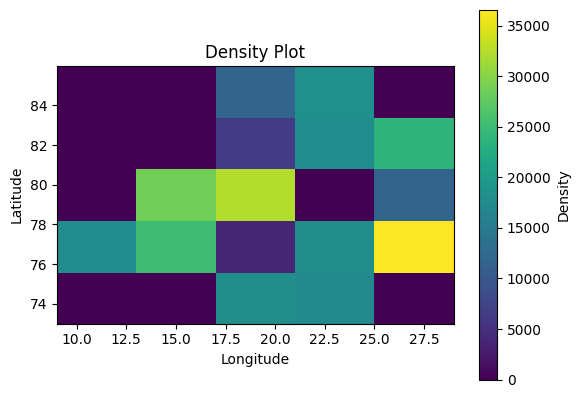

In [8]:
# import dependencies
import numpy as np
import matplotlib.pyplot as plt

# Extract longitude and latitude columns
longitude = df['LONGITUDE']
latitude = df['LATITUDE']

# Set the number of bins for the histogram
bins = 5

# Create 2D histogram using numpy
H, xedges, yedges = np.histogram2d(longitude, latitude, bins=bins)

# Set the extent of the plot
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

# Plot the density using matplotlib
plt.imshow(H.T, extent=extent, origin='lower', cmap='viridis')
plt.colorbar(label='Density')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Density Plot')
plt.show()

### Density plot for first 1000 records using seaborn

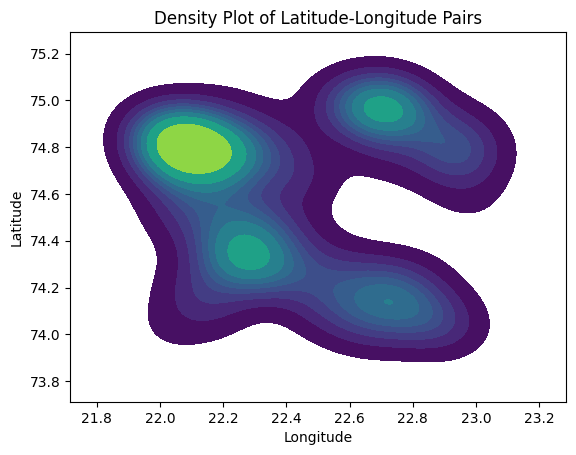

In [9]:
# import dependencies
import seaborn as sns

# Create a scatter plot with density estimation
sns.kdeplot(data=coordinates[:1000], x='LONGITUDE', y='LATITUDE', fill=True, cmap='viridis')

# Set plot title and axis labels
plt.title('Density Plot of Latitude-Longitude Pairs')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Display the plot
plt.show()

# Are there any IPs which are correlated to an entity’s location? 

In [10]:
# import dependencies
import dask.dataframe as dd

# Convert the pandas DataFrame to a dask DataFrame for parallel computing due to larger dataset
ddf = dd.from_pandas(df, npartitions=10) 

# Function to check IP correlations and extract unique locations
def check_ip_correlations(partition):
    return partition.groupby("IP").apply(lambda x: x[["LATITUDE", "LONGITUDE"]].drop_duplicates()).reset_index(drop=True)

# Use dask's parallel computing with apply
meta = pd.DataFrame(columns=["LATITUDE", "LONGITUDE"], dtype=float)
results = ddf.groupby("IP").apply(check_ip_correlations, meta=meta).compute()

# Filter out partitions with only one unique location
correlated_ips = results[results.groupby("IP")["LATITUDE"].transform("nunique") > 1]

# Print the correlated IP addresses and their associated locations
if not correlated_ips.empty:
    print("IP addresses correlated to multiple locations:")
    for ip, group in correlated_ips.groupby("IP"):
        print(group[["LATITUDE", "LONGITUDE"]])
        print()
else:
    print("No IP addresses correlated to multiple locations.")

IP addresses correlated to multiple locations:
             LATITUDE  LONGITUDE
IP                              
1.0.0.1 0   77.364770  23.385480
        1   77.186160  23.451470
        2   77.213056  14.815528
        3   77.153810  14.516780
        4   77.881450  14.117370
        5   82.924300  21.803710
        6   81.338230  25.544260
        7   81.151680  25.748270
        8   83.814908  20.109892
        9   76.186160  28.451470
        10  85.263760  23.488320
        11  74.809240  22.125020
        12  83.166971  20.591678
        13  79.064970  17.796070
        14  76.845380  26.068170
        15  76.845380  28.068170
        16  77.312640   9.373420
        17  77.263760   9.488320
        18  78.166971  16.591678
        19  78.839362  16.707790
        20  73.797320  17.062630
        21  80.819990  28.278890

             LATITUDE  LONGITUDE
IP                              
1.1.1.1 0   77.180350   14.52720
        1   77.314930   14.38529
        2   78.822830   19.6

                   LATITUDE  LONGITUDE
IP                                    
103.229.10.171 0  78.639510   19.42617
               1  78.811810   19.31030
               2  82.086430   21.74023
               3  78.804850   13.09992
               4  78.469870   16.08148
               5  78.843670   16.07076
               6  73.377583   17.27902
               7  80.871120   28.68398

                  LATITUDE  LONGITUDE
IP                                   
103.229.10.180 0  74.69643   22.07515
               1  74.10701   22.63296
               2  76.76282   26.31247
               3  76.12974   28.91180
               4  77.29657    9.24791
               5  78.29657   13.24791
               6  78.81948   16.04255

                  LATITUDE  LONGITUDE
IP                                   
103.229.10.192 0  78.29657   13.24791
               1  78.46711   16.07356
               2  73.23393   17.82119

                   LATITUDE  LONGITUDE
IP                                  

                   LATITUDE  LONGITUDE
IP                                    
104.18.63.124 0   78.113333  19.930833
              1   77.848830  23.056940
              2   77.066840  14.822800
              3   77.539140  14.385890
              4   77.915193  14.393868
              5   78.240640  19.158410
              6   82.652970  21.257870
              7   81.096950  25.128670
              8   76.825820  28.730640
              9   85.941410  23.646300
              10  85.006220  23.774806
              11  85.845790  23.745170
              12  85.362867  23.195050
              13  85.803516  23.096907
              14  85.265790  23.728730
              15  74.848690  22.072690
              16  82.955840  21.097580
              17  83.805500  20.142333
              18  83.797530  20.067970
              19  83.069040  20.688110
              20  83.008450  20.812390
              21  83.085070  20.654180
              22  76.984410  28.590420
              23  76.2774

                LATITUDE  LONGITUDE
IP                                 
104.21.91.11 0    81.931   25.59755
             1    83.931   20.59755

               LATITUDE  LONGITUDE
IP                                
104.21.91.7 0  85.44457   23.64897
            1  78.44457   13.64897

                  LATITUDE  LONGITUDE
IP                                   
104.21.92.250 0  78.788060  19.820320
              1  73.886551  17.746759

                  LATITUDE  LONGITUDE
IP                                   
104.21.93.109 0  85.804167  23.081667
              1  77.980000   9.719300

                  LATITUDE  LONGITUDE
IP                                   
104.21.93.237 0  81.568290  25.145980
              1  81.554180  25.842640
              2  76.809167  26.156944

                     LATITUDE  LONGITUDE
IP                                      
104.211.138.100 0   77.661850   23.41251
                1   83.818880   20.05645
                2   83.809170   20.16887
            

               LATITUDE  LONGITUDE
IP                                
104.90.6.80 0  78.81008   16.06336
            1  80.83825   28.08525

               LATITUDE  LONGITUDE
IP                                
104.90.6.97 0  81.31877   25.99074
            1  85.52127   23.14461

                   LATITUDE  LONGITUDE
IP                                    
104.91.64.121 0   78.884610  19.402440
              1   77.722815  23.017062
              2   77.789390  14.084870
              3   78.807090  19.188030
              4   81.883560  25.120830
              5   83.459990  20.321820
              6   82.001810  21.018080
              7   83.208520  20.630770
              8   79.776746  17.318880
              9   78.810890  13.969230
              10  78.839190  16.154160
              11  78.657450  16.086900
              12  73.245420  17.695760
              13  73.025950  17.676050
              14  80.639180  28.154690

                  LATITUDE  LONGITUDE
IP              

                    LATITUDE  LONGITUDE
IP                                     
108.158.245.35 0   77.816350  14.090140
               1   77.236880  14.409500
               2   77.972370  14.072600
               3   77.282130  14.888030
               4   77.963110  14.558160
               5   81.308367  25.410150
               6   85.805833  23.106944
               7   85.800430  23.052670
               8   85.647470  23.104110
               9   85.794690  23.021650
               10  77.790440   9.016370
               11  76.015510  28.921270
               12  77.121640   9.615570
               13  78.071611  13.920694
               14  78.263390  13.530580

                    LATITUDE  LONGITUDE
IP                                     
108.158.245.38 0   79.845070  17.734480
               1   78.286020  19.174600
               2   81.988160  25.223220
               3   81.293120  25.200200
               4   81.770190  25.719430
               5   76.119240  28.562150

                  LATITUDE  LONGITUDE
IP                                   
116.119.76.78 0  77.800580  14.134083
              1  77.747143  14.051275
              2  76.779270  28.078050
              3  77.832050   9.768720
              4  78.832050  13.768720
              5  80.101520  28.486600
              6  80.467110  28.073560
              7  80.791980  28.367540

                  LATITUDE  LONGITUDE
IP                                   
116.119.76.79 0  81.804167  25.081667
              1  77.265660   9.473040
              2  74.839190  22.154160
              3  82.150140  21.962730
              4  83.079370  20.688540
              5  78.888300  16.033720
              6  73.815420  17.820920

                 LATITUDE  LONGITUDE
IP                                  
116.119.76.80 0  77.13908   14.72254
              1  81.46711   25.07356
              2  81.55661   25.93324
              3  74.02576   22.69052
              4  80.80605   28.05396

                

                     LATITUDE  LONGITUDE
IP                                      
118.215.155.105 0   78.796170  19.940620
                1   78.125020  19.531030
                2   77.324920  23.212020
                3   77.852580  23.736670
                4   79.447780  17.453150
                5   77.261250  14.694550
                6   78.644278  19.113277
                7   78.108880  19.935130
                8   78.126820  19.657860
                9   78.843320  19.365770
                10  81.182660  25.566260
                11  81.061110  25.716660
                12  81.046160  25.666050
                13  83.785310  20.923100
                14  83.142970  20.500806
                15  83.513000  20.992670
                16  83.191190  20.438890
                17  76.435810  28.171528
                18  76.691970  28.966460
                19  76.851070  28.735370
                20  85.769260  23.308670
                21  85.245970  23.548139
                

                    LATITUDE  LONGITUDE
IP                                     
129.227.190.39 0   78.091520  19.725670
               1   77.832050  23.140610
               2   77.708530  23.832180
               3   77.794690  23.021650
               4   77.721460  23.410010
               5   77.830485  14.086030
               6   82.362867  21.195050
               7   82.067450  21.873700
               8   85.715420  23.789060
               9   85.434330  23.114360
               10  77.821550   9.940170
               11  74.039830  22.901917
               12  74.304070  22.173270
               13  74.052040  22.686990
               14  74.805270  22.037210
               15  74.561190  22.161190
               16  74.227528  22.538111
               17  82.788703  21.110912
               18  82.077200  21.647990
               19  82.476010  21.124790
               20  82.350890  21.476170
               21  82.366720  21.224080
               22  79.794167  17.107778


                   LATITUDE  LONGITUDE
IP                                    
129.227.254.121 0  77.80485   23.09992
                1  82.59966   21.36269
                2  76.99131   28.70030
                3  73.40827   17.36794

                   LATITUDE  LONGITUDE
IP                                    
129.227.254.122 0  77.82484   23.11670
                1  74.16155   22.71410
                2  83.79969   20.07954
                3  77.85152    9.95995
                4  78.58759   16.40812

                  LATITUDE  LONGITUDE
IP                                   
129.227.254.13 0  77.85220  14.823900
               1  77.54530  14.382500
               2  83.40648  20.448620
               3  76.07878  28.582000
               4  82.01082  21.030740
               5  83.02454  20.940676
               6  77.73404   9.024660
               7  78.37281  16.541130
               8  73.53737  17.116020
               9  73.64792  17.443740

                    LATITUDE  LONG

                  LATITUDE  LONGITUDE
IP                                   
129.227.254.80 0  77.04724   23.86350
               1  77.86691   14.08621
               2  78.82842   16.17722
               3  73.10883   17.14753

                  LATITUDE  LONGITUDE
IP                                   
129.227.254.81 0  85.08933   23.90909
               1  79.79122   17.06739
               2  80.81708   28.67583

                   LATITUDE  LONGITUDE
IP                                    
129.227.254.82 0  77.867430  23.990040
               1  76.835170  28.345680
               2  74.793830  22.002530
               3  74.424570  22.546730
               4  74.572620  22.230080
               5  82.019630  21.646160
               6  83.937870  20.862010
               7  76.566277  26.136596
               8  78.420120  16.619880
               9  73.247810  17.534380

                   LATITUDE  LONGITUDE
IP                                    
129.227.254.83 0  74.758818  22.1

                  LATITUDE  LONGITUDE
IP                                   
13.127.100.221 0  82.51300   21.99267
               1  74.40184   22.32990

                  LATITUDE  LONGITUDE
IP                                   
13.127.103.144 0  77.92882   23.87918
               1  80.80618   28.06748

                LATITUDE  LONGITUDE
IP                                 
13.127.12.23 0  81.49374   25.32531
             1  79.52364   17.36908

                   LATITUDE  LONGITUDE
IP                                    
13.127.120.129 0  76.709222  28.092528
               1  85.709222  23.092528
               2  77.248790   9.347040
               3  83.633570  20.570790
               4  78.117648  13.934913

                   LATITUDE  LONGITUDE
IP                                    
13.127.122.28 0   79.568290  17.145980
              1   82.799690  21.079540
              2   81.132310  25.923310
              3   83.809950  20.073664
              4   85.800580  23.134083
  

                    LATITUDE  LONGITUDE
IP                                     
13.232.125.228 0   78.167150  19.720470
               1   78.932360  19.781900
               2   78.624950  19.279650
               3   78.765460  19.083752
               4   78.923300  19.610640
               5   78.116030  19.903020
               6   78.835810  19.005150
               7   77.135860  23.494180
               8   77.461760  23.349260
               9   77.116030  23.903020
               10  77.198020  23.288990
               11  77.729760  23.104320
               12  77.816020  23.196880
               13  77.012950  23.659110
               14  77.793850  23.239430
               15  77.829278  23.131083
               16  77.385910  23.162540
               17  77.370650  23.144800
               18  77.391812  23.518170
               19  77.958610  23.901350
               20  78.807350  19.003020
               21  78.979170  19.893800
               22  78.401470  19.343520


                    LATITUDE  LONGITUDE
IP                                     
13.234.139.201 0   77.996050  23.709530
               1   77.902250  14.269578
               2   82.786250  21.101010
               3   83.011540  20.646220
               4   76.510990  28.172610
...                      ...        ...
               62  79.433467  17.498833
               63  79.603060  17.028120
               64  76.315730  28.407230
               65  76.102210  28.661270
               66  77.433467   9.498833

[67 rows x 2 columns]

                  LATITUDE  LONGITUDE
IP                                   
13.234.144.103 0  78.15078   19.72366
               1  78.81489   13.11195

                   LATITUDE  LONGITUDE
IP                                    
13.234.146.68 0   78.661850  19.412510
              1   78.249990  19.414190
              2   78.020270  19.754350
              3   78.647470  19.104110
              4   78.319530  19.015070
              5   78.268760  1

                  LATITUDE  LONGITUDE
IP                                   
13.235.203.221 0  82.84883   21.05694
               1  78.87431   13.28059

                   LATITUDE  LONGITUDE
IP                                    
13.235.204.108 0  77.500520  14.083440
               1  78.500520  19.083440
               2  80.835016  28.714725

                   LATITUDE  LONGITUDE
IP                                    
13.235.204.205 0  81.332900  25.168400
               1  81.172708  25.269374
               2  81.093000  25.478197
               3  74.164330  22.969720
               4  77.860860   9.169680
               5  78.833720  13.186667

                 LATITUDE  LONGITUDE
IP                                  
13.235.207.17 0  85.18836   23.55994
              1  74.81008   22.06336

                  LATITUDE  LONGITUDE
IP                                   
13.235.207.215 0  77.38305   14.51089
               1  82.93870   21.96280

                   LATITUDE  LONGITU

                LATITUDE  LONGITUDE
IP                                 
138.199.36.7 0  76.75890   28.20187
             1  73.75591   17.04459

                LATITUDE  LONGITUDE
IP                                 
138.199.36.8 0  85.81714   23.03394
             1  78.83220   16.63482

                LATITUDE  LONGITUDE
IP                                 
138.199.36.9 0  85.52440  23.390740
             1  73.03531  17.798528

                  LATITUDE  LONGITUDE
IP                                   
138.199.37.230 0  78.79383   19.00253
               1  82.11613   21.15031
               2  79.83072   17.08751
               3  76.75890   28.20187
               4  73.75591   17.04459

                   LATITUDE  LONGITUDE
IP                                    
138.199.37.232 0  85.524400  23.390740
               1  74.954418  22.406547
               2  73.035310  17.798528

                 LATITUDE  LONGITUDE
IP                                  
138.199.42.68 0  82.90157   

                    LATITUDE  LONGITUDE
IP                                     
142.250.182.74 0   77.625170  14.345130
               1   77.298090  14.539620
               2   77.308586  14.372691
               3   78.325950  19.511360
               4   81.774682  25.959765
               5   81.876185  25.705627
               6   85.578090  23.969180
               7   85.446820  23.062360
               8   77.778487   9.007158
               9   77.446820   9.062360
               10  79.308586  17.372691
               11  76.897480  26.098480
               12  76.897480  28.098480
               13  78.161120  13.743660
               14  73.849490  17.692610
               15  80.849490  28.692610

                  LATITUDE  LONGITUDE
IP                                   
142.250.183.10 0  78.60995   19.43222
               1  83.93087   20.95113
               2  76.89855   28.26655
               3  76.91273   26.18185
               4  76.02678   26.09240
             

                     LATITUDE  LONGITUDE
IP                                      
142.250.193.226 0   78.301355  19.961928
                1   78.528470  19.123730
                2   77.689160  23.025220
                3   77.582350  23.921680
                4   78.401840  19.329900
                5   74.760680  22.207280
                6   74.122300  22.723190
                7   83.380760  20.606480
                8   78.357040  13.274140
                9   78.521270  16.144610
                10  78.963230  16.668700

                      LATITUDE  LONGITUDE
IP                                       
142.250.193.227 0    78.734210  19.084500
                1    78.246530  19.568810
                2    77.793830  23.002530
                3    77.799556  23.045833
                4    77.116130  23.150310
...                        ...        ...
                157  80.362867  28.195050
                158  80.672510  28.284050
                159  80.777390  28.216100
    

                      LATITUDE  LONGITUDE
IP                                       
142.250.194.234 0    78.897220  19.873500
                1    78.434330  19.114360
                2    78.533790  19.188790
                3    78.689630  19.859390
                4    78.614490  19.267780
...                        ...        ...
                494  80.023224  28.918085
                495  80.890070  28.782400
                496  80.098330  28.558610
                497  80.113333  28.930833
                498  80.194912  28.510752

[499 rows x 2 columns]

                   LATITUDE  LONGITUDE
IP                                    
142.250.194.237 0  77.05699   23.07587
                1  81.00181   25.01808
                2  83.81304   20.99808
                3  82.65232   21.30378
                4  73.92330   17.61064

                       LATITUDE  LONGITUDE
IP                                        
142.250.194.238 0     78.351850  19.168350
                1     78.3

                     LATITUDE  LONGITUDE
IP                                      
142.250.206.174 0   78.816420  19.149510
                1   78.019630  19.646160
                2   78.367710  19.206600
                3   77.248397  23.455148
                4   77.778590  23.066240
                5   77.425230  23.466820
                6   77.808000  23.078361
                7   77.616551  14.094040
                8   77.843610  14.645950
                9   77.161800  14.460860
                10  77.285970  14.355360
                11  78.844450  19.372890
                12  83.876000  20.994630
                13  76.029690  28.737780
                14  85.029690  23.737780
                15  74.434330  22.114360
                16  74.073740  22.580972
                17  82.809472  21.088778
                18  82.096950  21.128670
                19  79.217720  17.426680
                20  79.089236  17.769704
                21  79.966290  17.565180
                

                  LATITUDE  LONGITUDE
IP                                   
142.93.218.145 0  82.90157   21.86884
               1  83.90157   20.86884

                   LATITUDE  LONGITUDE
IP                                    
143.198.114.225 0  81.21042   25.76003
                1  74.49458   22.33809
                2  82.85370   21.04945

                   LATITUDE  LONGITUDE
IP                                    
143.204.176.84 0  77.690510  23.158530
               1  77.812950  23.984730
               2  77.932947  14.985465

                   LATITUDE  LONGITUDE
IP                                    
143.244.142.251 0  77.90316   14.26227
                1  79.90316   17.26227

                    LATITUDE  LONGITUDE
IP                                     
143.244.208.184 0  81.248397  25.455148
                1  79.851320  17.724400

                  LATITUDE  LONGITUDE
IP                                   
143.244.33.138 0  74.11681   22.55361
               1  80.10

                     LATITUDE  LONGITUDE
IP                                      
149.154.167.151 0   79.429220  17.503180
                1   79.207520  17.557020
                2   77.846960  14.757260
                3   82.256550  21.526430
                4   82.774408  21.305412
                5   81.040130  25.753330
                6   81.152700  25.822600
                7   85.738873  23.029961
                8   74.565028  22.247220
                9   83.339330  20.409270
                10  79.365050  17.208460
                11  76.834278  26.069028
                12  77.069520   9.729000
                13  77.830485   9.086030
                14  77.244670   9.551230
                15  78.286616  16.503750
                16  73.780460  17.885940
                17  80.832430  28.128920
                18  80.318930  28.133400

                   LATITUDE  LONGITUDE
IP                                    
149.154.167.222 0  73.84949   17.69261
                1  80

                   LATITUDE  LONGITUDE
IP                                    
15.206.97.124 0   77.024450  23.645320
              1   77.391812  23.518170
              2   77.813770  14.145550
              3   77.135900  14.920340
              4   78.758170  19.725510
              5   82.236270  21.450350
              6   85.098570  23.674570
              7   74.093000  22.478197
              8   74.741750  22.110080
              9   74.896820  22.861030
              10  74.694838  22.229487
              11  74.804500  22.070540
              12  74.639444  22.165277
              13  74.850700  22.019570
              14  74.747200  22.109160
              15  74.901050  22.973360
              16  82.919508  21.005093
              17  82.979280  21.567650
              18  82.798611  21.009306
              19  82.800040  21.887590
              20  82.216360  21.740820
              21  82.207520  21.557020
              22  78.793830  13.002530
              23  78.3761

                   LATITUDE  LONGITUDE
IP                                    
150.109.27.125 0   78.27208  19.921980
               1   81.84694  25.667510
               2   81.03921  25.644080
               3   81.24957  25.747470
               4   81.79362  25.072860
               5   81.81168  25.978130
               6   85.31248  23.805070
               7   79.79807  17.015360
               8   76.60995  26.432220
               9   76.92057  26.698100
               10  73.14295  17.335300
               11  73.02454  17.940676

                   LATITUDE  LONGITUDE
IP                                    
150.109.29.250 0  85.075140  23.483750
               1  76.814908  26.109892

                  LATITUDE  LONGITUDE
IP                                   
150.109.81.175 0  77.21786   23.53696
               1  78.64872   13.40250

                 LATITUDE  LONGITUDE
IP                                  
150.109.83.35 0  77.36771   23.20660
              1  77.79044    9.0

                    LATITUDE  LONGITUDE
IP                                     
157.240.229.61 0   77.851230  23.293920
               1   77.944680  23.553870
               2   77.814890  23.111950
               3   77.877998  23.627105
               4   77.264160  14.356410
               5   77.780640  14.759850
               6   78.465070  19.280150
               7   78.108830  19.147530
               8   81.525510  25.578860
               9   76.115278  28.926667
               10  85.594480  23.074130
               11  85.107010  23.632960
               12  85.272240  23.541850
               13  85.238870  23.710160
               14  74.069520  22.729000
               15  74.830800  22.856370
               16  82.095820  21.643440
               17  83.498620  20.059230
               18  76.377583  26.279020
               19  76.190694  28.379119
               20  77.238870   9.710160
               21  77.410130   9.321030
               22  77.786990   9.072780


                  LATITUDE  LONGITUDE
IP                                   
159.138.99.194 0  76.92677   28.84313
               1  85.92677   23.84313
               2  76.92677   26.84313

                   LATITUDE  LONGITUDE
IP                                    
159.203.145.121 0  82.72115   21.54274
                1  74.49458   22.33809
                2  76.12974   28.91180

                   LATITUDE  LONGITUDE
IP                                    
159.223.211.188 0  77.39067   23.25381
                1  82.92770   21.94537
                2  82.84696   21.75726
                3  76.62662   26.56034
                4  76.03920   26.46693

                  LATITUDE  LONGITUDE
IP                                   
159.65.148.134 0  82.90157   21.86884
               1  81.90157   25.86884

                    LATITUDE  LONGITUDE
IP                                     
159.69.161.134 0   85.165660  23.514560
               1   74.817300  22.158900
               2   74.8391

                  LATITUDE  LONGITUDE
IP                                   
164.90.100.137 0  74.86481  22.866690
               1  83.92430  20.803710
               2  77.02454   9.940676

                   LATITUDE  LONGITUDE
IP                                    
164.90.101.101 0  77.805500  14.142333
               1  73.808830  17.031670
               2  80.965247  28.495657

                  LATITUDE  LONGITUDE
IP                                   
164.90.101.103 0  76.03225   28.08284
               1  85.11424   23.69957
               2  83.12164   20.61557

                  LATITUDE  LONGITUDE
IP                                   
164.90.101.106 0  77.05699   23.07587
               1  80.82201   28.02030

                  LATITUDE  LONGITUDE
IP                                   
164.90.101.108 0  81.97675   25.07762
               1  81.73416   25.09959

                   LATITUDE  LONGITUDE
IP                                    
164.90.101.111 0  79.865010  17.745190

                  LATITUDE  LONGITUDE
IP                                   
169.136.79.153 0  79.73682   17.96138
               1  77.73682   14.96138

                   LATITUDE  LONGITUDE
IP                                    
169.136.79.32 0   81.287960  25.488940
              1   76.016100  28.721380
              2   85.596500  23.423420
              3   85.016100  23.721380
              4   74.510990  22.172610
              5   74.013370  22.927560
              6   74.448889  22.244167
              7   83.638530  20.417980
              8   83.161550  20.714100
              9   79.161550  17.714100
              10  79.600110  17.085680
              11  76.052040  26.686990
              12  77.461760   9.349260
              13  78.649290  13.074900
              14  78.792560  16.683240
              15  73.252080  17.738430

                   LATITUDE  LONGITUDE
IP                                    
169.136.79.34 0    78.29642   19.49967
              1    78.16180

                   LATITUDE  LONGITUDE
IP                                    
17.253.60.253 0   78.802800  19.061390
              1   78.769840  19.076580
              2   79.839280  17.740450
              3   77.804250  14.090630
              4   78.761170  19.833270
              5   82.806667  21.097500
              6   82.918330  21.711040
              7   81.898660  25.720020
              8   81.585180  25.162570
              9   81.885470  25.660180
              10  83.352077  20.069345
              11  76.807400  28.116890
              12  76.765690  28.745970
              13  76.902140  28.687220
              14  85.591060  23.112390
              15  85.875690  23.093830
              16  85.590950  23.101190
              17  85.770100  23.006600
              18  85.005560  23.933430
              19  85.852200  23.823900
              20  85.797278  23.096528
              21  85.817470  23.137410
              22  85.817360  23.123444
              23  85.1223

                      LATITUDE  LONGITUDE
IP                                       
172.217.166.234 0    78.248790  19.347040
                1    78.215690  19.652510
                2    78.913320  19.016170
                3    78.647470  19.104110
                4    78.819480  19.042550
...                        ...        ...
                655  80.017820  28.056570
                656  80.734730  28.828850
                657  80.083970  28.903480
                658  80.014853  28.938698
                659  80.012950  28.659110

[660 rows x 2 columns]

                   LATITUDE  LONGITUDE
IP                                    
172.217.166.237 0  85.84579   23.74517
                1  76.36035   28.33987

                     LATITUDE  LONGITUDE
IP                                      
172.217.166.238 0   78.874310  19.280590
                1   77.056990  23.075870
                2   82.805833  21.106944
                3   81.862470  25.744970
                4   83.813

                   LATITUDE  LONGITUDE
IP                                    
172.217.27.170 0   78.80646  19.044660
               1   78.53114  19.984500
               2   79.62517  17.345130
               3   77.53942  14.412350
               4   77.31953  14.015070
               5   77.83747  14.664021
               6   77.88123  14.133697
               7   77.09623  14.968830
               8   77.81747  14.137410
               9   81.26124  25.328810
               10  81.92971  25.506590
               11  81.72928  25.985280
               12  76.24781  28.534380
               13  76.72971  28.608140
               14  76.41508  28.642050
               15  85.81961  23.074180
               16  85.41508  23.642050
               17  85.72971  23.608140
               18  85.25890  23.612300
               19  85.28720  23.093530
               20  85.77739  23.216100
               21  85.05113  23.786730
               22  85.28389  23.454240
               23  85.869

                 LATITUDE  LONGITUDE
IP                                  
172.67.37.227 0  78.29214   19.74249
              1  81.99680   25.64056
              2  76.76117   28.83327
              3  74.01170   22.77767
              4  73.20852   17.63077

                  LATITUDE  LONGITUDE
IP                                   
172.67.38.106 0  77.861370  14.747760
              1  78.401840  19.329900
              2  85.807644  23.056973
              3  74.078780  22.582000
              4  82.401553  21.058301
              5  83.329690  20.562950
              6  79.821350  17.138450
              7  78.766110  16.109530
              8  78.835210  16.067480

                LATITUDE  LONGITUDE
IP                                 
172.67.41.37 0  76.26427   28.60617
             1  74.89588   22.66283

                LATITUDE  LONGITUDE
IP                                 
172.67.68.83 0  73.82333   17.77115
             1  80.82333   28.77115

                LATITUDE  LONGI

                  LATITUDE  LONGITUDE
IP                                   
18.164.188.35 0  81.263760  25.488320
              1  74.304070  22.173270
              2  78.798611  13.009306

                 LATITUDE  LONGITUDE
IP                                  
18.164.188.4 0  77.220120  14.571970
             1  77.803516  14.096907
             2  78.245970  19.548139
             3  81.570360  25.778100
             4  83.570360  20.778100
             5  82.575660  21.446030
             6  76.814040  26.041860
             7  76.843670  26.070760
             8  78.206020  13.419770
             9  78.896030  13.025120

                 LATITUDE  LONGITUDE
IP                                  
18.164.188.43 0  77.91520  23.940399
              1  82.32567  21.276070

                  LATITUDE  LONGITUDE
IP                                   
18.164.188.44 0  77.839960  23.071600
              1  85.136210  23.746830
              2  74.091172  22.893495
              3  73.23887

                 LATITUDE  LONGITUDE
IP                                  
18.164.217.43 0  78.08507   19.65418
              1  83.39166   20.22878

                   LATITUDE  LONGITUDE
IP                                    
18.164.217.45 0   77.797880  23.735340
              1   77.098560  23.784160
              2   77.306083  23.374806
              3   77.198810  14.408570
              4   76.943360  28.008700
              5   85.851070  23.735370
              6   85.835170  23.345680
              7   85.357950  23.214680
              8   85.441440  23.128650
              9   74.995460  22.996470
              10  83.967190  20.996610
              11  79.649290  17.074900
              12  79.931620  17.632270
              13  79.812610  17.038310
              14  79.841100  17.750400
              15  77.327790   9.543150
              16  77.771740   9.215410
              17  78.889250  13.104110
              18  73.694770  17.416180
              19  73.941330  17.

                  LATITUDE  LONGITUDE
IP                                   
18.208.31.48 0   78.328530  19.151600
             1   78.135860  19.494180
             2   78.995460  19.996470
             3   78.920000  19.958857
             4   77.980000  23.719300
             5   77.099380  23.508990
             6   77.080590  23.758940
             7   77.852430  23.938830
             8   77.011170  23.877130
             9   78.852430  19.938830
             10  78.857302  19.717900
             11  78.298090  19.539620
             12  78.432422  19.356885
             13  78.127300  19.387040
             14  82.942553  21.920167
             15  76.847940  28.354140
             16  76.119240  28.562150
             17  85.353230  23.549220
             18  85.809300  23.085160
             19  74.283901  22.444258
             20  74.317050  22.032880
             21  74.812480  22.013130
             22  74.785780  22.082850
             23  83.694770  20.416180
            

                 LATITUDE  LONGITUDE
IP                                  
18.66.63.73 0   85.115740  23.466460
            1   85.679430  23.089510
            2   85.928820  23.879180
            3   77.928820   9.879180
            4   76.140140  26.903660
            5   78.285930  16.851150
            6   78.777790  16.841260
            7   78.305500  16.441670
            8   73.013833  17.728333
            9   73.972140  17.618700
            10  73.775740  17.227630
            11  80.896970  28.168220
            12  80.180350  28.527200

                LATITUDE  LONGITUDE
IP                                 
18.66.63.75 0  78.263550  19.432800
            1  77.638526  23.397966
            2  77.265660  23.473040
            3  77.806143  23.195504
            4  77.620290  23.884510
            5  77.280950  14.516840
            6  78.923230  19.296310
            7  85.811950  23.093520

                LATITUDE  LONGITUDE
IP                                 
18.66.63.76

                   LATITUDE  LONGITUDE
IP                                    
182.79.144.147 0  77.816420  23.149510
               1  77.791980  23.367540
               2  78.377583  16.279020
               3  78.816655  16.649443

                   LATITUDE  LONGITUDE
IP                                    
182.79.144.204 0  77.825530  23.090720
               1  79.584390  17.158380
               2  78.469780  19.278450
               3  81.020940  25.848090
               4  79.740190  17.033669
               5  78.778693  16.175812

                   LATITUDE  LONGITUDE
IP                                    
182.79.144.207 0  77.827810  23.100220
               1  76.390521  28.414239
               2  82.810730  21.961270
               3  76.880030  26.691510
               4  78.122040  16.738270

                  LATITUDE  LONGITUDE
IP                                   
182.79.144.208 0  77.81245   23.11964
               1  78.83080   19.85637
               2  83.46176

                  LATITUDE  LONGITUDE
IP                                   
185.219.100.54 0  82.17782   21.34634
               1  85.60952   23.42240

                  LATITUDE  LONGITUDE
IP                                   
185.221.69.146 0  83.83996    20.0716
               1  79.83996    17.0716

                   LATITUDE  LONGITUDE
IP                                    
185.221.85.12 0   79.641300  17.935270
              1   77.589030  14.101910
              2   81.747143  25.051275
              3   81.281710  25.214110
              4   81.766110  25.109530
              5   85.828670  23.275050
              6   83.761170  20.833270
              7   79.861370  17.747760
              8   76.729420  26.604100
              9   76.817360  26.123444
              10  78.194923  13.740222
              11  78.800430  13.052670
              12  73.248397  17.455148
              13  73.844450  17.372890
              14  73.907290  17.646590

                 LATITUDE  LON

                   LATITUDE  LONGITUDE
IP                                    
199.232.21.16 0   78.824680  19.086880
              1   77.954418  23.406547
              2   77.818880  23.056450
              3   79.734210  17.084500
              4   77.734210  14.084500
              5   78.734210  19.084500
              6   81.733330  25.610620
              7   83.570340  20.279540
              8   85.348880  23.239460
              9   85.835900  23.773150
              10  74.829140  22.025470
              11  74.122730  22.566440
              12  83.793790  20.092490
              13  83.874280  20.685260
              14  83.812610  20.038310
              15  79.874280  17.685260
              16  76.828160  26.751470
              17  76.624950  28.279650
              18  76.765460  28.083752
              19  76.348880  28.239460
              20  78.828420  13.177220
              21  78.810890  13.969230
              22  78.631610  13.423290
              23  78.9507

                  LATITUDE  LONGITUDE
IP                                   
202.81.109.67 0  76.424570  26.546730
              1  77.248397   9.455148
              2  73.733130  17.098900

                  LATITUDE  LONGITUDE
IP                                   
202.81.109.68 0  78.722815  19.017062
              1  78.885640  16.604130

                 LATITUDE  LONGITUDE
IP                                  
202.81.109.69 0  81.34725   25.52396
              1  76.57975   26.93162

                LATITUDE  LONGITUDE
IP                                 
202.81.109.7 0  81.60011   25.08568
             1  74.85152   22.95995
             2  82.80458   21.08615
             3  79.60806   17.91098

                  LATITUDE  LONGITUDE
IP                                   
202.81.109.71 0  76.862490   28.73824
              1  85.454946   23.18284
              2  83.729760   20.10432
              3  83.967190   20.99661
              4  79.765870   17.01872

                  LATIT

                  LATITUDE  LONGITUDE
IP                                   
209.97.163.171 0  78.84445   19.37289
               1  76.42107   26.33001

                     LATITUDE  LONGITUDE
IP                                      
210.154.124.221 0   79.401890  17.536000
                1   83.796230  20.084550
                2   85.091172  23.893495
                3   77.374590   9.316620
                4   82.575420  21.075490
                5   79.796230  17.084550
                6   79.884610  17.402440
                7   77.790440   9.016370
                8   78.368450  13.605550
                9   78.839450  16.394280
                10  73.263390  17.530580

                   LATITUDE  LONGITUDE
IP                                    
211.249.243.112 0  81.76962   25.92887
                1  83.76962   20.92887

                  LATITUDE  LONGITUDE
IP                                   
212.129.33.59 0  79.134670  17.520910
              1  81.574250  25.007800
    

                    LATITUDE  LONGITUDE
IP                                     
216.58.200.170 0    78.52976   19.99776
               1    78.75591   19.04459
               2    78.55355   19.16163
               3    78.79383   19.00253
               4    78.03340   19.88256
...                      ...        ...
               571  80.27039   28.83437
               572  80.01782   28.05657
               573  80.10207   28.79065
               574  80.09833   28.55861
               575  80.14654   28.99756

[576 rows x 2 columns]

                   LATITUDE  LONGITUDE
IP                                    
216.58.200.174 0  77.804250   9.090630
               1  78.833700  13.390117
               2  78.354050  13.206970
               3  78.321260  13.174400
               4  73.746442  17.066829
               5  73.104160  17.049720

                    LATITUDE  LONGITUDE
IP                                     
216.58.200.194 0   77.765880  23.079560
               1   79.

                 LATITUDE  LONGITUDE
IP                                  
23.11.235.41 0  78.066710  19.782140
             1  82.151018  21.732272
             2  85.859100  23.067900
             3  79.114590  17.928620
             4  76.842680  28.086010
             5  78.494580  16.338090
             6  73.210210  17.517010
             7  73.143270  17.602720

                  LATITUDE  LONGITUDE
IP                                   
23.11.235.42 0   77.169780  23.859194
             1   77.794288  14.983686
             2   78.800500  19.083840
             3   81.099710  25.470670
             4   83.785310  20.923100
             5   85.280200  23.431800
             6   85.556518  23.377193
             7   85.451110  23.070580
             8   85.966655  23.837536
             9   82.575660  21.446030
             10  83.859170  20.692320
             11  83.052770  20.265710
             12  83.763950  20.321190
             13  83.276720  20.773720
             14  79.9

                LATITUDE  LONGITUDE
IP                                 
23.11.235.97 0  77.25042  14.175556
             1  76.32969  28.562950

                  LATITUDE  LONGITUDE
IP                                   
23.11.235.98 0   78.810890  19.969230
             1   78.162690  19.609540
             2   78.575660  19.446030
             3   77.673870  23.217460
             4   82.403880  21.055020
             5   82.334320  21.499700
             6   81.570360  25.778100
             7   83.385910  20.162540
             8   74.915180  22.817100
             9   82.091172  21.893495
             10  79.114590  17.928620
             11  76.814040  26.041860
             12  76.674880  26.257720
             13  76.787000  26.116930
             14  76.744874  28.114343
             15  78.748540  16.923010
             16  73.238870  17.710160
             17  80.238870  28.710160
             18  80.278770  28.498380

                  LATITUDE  LONGITUDE
IP                

                 LATITUDE  LONGITUDE
IP                                  
23.58.93.131 0  78.274740  19.368210
             1  77.916180  14.706880
             2  81.584390  25.158380
             3  76.218056  28.684444
             4  76.525980  28.414560
             5  85.898219  23.615977
             6  73.085070  17.654180
             7  73.026780  17.658420
             8  80.026780  28.658420
             9  80.085070  28.654180

                 LATITUDE  LONGITUDE
IP                                  
23.58.93.136 0  83.744874  20.114343
             1  76.737778  28.392056
             2  85.068820  23.908700
             3  85.837460  23.753510
             4  85.935010  23.540630
             5  85.248890  23.728600

                LATITUDE  LONGITUDE
IP                                 
23.58.93.137 0  85.80927   23.59676
             1  76.11440   26.50026
             2  73.90979   17.70477
             3  73.87473   17.72291
             4  80.90979   28.70477

     

               LATITUDE  LONGITUDE
IP                                
3.108.34.53 0  77.82468  23.086880
            1  74.90923  22.980530
            2  82.11603  21.903020
            3  83.11603  20.903020
            4  73.83685  17.083582

                  LATITUDE  LONGITUDE
IP                                   
3.108.35.226 0   78.252480  19.807300
             1   78.011540  19.646220
             2   77.976750  23.077620
             3   77.218705  23.812603
             4   77.212200  14.513680
             5   85.909230  23.980530
             6   83.412950  20.101933
             7   76.584390  26.158380
             8   76.316920  28.578210
             9   77.348640   9.210280
             10  77.325670   9.276070
             11  78.923230  13.296310
             12  78.886310  13.586750
             13  78.051130  13.786730
             14  78.961100  16.676550

                LATITUDE  LONGITUDE
IP                                 
3.108.57.14 0  78.187800  19.678200

                LATITUDE  LONGITUDE
IP                                 
3.111.76.71 0  76.360350  26.339870
            1  78.921640  16.017010
            2  78.719157  16.903172
            3  78.816420  16.149510
            4  73.138590  17.693890

                LATITUDE  LONGITUDE
IP                                 
3.111.76.82 0  77.500520  14.083440
            1  82.711720  21.957430
            2  82.886790  21.935400
            3  81.738873  25.029961
            4  81.711720  25.957430
            5  83.185180  20.745740
            6  73.972140  17.618700
            7  80.972140  28.618700

                 LATITUDE  LONGITUDE
IP                                  
3.111.77.223 0  82.719157  21.903172
             1  77.397730   9.383190
             2  80.205100  28.417800

                LATITUDE  LONGITUDE
IP                                 
3.114.95.219 0  77.79198   23.36754
             1  79.82135   17.13845

               LATITUDE  LONGITUDE
IP                  

              LATITUDE  LONGITUDE
IP                               
3.6.69.3 0   77.083970  23.903480
         1   76.886440  26.388980
         2   82.786250  21.101010
         3   82.912920  21.040930
         4   82.461760  21.349260
...                ...        ...
         80  76.195580  28.230330
         81  76.818010  28.750300
         82  80.556518  28.377193
         83  80.964050  28.506170
         84  80.260890  28.909740

[85 rows x 2 columns]

             LATITUDE  LONGITUDE
IP                              
3.6.79.86 0  78.42095  19.156270
          1  77.74244  23.253250
          2  85.12033  23.530410
          3  76.84361  26.645950
          4  76.74244  26.253250
          5  76.38546  28.239910
          6  80.88277  28.100061
          7  80.13416  28.564680

            LATITUDE  LONGITUDE
IP                             
3.6.8.38 0  82.09971   21.47067
         1  78.81999   16.27889

               LATITUDE  LONGITUDE
IP                                
3.64

                 LATITUDE  LONGITUDE
IP                                  
34.110.167.12 0  85.06952   23.72900
              1  78.26566   13.47304

                   LATITUDE  LONGITUDE
IP                                    
34.110.179.88 0    78.68618  19.197117
              1    78.54097  19.100410
              2    78.85316  19.619520
              3    78.65232  19.303780
              4    77.13496  23.740480
...                     ...        ...
              101  80.44682  28.062360
              102  80.86319  28.679250
              103  80.10152  28.486600
              104  80.81847  28.060900
              105  80.73532  28.587200

[106 rows x 2 columns]

                 LATITUDE  LONGITUDE
IP                                  
34.110.181.92 0  77.89588   23.66283
              1  77.29449   23.30180
              2  82.07878   21.58200
              3  81.07878   25.58200
              4  85.79044   23.01637
              5  79.79623   17.08455

                    LA

                  LATITUDE  LONGITUDE
IP                                   
34.160.119.165 0  81.45111   25.07058
               1  83.12588   20.74113
               2  78.08112   16.63359
               3  73.42095   17.15627
               4  80.84540   28.75092

                    LATITUDE  LONGITUDE
IP                                     
34.160.157.185 0   77.691970  23.966460
               1   77.008450  14.812390
               2   78.722815  19.017062
               3   78.384900  19.602640
               4   81.825297  25.105963
               5   81.117010  25.644260
               6   76.664417  28.259139
               7   85.335840  23.394840
               8   74.151120  22.726730
               9   82.468800  21.224240
               10  83.805780  20.089970
               11  83.946910  20.136700
               12  83.812880  20.126390
               13  83.821550  20.940170
               14  83.771740  20.215410
               15  79.928345  17.247080
             

                  LATITUDE  LONGITUDE
IP                                   
34.86.243.129 0  83.875810  20.627150
              1  79.875810  17.627150
              2  79.876674  17.168666

               LATITUDE  LONGITUDE
IP                                
34.87.24.78 0  82.98000   21.71930
            1  76.90961   26.78175
            2  77.60806    9.91098
            3  78.81311   16.98563

                 LATITUDE  LONGITUDE
IP                                  
34.88.153.238 0  78.26124   19.32881
              1  76.87939   26.08610
              2  76.86691   26.08621
              3  78.26124   16.32881
              4  73.85098   17.11147
              5  80.85098   28.11147

                 LATITUDE  LONGITUDE
IP                                  
34.93.165.136 0  81.62328   25.18055
              1  83.62328   20.18055

                 LATITUDE  LONGITUDE
IP                                  
34.93.255.151 0  78.80915   19.07028
              1  77.18919   14.73729
    

                  LATITUDE  LONGITUDE
IP                                   
35.154.198.36 0  74.785550  22.273900
              1  74.736511  22.058516
              2  74.389760  22.294210
              3  74.061640  22.643270

                    LATITUDE  LONGITUDE
IP                                     
35.154.208.205 0   77.827730  14.747310
               1   74.974530  22.020820
               2   74.361890  22.565667
               3   74.609950  22.432220
               4   79.006220  17.774806
               5   77.809920   9.140610
               6   78.661850  16.412510
               7   78.174180  16.268520
               8   73.912342  17.724100
               9   73.302850  17.185200
               10  80.600170  28.101170
               11  80.178410  28.748650
               12  80.030440  28.583840
               13  80.469780  28.278450
               14  80.918100  28.800010

                     LATITUDE  LONGITUDE
IP                                      
35.154.2

                LATITUDE  LONGITUDE
IP                                 
35.213.1.246 0  77.91292    9.04093
             1  78.91292   13.04093

                  LATITUDE  LONGITUDE
IP                                   
35.213.117.18 0  82.091172  21.893495
              1  78.901050  13.973360

                  LATITUDE  LONGITUDE
IP                                   
35.213.12.39 0   77.574250  14.007800
             1   82.634160  21.186790
             2   85.763280  23.102556
             3   85.252450  23.824020
             4   74.575420  22.075490
             5   74.078780  22.582000
             6   82.259387  21.523732
             7   83.380760  20.606480
             8   79.851320  17.724400
             9   76.791980  26.367540
             10  76.649290  26.074900
             11  76.762820  26.312470
             12  76.803611  26.152778
             13  76.913800  28.998060
             14  77.851520   9.959950
             15  78.377583  13.279020
             16  7

                 LATITUDE  LONGITUDE
IP                                  
43.204.193.97 0  83.72179   20.69187
              1  79.84110   17.75040
              2  79.84507   17.73448

                 LATITUDE  LONGITUDE
IP                                  
43.204.196.60 0  85.44993   23.45669
              1  77.37065    9.14480

                   LATITUDE  LONGITUDE
IP                                    
43.204.202.34 0   78.149160  19.718330
              1   78.604580  19.051430
              2   78.848700  19.070070
              3   78.498089  19.094050
              4   78.122040  19.738270
              5   78.271920  19.536100
              6   78.085070  19.654180
              7   77.642040  23.408710
              8   77.833230  23.029520
              9   77.805833  23.106944
              10  77.099380  23.508990
              11  77.449880  23.291140
              12  77.869380  23.670460
              13  77.258900  23.612300
              14  77.198810  23.408570
  

                  LATITUDE  LONGITUDE
IP                                   
44.209.167.75 0  81.521098  25.378618
              1  82.263550  21.432800
              2  78.501980  13.364360
              3  78.236270  13.450350
              4  73.967890  17.509340
              5  80.101520  28.486600

                   LATITUDE  LONGITUDE
IP                                    
44.209.170.100 0  77.071910   23.51247
               1  77.086360   14.95665
               2  77.371190   14.21255
               3  81.748380   25.84876
               4  81.578730   25.17444
               5  83.578730   20.17444
               6  76.377583   26.27902
               7  76.370650   26.14480
               8  78.824740   13.80430

                  LATITUDE  LONGITUDE
IP                                   
44.209.207.157 0  85.93087   23.95113
               1  76.93087   28.95113

                   LATITUDE  LONGITUDE
IP                                    
44.209.255.39 0   77.930440  14.61

                 LATITUDE  LONGITUDE
IP                                  
47.241.66.32 0   79.90225  17.269578
             1   79.85726  17.392820
             2   77.09644  14.055070
             3   77.79807  14.015360
             4   77.76778  14.815390
...                   ...        ...
             60  80.62517  28.345130
             61  80.57873  28.174440
             62  80.27208  28.921980
             63  80.85357  28.767800
             64  80.33150  28.590370

[65 rows x 2 columns]

                 LATITUDE  LONGITUDE
IP                                  
47.241.67.137 0  77.23739   14.33474
              1  74.72146   22.41001
              2  78.80128   16.09007
              3  78.62495   16.27965

                 LATITUDE  LONGITUDE
IP                                  
47.241.71.123 0  85.76940   23.01976
              1  82.10346   21.82007

                   LATITUDE  LONGITUDE
IP                                    
47.241.72.170 0   77.272240  23.541850
      

                  LATITUDE  LONGITUDE
IP                                   
49.44.220.58 0   77.936760  14.670960
             1   82.151120  21.726730
             2   81.794652  25.060227
             3   76.895380  28.807770
             4   85.895380  23.807770
             5   76.980000  26.719300
             6   76.859350  26.694360
             7   76.649150  28.026890
             8   77.259387   9.523732
             9   78.890917  16.837984
             10  80.032250  28.082840

                  LATITUDE  LONGITUDE
IP                                   
49.44.227.145 0  77.276667  14.862861
              1  79.276667  17.862861

                 LATITUDE  LONGITUDE
IP                                  
49.44.238.147 0  77.86335   14.73127
              1  77.79383   14.00253
              2  78.26376   13.48832

                LATITUDE  LONGITUDE
IP                                 
49.44.240.17 0  74.78046   22.88594
             1  77.92418    9.66215

                 LATI

               LATITUDE  LONGITUDE
IP                                
50.7.252.66 0  77.06248    9.84034
            1  78.06248   13.84034

                 LATITUDE  LONGITUDE
IP                                  
51.15.183.209 0  74.05180   22.74408
              1  73.83125   17.06500

                LATITUDE  LONGITUDE
IP                                 
51.15.57.153 0  76.83685  28.083582
             1  85.83685  23.083582

                  LATITUDE  LONGITUDE
IP                                   
51.158.153.245 0  83.52139   20.37342
               1  80.75524   28.90721

                 LATITUDE  LONGITUDE
IP                                  
51.210.209.34 0  79.43352   17.34735
              1  76.26566   26.47304

                 LATITUDE  LONGITUDE
IP                                  
51.68.39.188 0  82.091172  21.893495
             1  79.851320  17.724400
             2  76.803611  26.152778

                 LATITUDE  LONGITUDE
IP                                  
51.

                  LATITUDE  LONGITUDE
IP                                   
52.27.232.104 0  83.755310  20.072500
              1  79.867398  17.973833

              LATITUDE  LONGITUDE
IP                               
52.3.45.96 0  77.12145   14.49438
           1  77.62939    9.41974
           2  78.53737   13.11602

                LATITUDE  LONGITUDE
IP                                 
52.31.185.14 0  85.80927   23.59676
             1  83.86037   20.70747

                 LATITUDE  LONGITUDE
IP                                  
52.34.210.125 0  79.27192   17.53610
              1  79.81730   17.15890
              2  76.69088   28.88727

                 LATITUDE  LONGITUDE
IP                                  
52.37.221.253 0  82.60806   21.91098
              1  81.60806   25.91098

               LATITUDE  LONGITUDE
IP                                
52.4.12.132 0  77.32779    9.54315
            1  77.39896    9.52448
            2  80.46956   28.29426

               LATIT

                  LATITUDE  LONGITUDE
IP                                   
54.155.130.22 0  74.829278  22.131083
              1  82.628020  21.330860

                  LATITUDE  LONGITUDE
IP                                   
54.157.203.98 0  77.691970   9.966460
              1  77.638610   9.421630
              2  80.146030  28.736100
              3  80.376344  28.508308

                  LATITUDE  LONGITUDE
IP                                   
54.158.253.74 0  77.814040   9.041860
              1  73.008655  17.011412

                  LATITUDE  LONGITUDE
IP                                   
54.159.62.124 0  78.528470  19.123730
              1  82.954418  21.406547

               LATITUDE  LONGITUDE
IP                                
54.160.0.73 0  85.81651   23.13118
            1  85.75019   23.28861
            2  85.83791   23.92786
            3  77.81073    9.96127
            4  76.95719   26.84203
            5  77.81181    9.31030

                 LATITUDE  LONG

                    LATITUDE  LONGITUDE
IP                                     
54.225.243.171 0   78.719850  19.952010
               1   78.083306  19.830500
               2   78.924300  19.803710
               3   78.812150  19.049940
               4   78.927700  19.945370
               5   77.991310  23.700300
               6   77.842680  23.086010
               7   77.069520  23.729000
               8   77.796230  23.084550
               9   77.793790  23.092490
               10  77.278770  23.498380
               11  77.832050  23.140610
               12  77.310194  23.184028
               13  77.966990  23.936920
               14  77.828170  14.665030
               15  78.796750  19.050610
               16  81.062170  25.696850
               17  81.860970  25.398340
               18  81.414990  25.609410
               19  76.127090  28.258850
               20  85.068486  23.529724
               21  85.929720  23.537030
               22  85.097180  23.495660


               LATITUDE  LONGITUDE
IP                                
65.1.208.11 0  83.51660   20.40760
            1  78.10466   16.89912

                  LATITUDE  LONGITUDE
IP                                   
65.1.209.252 0   77.301520  23.303800
             1   78.799556  19.045833
             2   85.026780  23.658420
             3   85.765880  23.079560
             4   85.978010  23.680900
             5   82.890900  21.157900
             6   82.755310  21.072500
             7   82.897220  21.873500
             8   82.798560  21.092040
             9   82.116030  21.903020
             10  83.669810  20.035230
             11  83.219840  20.319950
             12  79.301109  17.192773
             13  79.786250  17.101010
             14  76.758818  26.108966
             15  77.479630   9.445370
             16  78.646250  13.416620

                 LATITUDE  LONGITUDE
IP                                  
65.1.213.252 0  78.263390  19.530580
             1  78.690880

                 LATITUDE  LONGITUDE
IP                                  
67.199.150.86 0  78.81181   19.31030
              1  77.86137   14.74776
              2  83.38076   20.60648

                  LATITUDE  LONGITUDE
IP                                   
67.199.150.87 0  78.401840  19.329900
              1  85.807644  23.056973
              2  74.818970  22.177020
              3  76.803611  26.152778

                  LATITUDE  LONGITUDE
IP                                   
67.199.150.90 0  77.750190  23.288610
              1  79.967190  17.996610
              2  83.664417  20.259139
              3  79.798070  17.015360
              4  78.501980  13.364360

                 LATITUDE  LONGITUDE
IP                                  
67.199.248.11 0  78.27877   19.49838
              1  78.74854   16.92301

                  LATITUDE  LONGITUDE
IP                                   
67.215.246.10 0  79.134670  17.520910
              1  81.574250  25.007800
              2  

                LATITUDE  LONGITUDE
IP                                 
75.2.18.233 0  76.909790  26.704770
            1  73.422330  17.239360
            2  73.166971  17.591678
            3  80.166971  28.591678

                LATITUDE  LONGITUDE
IP                                 
75.2.83.153 0  77.615500  23.990640
            1  73.809472  17.088778

                 LATITUDE  LONGITUDE
IP                                  
76.223.10.149 0  77.80800  14.078361
              1  83.96417  20.601220
              2  77.35175   9.356850

                  LATITUDE  LONGITUDE
IP                                   
76.223.113.180 0  77.01780   23.91495
               1  81.44717   25.15639
               2  76.75937   28.31849

                  LATITUDE  LONGITUDE
IP                                   
76.223.92.165 0  83.867398  20.973833
              1  77.069520   9.729000
              2  77.275770   9.409360

                 LATITUDE  LONGITUDE
IP                               

                 LATITUDE  LONGITUDE
IP                                  
8.241.136.251 0   76.6388    28.1552
              1   85.6388    23.1552

                  LATITUDE  LONGITUDE
IP                                   
8.241.139.121 0  77.899080  23.039250
              1  79.646250  17.416620
              2  82.096230  21.968830
              3  85.845790  23.745170
              4  85.806050  23.053960
              5  77.621530   9.424300
              6  78.748540  16.923010
              7  80.880045  28.266918

                 LATITUDE  LONGITUDE
IP                                  
8.241.139.122 0  78.11424   19.69957
              1  82.61886   21.04121
              2  80.82384   28.09398

                 LATITUDE  LONGITUDE
IP                                  
8.241.139.123 0  78.75865   19.77818
              1  79.85753   17.75330

                 LATITUDE  LONGITUDE
IP                                  
8.241.139.124 0  82.31877   21.99074
              1  81.3187

                  LATITUDE  LONGITUDE
IP                                   
89.187.163.20 0  77.813040  23.998080
              1  82.134190  21.900600
              2  77.310194   9.184028

                 LATITUDE  LONGITUDE
IP                                  
89.187.163.34 0  77.92975   23.83699
              1  78.26124   13.32881

                 LATITUDE  LONGITUDE
IP                                  
89.187.163.38 0  81.53106   25.36840
              1  79.91550   17.00705

                 LATITUDE  LONGITUDE
IP                                  
89.187.163.43 0  77.89697    9.16822
              1  82.84373   21.99640

                 LATITUDE  LONGITUDE
IP                                  
89.187.163.46 0  81.45546   25.03632
              1  74.84538   22.06817
              2  80.06751   28.89717

                 LATITUDE  LONGITUDE
IP                                  
89.187.163.47 0  85.94177   23.69053
              1  79.83190   17.97245
              2  78.81358   

                 LATITUDE  LONGITUDE
IP                                  
91.108.56.187 0  73.83243   17.12892
              1  80.83243   28.12892

                 LATITUDE  LONGITUDE
IP                                  
91.108.56.188 0  83.92260   20.98209
              1  78.79623   13.08455
              2  78.84902   16.84632

                  LATITUDE  LONGITUDE
IP                                   
91.108.56.189 0  77.323120  14.579570
              1  82.521098  21.378618
              2  85.046660  23.674880
              3  77.348880   9.239460

                 LATITUDE  LONGITUDE
IP                                  
91.108.56.190 0  81.06745   25.87370
              1  74.74599   22.05484
              2  79.75213   17.83325
              3  73.48820   17.22485

                 LATITUDE  LONGITUDE
IP                                  
91.108.56.191 0  81.95072   25.66298
              1  83.15562   20.73365
              2  79.86401   17.73418

                 LATITUDE  

                LATITUDE  LONGITUDE
IP                                 
99.86.47.57 0  78.818970   19.17702
            1  77.035910   23.70795
            2  85.652320   23.30378
            3  80.362867   28.19505

                 LATITUDE  LONGITUDE
IP                                  
99.86.47.58 0   78.162690  19.609540
            1   78.810720  19.080306
            2   77.821300  23.080590
            3   77.829765  23.079014
            4   77.440380  23.262050
            5   77.104660  23.899120
            6   77.880320  14.693520
            7   82.836910  21.719810
            8   81.593620  25.396930
            9   85.530700  23.390450
            10  74.218056  22.684444
            11  82.882770  21.100061
            12  76.839960  26.071600
            13  77.328530   9.151600
            14  78.248397  13.455148
            15  78.778693  13.175812
            16  78.206020  13.419770
            17  78.769530  16.930720
            18  73.238870  17.710160
      

# Carry out a spatio-temporal clustering with respect to the different entities i.e. are two or more entities located at or around the same point at or around the same time?
* AT OR AROUND SAME POINT MEANS WITHIN A DISTANCE OF 3 KILOMETRES
* AT OR AROUND THE SAME TIME MEANS WITHIN A SPAN OF HALF AN HOUR
* For example, if entity “8897” is located at point (22.08517 (latitude), 74.76913 (longitude)) at 1300 hrs then the clustering should be able to identify all entities located within 3 kilometres of the above point between 1230 hrs and 1330 hrs.
* Through this exercise you have to find all such clusters and all the entities in each of the clusters.


In [11]:
# import dependencies
from sklearn.cluster import DBSCAN
import math

# Define distance threshold of 3 kilometers and time threshold of 30 minutes
distance_threshold_km = 3
time_threshold_minutes = 30

# Convert the date_time column to datetime format
df['date_time'] = pd.to_datetime(df['date_time'])

# Function to convert degrees to radians
def degrees_to_radians(degrees):
    return degrees * math.pi / 180

# Function to check if two date_time values are within the time threshold
def is_within_time_threshold(time1, time2):
    time_difference = abs((time1 - time2).total_seconds() / 60)  # Calculate time difference in minutes
    return time_difference <= time_threshold_minutes

# Prepare data for clustering
data = df[['LATITUDE', 'LONGITUDE']].values

# Convert latitude and longitude to radians for faster processing
data[:, 0] = degrees_to_radians(data[:, 0])
data[:, 1] = degrees_to_radians(data[:, 1])

# Perform clustering using DBSCAN
dbscan = DBSCAN(eps=distance_threshold_km/6371, min_samples=2, metric='haversine', algorithm='ball_tree')
labels = dbscan.fit_predict(data)

# Create a dictionary to store the clusters
clusters = {}

# Assign entities to clusters
for i, entity_id in enumerate(df['ID']):
    cluster_id = labels[i]
    if cluster_id != -1:  # Ignore outliers
        if cluster_id in clusters:
            clusters[cluster_id].append(entity_id)
        else:
            clusters[cluster_id] = [entity_id]

# Print the clusters and entities in each cluster
print("Clusters of entities:")
for cluster_id, entities in clusters.items():
    print(f"Cluster {cluster_id+1}:","-"*100)
    print(entities)
    print()

Clusters of entities:
Cluster 1: ----------------------------------------------------------------------------------------------------
[8897, 8897, 8897, 5537, 7591, 7591, 7591, 7591, 8642, 8642, 2674, 5495, 7295, 7295, 5495, 7660, 5495, 6594, 6594, 4526, 6401, 8535, 9567, 3661, 4357, 7123, 7123, 5043, 7295, 6673, 3263, 3263, 6673, 1740, 1696, 4526, 4526, 4526, 5751, 5751, 8535, 1892, 5312, 7115, 2111, 7123, 3477, 3661, 3661, 3526, 3526, 7850, 2257, 1696, 1696, 1696, 7293, 5260, 4357, 3551, 4526, 4526, 5751, 5751, 2683, 2683, 7117, 7117, 5312, 5312, 5634, 7663, 5634, 7123, 7123, 2674, 2919, 795, 2257, 3661, 5621, 6182, 6182, 3263, 7660, 6673, 3551, 1696, 5260, 5260, 4357, 5751, 5751, 8535, 8535, 8535, 2674, 3661, 3661, 1696, 4526, 4526, 1784, 1784, 8535, 8535, 8535, 8535, 763, 763, 763, 1892, 3279, 5312, 1784, 4526, 7663, 7663, 1784, 1784, 7123, 1784, 3477, 2674, 1784, 1784, 3661, 1696, 4526, 9725, 9725, 8535, 7055, 7115, 7123, 7123, 6401, 5043, 2674, 4357, 3578, 3263, 7520, 7520, 297, 